<a href="https://colab.research.google.com/github/plhsu19/D258X-Project-Traffic-Flow-Prediction/blob/master/Code/flow_neural_networks.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ML-based macroscopic traffic flow prediction from microscopic sources

# <em>Part I. Machine Learning for Traffic Flow Estimation </em>

## Data-cleaning/preparation:
*   removing data row with low confidence value in INRIX dataset
*   removing data row with all NULL value in MCS dataset (already done in the input data)
*   smoothening: moving average
*   time-lag shifting
*   timesteps matching (between static MCS sensors and probe INRIX sensors)
*   add temporal factor as feature (day/night)
*   add spatial factor as feature (current/adjacent road links)

## ML Models
Part I of this notebook aims to implement machine learning models (regression models) to estimate the traffic flow based on Mcs data and INRIX data: 
* Polynomial Linear Regression
* Decision Tree 
* Random Forest 

# 0. Environment Setting

## 0.1 Import Libraries & Define Constants

In [85]:
from google.colab import drive

import os
from datetime import datetime
from datetime import timedelta
import numpy as np
import pandas as pd

from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import LinearSVR 
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

import tensorflow as tf
from tensorflow import keras
from keras.models import Model, Sequential
from keras.layers import Input, Dense
from keras.utils import plot_model

import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter, AutoDateLocator, AutoDateFormatter, HourLocator
from matplotlib.ticker import PercentFormatter
import seaborn



# Constants
# constants for Smoothening:
MOVING_AVERAGE_WINDOW = 30
SCORE_THRESHOLD = 20

# temporal factor constants
DAYTIME = 1.0
DAYTIMESTARTHOUR = 6 #6am
DAYTIMEENDHOUR = 20 #8pm


#MCS decision tree parameters:

#INRIX decision tree parameters:

#MCS random forest parameters:

#INRIX random forest parameters:


## 0.2 Mount Google drive, Set working directory

In [86]:
drive.mount('/content/gdrive')
print(os.path.abspath('.'))
root_path = '/content/gdrive/My Drive/degree_project/' 
os.chdir(root_path + 'Data')
print(os.getcwd())

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
/content/gdrive/My Drive/degree_project/Data
/content/gdrive/My Drive/degree_project/Data


## 0.3 Helper functions

In [3]:
# helper function used to get the numerical index(number of the row) of the first timestamp of certain day
def idx(dataFrame, date):
  
  if (date == 1): 
    return 0
  if (date == 99):
    return len(dataFrame)
  targerDatetime = datetime(year=2018, month=10, day=date, hour=0, minute=0, second=0)
  try:
    index = dataFrame[dataFrame.date == targerDatetime].index.values[0]
  except:
    targerDatetime2 = datetime(year=2018, month=10, day=date, hour=0, minute= 10, second=0)
    index = dataFrame[dataFrame.date == targerDatetime2].index.values[0]

  return index

In [4]:
# helper function to plot 1 attributes (vs. Epochs) from 2 different dataframes in a same diagram
def plotAttr2DF(days, dataFrame1, dataFrame2, xAxis, attribute, label1, label2):
  plt.style.use('default')
  plt.plot(dataFrame1[xAxis], dataFrame1[attribute], 'b',linewidth = 0.8, label = label1)
  plt.plot(dataFrame2[xAxis], dataFrame2[attribute], 'r', linewidth = 2, label = label2)
  plt.xlabel('Epochs(sec)', fontsize= 14)
  plt.xticks(fontsize=14)
  plt.ylabel(attribute, fontsize=14)
  plt.yticks(fontsize=14)
  plt.title(attribute + ' vs. time (' + str(days) + ' day)', fontsize = 14)
  plt.grid()
  plt.legend()
  plt.show()

In [5]:
# function to plot 1 attributes (vs. Epochs) from 1 sensor
def plotAttr(days, dataFrame, attribute, sensor_name):
  plt.style.use('default')
  plt.plot(dataFrame['Epoch_mcs'], dataFrame[attribute], 'r', linewidth = 0.8, label = sensor_name)
  plt.xlabel('Epochs(sec)', fontsize= 14)
  plt.xticks(fontsize=14)
  plt.ylabel(attribute, fontsize=14)
  plt.yticks(fontsize=14)
  plt.title(attribute + ' vs. time (' + str(days) + ' )', fontsize = 18)
  plt.legend()
  plt.grid()
  plt.show()

In [6]:
# function to plot 2 attributes (vs. Epochs) from 2 different senesors in a same diagram
def plot2Attr(days, dataFrame, attribute1, attribute2, location):
  plt.style.use('default')
  plt.plot(dataFrame['Epoch_mcs'], dataFrame[attribute1], 'r',linewidth = 1.2, label = 'mcs_' + location)
  plt.plot(dataFrame['Epoch_mcs'], dataFrame[attribute2], 'b', linewidth = 1.2, label = 'inrix_' + location)
  plt.xlabel('Epochs(sec)', fontsize= 14)
  plt.xticks(fontsize=14)
  plt.ylabel(attribute1, fontsize=14)
  plt.yticks(fontsize=14)
  plt.title(attribute1 + ' vs. time (' + str(days) + ' )', fontsize = 14)
  plt.legend()
  plt.show()

In [7]:
# function to plot 1 attribute vs. atrribute from 1 sensor
def plotAttrDatetime(days, dataFrame, xAttr, yAttr, sensor_name):
  plt.style.use('default')
  fig, ax = plt.subplot()
  ax.plot(dataFrame[xAttr], dataFrame[yAttr], 'r', linewidth = 1.2, label = sensor_name)
  myFmt = DateFormatter("%H:%M")
  ax.xaxis.set_major_formatter(myFmt)
  plt.gcf().autofmt_xdate()
  ax.xlabel(xAttr, fontsize= 14)
  ax.xticks(fontsize=14)
  ax.ylabel(yAttr, fontsize=14)
  ax.yticks(fontsize=14)
  ax.title(yAttr + ' vs. ' + xAttr + ' (' + str(days) + ' )', fontsize = 18)
  ax.legend()
  ax.show()

In [8]:
def plotScatter(data1, data2, attribute1, attribute2, Label):
  plt.scatter(data1[attribute1], data2[attribute2], s=1.5, label=Label)
  plt.xlabel(attribute1, fontsize = 15)
  plt.xticks(fontsize = 14)
  plt.yticks(fontsize = 14)
  plt.ylabel(attribute2, fontsize = 15)
  plt.title(attribute2 + '  vs. ' + attribute1, fontsize = 20)
  plt.legend()
  plt.show()

In [9]:
# helper function to plot fitting results
# function to plot the predicted value and real label value according to training/testing dataset
def plotResult(xTrain, yTrain, yPredTrain, xTest, yTest, yPredTest, timeRange, xLabel, yLabel, plotStyle = 's'):
  plt.style.use('default')
  if (xTest is not None):
    plt.scatter(xTrain, yTrain, s=3, color='black', label='real flow(train_set)')
    plt.scatter(xTrain, yPredTrain, s= 25, color='blue', marker = "s", label='predicted flow(train_set)')
    plt.scatter(xTest, yTest, color='red', s=3, label='real flow(test_set)')
    plt.scatter(xTest, yPredTest, color='green', s=25, marker = 's', label='predicted flow(test_set)')
  elif (plotStyle == 'p'):
    plt.plot(xTrain, yPredTrain, linewidth=1.5, color='blue', linestyle = 'dashed', mfc='none',  label='predicted flow', zorder= 0, marker='o')
    plt.scatter(xTrain, yTrain, s=3, color='red', label='real flow', zorder= 10)
  elif (plotStyle == 's'):
    plt.scatter(xTrain, yTrain, s = 3, color='green', label='real flow(train_set)', zorder = 0)
    plt.scatter(xTrain, yPredTrain, s= 15, color='red', marker = "s", facecolors='none', label='predicted flow(train_set)', zorder = 1)
    
  plt.xlabel(xLabel, fontsize= 15) 
  plt.xticks(fontsize = 10)
  plt.ylabel(yLabel, fontsize=15)
  plt.yticks(fontsize = 10)
  plt.title('Regression model for estimation of ' + yLabel + ' in ' + timeRange, fontsize= 14)
  plt.legend(fontsize=12, loc=1)
  plt.grid()
  plt.show()

# 1. Import Data


*   mcs north (processed)
*   mcs south (processed)
*   inrix (un-processed)

Note: north (upstream)->south(downstream), southbound road segment



## 1.0 Import MCS data (pre-processed by Ian)

In [ ]:
# import processed mcs datasets(North/South)
mcsNorth_raw = pd.read_csv("OutData/mcsNorth.csv", delimiter = ';')
mcsSouth_raw = pd.read_csv("OutData/mcsSouth.csv", delimiter= ';')

In [ ]:
mcsSouth_raw.head(5)

,fk_id,date,speed,speed_std_dev,flow,used_lanes,Epoch_mcs,Density
0,1159,2018-10-01 00:00:00,26.6028,7.18940,165,"{1,1,1,1}",0.0,0.103373
1,1159,2018-10-01 00:01:00,26.0600,4.10961,160,"{1,1,1,NULL}",60.0,0.102328
2,1159,2018-10-01 00:02:00,25.0705,9.05539,105,"{1,1,1,1}",120.0,0.069803
3,1159,2018-10-01 00:03:00,27.2009,4.54606,220,"{1,1,1,NULL}",180.0,0.134799
4,1159,2018-10-01 00:04:00,24.9600,7.93025,180,"{1,1,1,NULL}",240.0,0.120192


## 2.0 Import INRIX data (raw data, unprocessed)

In [ ]:
# import un-processed inrix dataset
inrix = pd.read_csv("InData/inrix_225285973_1071883675_oct2018.csv", delimiter= ',')

# 2. Data Preprocessing for INRIX data

## 2.1 Pre-process INRIX data: 

*   transfer units
*   transfer 'registered' to datetime format





In [ ]:
inrix.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89193 entries, 0 to 89192
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   segmentid          89193 non-null  int64  
 1   timestamputc       89193 non-null  object 
 2   segmenttype        89193 non-null  object 
 3   speed              89193 non-null  int64  
 4   average            89193 non-null  int64  
 5   reference          89193 non-null  int64  
 6   traveltimeminutes  89193 non-null  float64
 7   score              89193 non-null  int64  
 8   cvalue             89193 non-null  int64  
 9   speedbucket        89193 non-null  int64  
 10  registered         89193 non-null  object 
dtypes: float64(1), int64(7), object(3)
memory usage: 7.5+ MB


In [ ]:
inrix.describe()

,segmentid,speed,average,reference,traveltimeminutes,score,cvalue,speedbucket
count,8.919300e+04,89193.000000,89193.000000,89193.000000,89193.000000,89193.000000,89193.000000,89193.000000
mean,6.485896e+08,72.411523,62.650152,64.000045,0.720046,29.013824,76.437512,2.866178
std,4.233012e+08,13.314561,6.004004,4.000022,0.360697,4.290206,30.278143,0.459020
min,2.252860e+08,6.000000,43.000000,60.000000,0.224000,10.000000,-1.000000,0.000000
25%,2.252860e+08,68.000000,60.000000,60.000000,0.429000,30.000000,66.000000,3.000000
50%,1.071884e+09,74.000000,63.000000,68.000000,0.746000,30.000000,90.000000,3.000000
75%,1.071884e+09,79.000000,68.000000,68.000000,0.915000,30.000000,99.000000,3.000000
max,1.071884e+09,138.000000,77.000000,68.000000,7.626000,30.000000,100.000000,3.000000


In [ ]:
# Convert unit of speed from km/s to m/s
transferSpeed = lambda x: x * 1000.0 / 3600.0 

inrix['speed'] = inrix.speed.apply(transferSpeed)
inrix['average'] = inrix.average.apply(transferSpeed)
inrix['reference'] = inrix.reference.apply(transferSpeed)

# Convert unit of travel_time from minute to sec
inrix['travel_time_secs'] = inrix.traveltimeminutes * 60

# drop unnecessary columns
inrix.drop(columns = ['segmenttype', 'traveltimeminutes', 'speedbucket'], inplace=True)

In [ ]:
inrix.head(10)

,segmentid,timestamputc,speed,average,reference,score,cvalue,registered,travel_time_secs
0,225285973,2018-10-01 00:00:14,25.833333,16.666667,16.666667,30,49,2018-10-01 02:00:14.49,19.92
1,225285973,2018-10-01 00:01:12,25.833333,16.666667,16.666667,30,50,2018-10-01 02:01:12.193,19.92
2,225285973,2018-10-01 00:02:10,25.833333,16.666667,16.666667,30,52,2018-10-01 02:02:10.25,19.92
3,225285973,2018-10-01 00:03:11,25.833333,16.666667,16.666667,30,53,2018-10-01 02:03:11.093,19.92
4,225285973,2018-10-01 00:04:11,25.833333,16.666667,16.666667,30,55,2018-10-01 02:04:11.653,19.92
5,225285973,2018-10-01 00:05:13,25.555556,16.666667,16.666667,30,64,2018-10-01 02:05:13.403,20.34
6,225285973,2018-10-01 00:06:12,25.555556,16.666667,16.666667,30,67,2018-10-01 02:06:12.52,20.34
7,225285973,2018-10-01 00:07:10,25.555556,16.666667,16.666667,30,68,2018-10-01 02:07:10.75,20.34
8,225285973,2018-10-01 00:08:11,17.500000,16.666667,16.666667,30,9,2018-10-01 02:08:11.057,29.88
9,225285973,2018-10-01 00:09:12,17.500000,16.666667,16.666667,30,13,2018-10-01 02:09:12.127,29.88


In [ ]:
# strip the unnecessary tail of 'registered
stripTail = lambda x: x.split('.')[0]
inrix['registered'] = inrix.registered.apply(stripTail)

# convert column "registered" into Datetime objects, add into a new column "date_inrix"
convertToDateR = lambda row: datetime.strptime(row['registered'], "%Y-%m-%d %H:%M:%S")
inrix['date_inrix'] = inrix.apply(convertToDateR, axis=1)

# convert column "timestamputc" into Datetime objects, add into original column "timestamputc"
convertToDateU = lambda row: datetime.strptime(row['timestamputc'], "%Y-%m-%d %H:%M:%S")
inrix['timestamputc'] = inrix.apply(convertToDateU, axis=1)

print(inrix.info())
inrix.head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89193 entries, 0 to 89192
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   segmentid         89193 non-null  int64         
 1   timestamputc      89193 non-null  datetime64[ns]
 2   speed             89193 non-null  float64       
 3   average           89193 non-null  float64       
 4   reference         89193 non-null  float64       
 5   score             89193 non-null  int64         
 6   cvalue            89193 non-null  int64         
 7   registered        89193 non-null  object        
 8   travel_time_secs  89193 non-null  float64       
 9   date_inrix        89193 non-null  datetime64[ns]
dtypes: datetime64[ns](2), float64(4), int64(3), object(1)
memory usage: 6.8+ MB
None


,segmentid,timestamputc,speed,average,reference,score,cvalue,registered,travel_time_secs,date_inrix
0,225285973,2018-10-01 00:00:14,25.833333,16.666667,16.666667,30,49,2018-10-01 02:00:14,19.92,2018-10-01 02:00:14
1,225285973,2018-10-01 00:01:12,25.833333,16.666667,16.666667,30,50,2018-10-01 02:01:12,19.92,2018-10-01 02:01:12
2,225285973,2018-10-01 00:02:10,25.833333,16.666667,16.666667,30,52,2018-10-01 02:02:10,19.92,2018-10-01 02:02:10
3,225285973,2018-10-01 00:03:11,25.833333,16.666667,16.666667,30,53,2018-10-01 02:03:11,19.92,2018-10-01 02:03:11
4,225285973,2018-10-01 00:04:11,25.833333,16.666667,16.666667,30,55,2018-10-01 02:04:11,19.92,2018-10-01 02:04:11
5,225285973,2018-10-01 00:05:13,25.555556,16.666667,16.666667,30,64,2018-10-01 02:05:13,20.34,2018-10-01 02:05:13
6,225285973,2018-10-01 00:06:12,25.555556,16.666667,16.666667,30,67,2018-10-01 02:06:12,20.34,2018-10-01 02:06:12
7,225285973,2018-10-01 00:07:10,25.555556,16.666667,16.666667,30,68,2018-10-01 02:07:10,20.34,2018-10-01 02:07:10
8,225285973,2018-10-01 00:08:11,17.500000,16.666667,16.666667,30,9,2018-10-01 02:08:11,29.88,2018-10-01 02:08:11
9,225285973,2018-10-01 00:09:12,17.500000,16.666667,16.666667,30,13,2018-10-01 02:09:12,29.88,2018-10-01 02:09:12


In [ ]:
# drop columns 'registered'
inrix.drop(columns='registered', inplace=True)
inrix.head(5)

,segmentid,timestamputc,speed,average,reference,score,cvalue,travel_time_secs,date_inrix
0,225285973,2018-10-01 00:00:14,25.833333,16.666667,16.666667,30,49,19.92,2018-10-01 02:00:14
1,225285973,2018-10-01 00:01:12,25.833333,16.666667,16.666667,30,50,19.92,2018-10-01 02:01:12
2,225285973,2018-10-01 00:02:10,25.833333,16.666667,16.666667,30,52,19.92,2018-10-01 02:02:10
3,225285973,2018-10-01 00:03:11,25.833333,16.666667,16.666667,30,53,19.92,2018-10-01 02:03:11
4,225285973,2018-10-01 00:04:11,25.833333,16.666667,16.666667,30,55,19.92,2018-10-01 02:04:11


## 2.2 Split Inrix_South and Inrix_North
    * Split INRIX into South and North dataframe
    * Use new date object to calculate epoch
    * Remove data point with low Confidence score


In [ ]:
# Split Inrix South and North
inrixSouth_raw = inrix[inrix.segmentid == 1071883675]
inrixNorth_raw = inrix[inrix.segmentid == 225285973]
inrixSouth_raw.reset_index(drop=True, inplace=True)
inrixNorth_raw.reset_index(drop=True, inplace=True)
print(len(inrixSouth_raw))
print(len(inrixNorth_raw))
print(len(inrix))

44597
44596
89193


In [ ]:
inrixSouth_raw[:5]

,segmentid,timestamputc,speed,average,reference,score,cvalue,travel_time_secs,date_inrix
0,1071883675,2018-10-01 00:00:12,25.833333,18.888889,18.888889,30,49,44.28,2018-10-01 02:00:12
1,1071883675,2018-10-01 00:01:10,25.833333,18.888889,18.888889,30,49,44.28,2018-10-01 02:01:10
2,1071883675,2018-10-01 00:02:08,26.944444,18.888889,18.888889,30,28,42.90,2018-10-01 02:02:08
3,1071883675,2018-10-01 00:03:09,26.944444,18.888889,18.888889,30,29,42.90,2018-10-01 02:03:09
4,1071883675,2018-10-01 00:04:10,26.944444,18.888889,18.888889,30,30,42.90,2018-10-01 02:04:10


## 2.2.1 Calculate the INRIX's Epoch from Utctimestamp

In [ ]:
# function to calculate Epoch between start timestep and current timestep
# Output: float Epoch (sec)
def calEpoch(dataFrame, colName, i):
  delta = dataFrame.loc[i, colName] - dataFrame.loc[0, colName]
  return delta.total_seconds()

In [ ]:
inrixSouth_raw['Epoch_inrix'] = 0.0
inrixNorth_raw['Epoch_inrix'] = 0.0

# calculate the epoch of inrix from their timestamp
for i in range(len(inrixSouth_raw)):
  inrixSouth_raw.at[i, 'Epoch_inrix'] = calEpoch(inrixSouth_raw, 'timestamputc', i)

for i in range(len(inrixNorth_raw)):
  inrixNorth_raw.at[i, 'Epoch_inrix'] = calEpoch(inrixNorth_raw, 'timestamputc', i)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
#inrixSouth_raw[inrixSouth_raw.timestamputc == '2018-10-29 00:00:12']
inrixNorth_raw.head(5)

,segmentid,timestamputc,speed,average,reference,score,cvalue,travel_time_secs,date_inrix,Epoch_inrix
0,225285973,2018-10-01 00:00:14,25.833333,16.666667,16.666667,30,49,19.92,2018-10-01 02:00:14,0.0
1,225285973,2018-10-01 00:01:12,25.833333,16.666667,16.666667,30,50,19.92,2018-10-01 02:01:12,58.0
2,225285973,2018-10-01 00:02:10,25.833333,16.666667,16.666667,30,52,19.92,2018-10-01 02:02:10,116.0
3,225285973,2018-10-01 00:03:11,25.833333,16.666667,16.666667,30,53,19.92,2018-10-01 02:03:11,177.0
4,225285973,2018-10-01 00:04:11,25.833333,16.666667,16.666667,30,55,19.92,2018-10-01 02:04:11,237.0


In [ ]:
# test datetime delta
datetime1 = datetime(2018, 10, 1, 0, 0, 0)
datetime2 = datetime1 + timedelta(minutes=5)

a = inrixNorth_raw.iloc[1]['timestamputc']
print(datetime1)
print(datetime2)
print(a >= datetime1)
print(a < datetime2)

2018-10-01 00:00:00
2018-10-01 00:05:00
True
True


## 2.3 Remove Low Socre Rows in INRIX dataset

In [ ]:
inrixSouth_raw.score.value_counts()

30    42426
10     2065
20      106
Name: score, dtype: int64

In [ ]:
inrixNorth_raw.score.value_counts()

30    42215
10     2179
20      202
Name: score, dtype: int64

In [ ]:
# remove INRIX data points with low score
inrixSouth_removed = inrixSouth_raw[inrixSouth_raw.score >= SCORE_THRESHOLD]
inrixSouth_removed.reset_index(drop=True, inplace=True)

inrixNorth_removed = inrixNorth_raw[inrixNorth_raw.score >= SCORE_THRESHOLD]
inrixNorth_removed.reset_index(drop=True, inplace=True)

In [ ]:
inrixSouth_removed.score.value_counts()

30    42426
20      106
Name: score, dtype: int64

In [ ]:
inrixNorth_removed.score.value_counts()

30    42215
20      202
Name: score, dtype: int64

## 2.4 Smoothen the INRIX Curve


*   Centered Moving Average: 5/10/15 timesteps
*   Aggregation?



### 2.4.1 smoothen the INRIX South

In [ ]:
# observe the first x rows and last x rows of inrix dataset (before smoothening)
inrixSouth_removed

,segmentid,timestamputc,speed,average,reference,score,cvalue,travel_time_secs,date_inrix,Epoch_inrix
0,1071883675,2018-10-01 00:00:12,25.833333,18.888889,18.888889,30,49,44.28,2018-10-01 02:00:12,0.0
1,1071883675,2018-10-01 00:01:10,25.833333,18.888889,18.888889,30,49,44.28,2018-10-01 02:01:10,58.0
2,1071883675,2018-10-01 00:02:08,26.944444,18.888889,18.888889,30,28,42.90,2018-10-01 02:02:08,116.0
3,1071883675,2018-10-01 00:03:09,26.944444,18.888889,18.888889,30,29,42.90,2018-10-01 02:03:09,177.0
4,1071883675,2018-10-01 00:04:10,26.944444,18.888889,18.888889,30,30,42.90,2018-10-01 02:04:10,238.0
...,...,...,...,...,...,...,...,...,...,...
42527,1071883675,2018-10-31 23:55:12,24.166667,18.888889,18.888889,30,98,47.34,2018-11-01 00:55:11,2678100.0
42528,1071883675,2018-10-31 23:56:08,24.166667,18.888889,18.888889,30,97,47.34,2018-11-01 00:56:08,2678156.0
42529,1071883675,2018-10-31 23:57:08,24.166667,18.888889,18.888889,30,97,47.34,2018-11-01 00:57:08,2678216.0
42530,1071883675,2018-10-31 23:58:09,24.166667,18.888889,18.888889,30,96,47.34,2018-11-01 00:58:08,2678277.0


In [ ]:
# smoothen the inrixSouth speed column by centered moving average
rolling_speed = inrixSouth_removed.speed.rolling(window=MOVING_AVERAGE_WINDOW, center=True)
rolling_mean_speed = rolling_speed.mean()
rolling_mean_speed

0       NaN
1       NaN
2       NaN
3       NaN
4       NaN
         ..
42527   NaN
42528   NaN
42529   NaN
42530   NaN
42531   NaN
Name: speed, Length: 42532, dtype: float64

In [ ]:
# smoothen the inrixSouth travel time column by centered moving average
rolling_travelTime = inrixSouth_removed.travel_time_secs.rolling(window=MOVING_AVERAGE_WINDOW, center=True)
rolling_mean_travelTime = rolling_travelTime.mean()
rolling_mean_travelTime

0       NaN
1       NaN
2       NaN
3       NaN
4       NaN
         ..
42527   NaN
42528   NaN
42529   NaN
42530   NaN
42531   NaN
Name: travel_time_secs, Length: 42532, dtype: float64

In [ ]:
# add the smoothened columns back to the inrixSouth datafram
inrixSouth_MA = inrixSouth_removed.copy()
inrixSouth_MA.speed = rolling_mean_speed
inrixSouth_MA.travel_time_secs = rolling_mean_travelTime
inrixSouth_MA

,segmentid,timestamputc,speed,average,reference,score,cvalue,travel_time_secs,date_inrix,Epoch_inrix
0,1071883675,2018-10-01 00:00:12,NaN,18.888889,18.888889,30,49,NaN,2018-10-01 02:00:12,0.0
1,1071883675,2018-10-01 00:01:10,NaN,18.888889,18.888889,30,49,NaN,2018-10-01 02:01:10,58.0
2,1071883675,2018-10-01 00:02:08,NaN,18.888889,18.888889,30,28,NaN,2018-10-01 02:02:08,116.0
3,1071883675,2018-10-01 00:03:09,NaN,18.888889,18.888889,30,29,NaN,2018-10-01 02:03:09,177.0
4,1071883675,2018-10-01 00:04:10,NaN,18.888889,18.888889,30,30,NaN,2018-10-01 02:04:10,238.0
...,...,...,...,...,...,...,...,...,...,...
42527,1071883675,2018-10-31 23:55:12,NaN,18.888889,18.888889,30,98,NaN,2018-11-01 00:55:11,2678100.0
42528,1071883675,2018-10-31 23:56:08,NaN,18.888889,18.888889,30,97,NaN,2018-11-01 00:56:08,2678156.0
42529,1071883675,2018-10-31 23:57:08,NaN,18.888889,18.888889,30,97,NaN,2018-11-01 00:57:08,2678216.0
42530,1071883675,2018-10-31 23:58:09,NaN,18.888889,18.888889,30,96,NaN,2018-11-01 00:58:08,2678277.0


In [ ]:
# remove the speed, travel time rows with NaN value due to the moving average process
inrixSouth_MA = inrixSouth_MA.dropna()
inrixSouth_MA.reset_index(inplace=True, drop=True)
inrixSouth_MA

,segmentid,timestamputc,speed,average,reference,score,cvalue,travel_time_secs,date_inrix,Epoch_inrix
0,1071883675,2018-10-01 00:15:11,21.490741,18.888889,18.888889,30,23,54.094,2018-10-01 02:15:11,899.0
1,1071883675,2018-10-01 00:16:09,21.268519,18.888889,18.888889,30,28,54.608,2018-10-01 02:16:09,957.0
2,1071883675,2018-10-01 00:17:14,21.046296,18.888889,18.888889,30,32,55.122,2018-10-01 02:17:14,1022.0
3,1071883675,2018-10-01 00:18:08,20.787037,18.888889,18.888889,30,61,55.682,2018-10-01 02:18:08,1076.0
4,1071883675,2018-10-01 00:19:09,20.527778,18.888889,18.888889,30,63,56.242,2018-10-01 02:19:09,1137.0
...,...,...,...,...,...,...,...,...,...,...
42498,1071883675,2018-10-31 23:41:08,25.685185,18.888889,18.888889,30,6,45.862,2018-11-01 00:41:08,2677256.0
42499,1071883675,2018-10-31 23:42:09,25.666667,18.888889,18.888889,30,8,45.880,2018-11-01 00:42:09,2677317.0
42500,1071883675,2018-10-31 23:43:08,25.648148,18.888889,18.888889,30,11,45.898,2018-11-01 00:43:08,2677376.0
42501,1071883675,2018-10-31 23:44:09,25.694444,18.888889,18.888889,30,15,45.802,2018-11-01 00:44:08,2677437.0


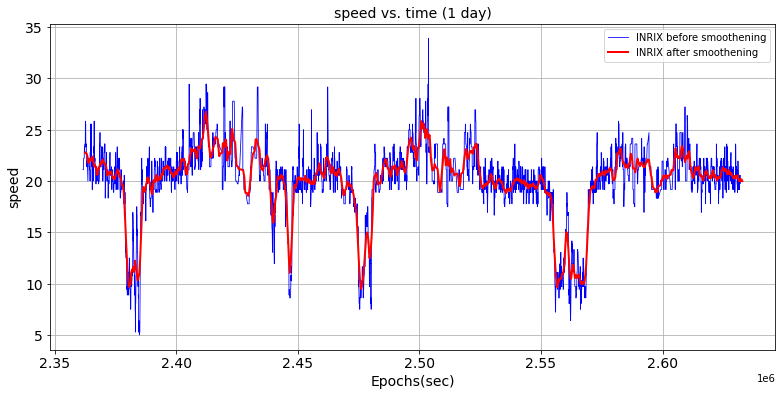

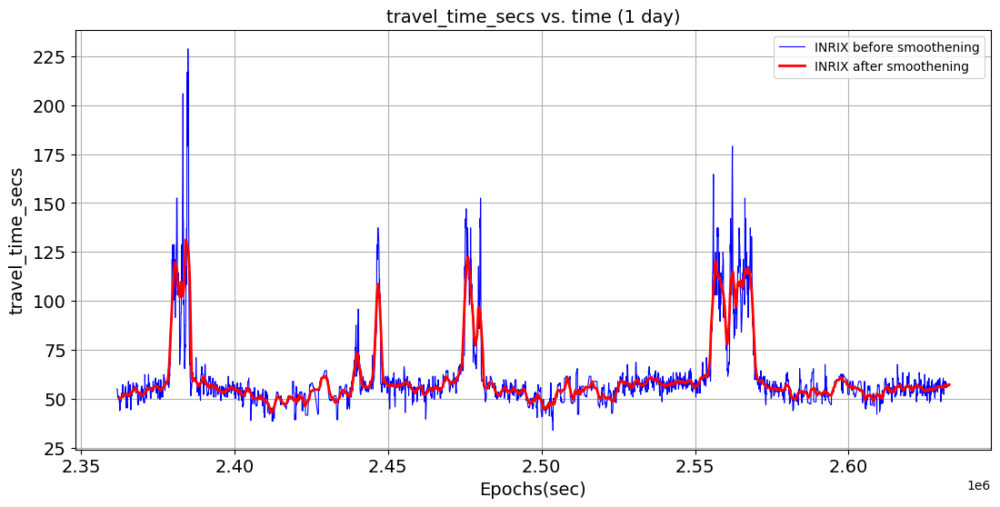

In [ ]:
# Plot original speed and smoothened speed for INRIX
plt.figure(figsize=(13, 6))
plotAttr2DF(1, inrixSouth_removed.iloc[1440*26:1440*29], inrixSouth_MA.iloc[1440*26:1440*29], 
            'Epoch_inrix', 'speed', 'INRIX before smoothening', 'INRIX after smoothening')

# Plot original travel time and smoothened one for INRIX
plt.figure(figsize=(13, 6))
plotAttr2DF(1, inrixSouth_removed.iloc[1440*26:1440*29], inrixSouth_MA.iloc[1440*26:1440*29], 
            'Epoch_inrix', 'travel_time_secs', 'INRIX before smoothening', 'INRIX after smoothening')

### 2.4.2 smoothen the INRIX North

In [ ]:
# observe the first x rows and last x rows of inrix dataset (before smoothening)
inrixNorth_removed

,segmentid,timestamputc,speed,average,reference,score,cvalue,travel_time_secs,date_inrix,Epoch_inrix
0,225285973,2018-10-01 00:00:14,25.833333,16.666667,16.666667,30,49,19.92,2018-10-01 02:00:14,0.0
1,225285973,2018-10-01 00:01:12,25.833333,16.666667,16.666667,30,50,19.92,2018-10-01 02:01:12,58.0
2,225285973,2018-10-01 00:02:10,25.833333,16.666667,16.666667,30,52,19.92,2018-10-01 02:02:10,116.0
3,225285973,2018-10-01 00:03:11,25.833333,16.666667,16.666667,30,53,19.92,2018-10-01 02:03:11,177.0
4,225285973,2018-10-01 00:04:11,25.833333,16.666667,16.666667,30,55,19.92,2018-10-01 02:04:11,237.0
...,...,...,...,...,...,...,...,...,...,...
42412,225285973,2018-10-31 23:55:13,23.333333,16.666667,16.666667,30,99,22.08,2018-11-01 00:55:13,2678099.0
42413,225285973,2018-10-31 23:56:09,23.333333,16.666667,16.666667,30,98,22.08,2018-11-01 00:56:09,2678155.0
42414,225285973,2018-10-31 23:57:10,23.333333,16.666667,16.666667,30,98,22.08,2018-11-01 00:57:09,2678216.0
42415,225285973,2018-10-31 23:58:11,23.333333,16.666667,16.666667,30,97,22.08,2018-11-01 00:58:10,2678277.0


In [ ]:
# smoothen the north speed column by centered moving average
rolling_speed = inrixNorth_removed.speed.rolling(window=MOVING_AVERAGE_WINDOW, center=True)
rolling_mean_speed = rolling_speed.mean()
rolling_mean_speed

0       NaN
1       NaN
2       NaN
3       NaN
4       NaN
         ..
42412   NaN
42413   NaN
42414   NaN
42415   NaN
42416   NaN
Name: speed, Length: 42417, dtype: float64

In [ ]:
# smoothen the north travel time column by centered moving average
rolling_travelTime = inrixNorth_removed.travel_time_secs.rolling(window=MOVING_AVERAGE_WINDOW, center=True)
rolling_mean_travelTime = rolling_travelTime.mean()
rolling_mean_travelTime

0       NaN
1       NaN
2       NaN
3       NaN
4       NaN
         ..
42412   NaN
42413   NaN
42414   NaN
42415   NaN
42416   NaN
Name: travel_time_secs, Length: 42417, dtype: float64

In [ ]:
# add the smoothened columns back to the inrixSouth datafram
inrixNorth_MA = inrixNorth_removed.copy()
inrixNorth_MA.speed = rolling_mean_speed
inrixNorth_MA.travel_time_secs = rolling_mean_travelTime
inrixNorth_MA

,segmentid,timestamputc,speed,average,reference,score,cvalue,travel_time_secs,date_inrix,Epoch_inrix
0,225285973,2018-10-01 00:00:14,NaN,16.666667,16.666667,30,49,NaN,2018-10-01 02:00:14,0.0
1,225285973,2018-10-01 00:01:12,NaN,16.666667,16.666667,30,50,NaN,2018-10-01 02:01:12,58.0
2,225285973,2018-10-01 00:02:10,NaN,16.666667,16.666667,30,52,NaN,2018-10-01 02:02:10,116.0
3,225285973,2018-10-01 00:03:11,NaN,16.666667,16.666667,30,53,NaN,2018-10-01 02:03:11,177.0
4,225285973,2018-10-01 00:04:11,NaN,16.666667,16.666667,30,55,NaN,2018-10-01 02:04:11,237.0
...,...,...,...,...,...,...,...,...,...,...
42412,225285973,2018-10-31 23:55:13,NaN,16.666667,16.666667,30,99,NaN,2018-11-01 00:55:13,2678099.0
42413,225285973,2018-10-31 23:56:09,NaN,16.666667,16.666667,30,98,NaN,2018-11-01 00:56:09,2678155.0
42414,225285973,2018-10-31 23:57:10,NaN,16.666667,16.666667,30,98,NaN,2018-11-01 00:57:09,2678216.0
42415,225285973,2018-10-31 23:58:11,NaN,16.666667,16.666667,30,97,NaN,2018-11-01 00:58:10,2678277.0


In [ ]:
# remove the speed, travel time rows with NaN value due to the moving average process
inrixNorth_MA = inrixNorth_MA.dropna()
inrixNorth_MA.reset_index(inplace=True, drop=True)
inrixNorth_MA

,segmentid,timestamputc,speed,average,reference,score,cvalue,travel_time_secs,date_inrix,Epoch_inrix
0,225285973,2018-10-01 00:15:14,20.333333,16.666667,16.666667,30,30,26.130,2018-10-01 02:15:14,900.0
1,225285973,2018-10-01 00:16:11,20.111111,16.666667,16.666667,30,35,26.362,2018-10-01 02:16:11,957.0
2,225285973,2018-10-01 00:17:16,19.888889,16.666667,16.666667,30,39,26.594,2018-10-01 02:17:16,1022.0
3,225285973,2018-10-01 00:18:10,19.666667,16.666667,16.666667,30,91,26.826,2018-10-01 02:18:10,1076.0
4,225285973,2018-10-01 00:19:11,19.444444,16.666667,16.666667,30,94,27.058,2018-10-01 02:19:11,1137.0
...,...,...,...,...,...,...,...,...,...,...
42383,225285973,2018-10-31 23:41:10,23.657407,16.666667,16.666667,30,43,22.018,2018-11-01 00:41:09,2677256.0
42384,225285973,2018-10-31 23:42:11,23.629630,16.666667,16.666667,30,40,22.044,2018-11-01 00:42:10,2677317.0
42385,225285973,2018-10-31 23:43:11,23.601852,16.666667,16.666667,30,44,22.070,2018-11-01 00:43:11,2677377.0
42386,225285973,2018-10-31 23:44:10,23.675926,16.666667,16.666667,30,46,21.982,2018-11-01 00:44:10,2677436.0


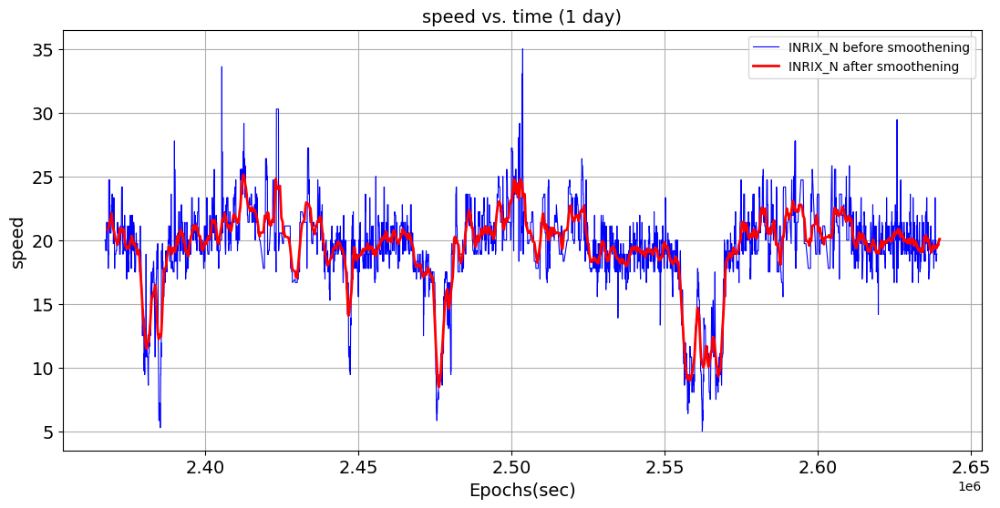

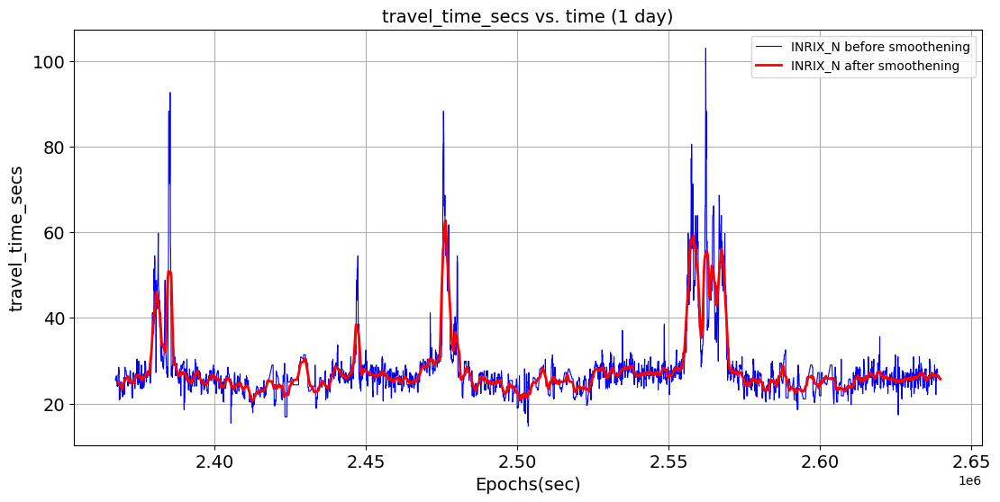

In [ ]:
# Plot original speed and smoothened speed for INRIX North
plt.figure(figsize=(13, 6))
plotAttr2DF(1, inrixNorth_removed.iloc[1440*26:1440*29], inrixNorth_MA.iloc[1440*26:1440*29], 
            'Epoch_inrix', 'speed', 'INRIX_N before smoothening', 'INRIX_N after smoothening')

# Plot original travel time and smoothened one for INRIX North
plt.figure(figsize=(13, 6))
plotAttr2DF(1, inrixNorth_removed.iloc[1440*26:1440*29], inrixNorth_MA.iloc[1440*26:1440*29], 
            'Epoch_inrix', 'travel_time_secs', 'INRIX_N before smoothening', 'INRIX_N after smoothening')

### 2.4.3 compare the inrix south with north after smoothening

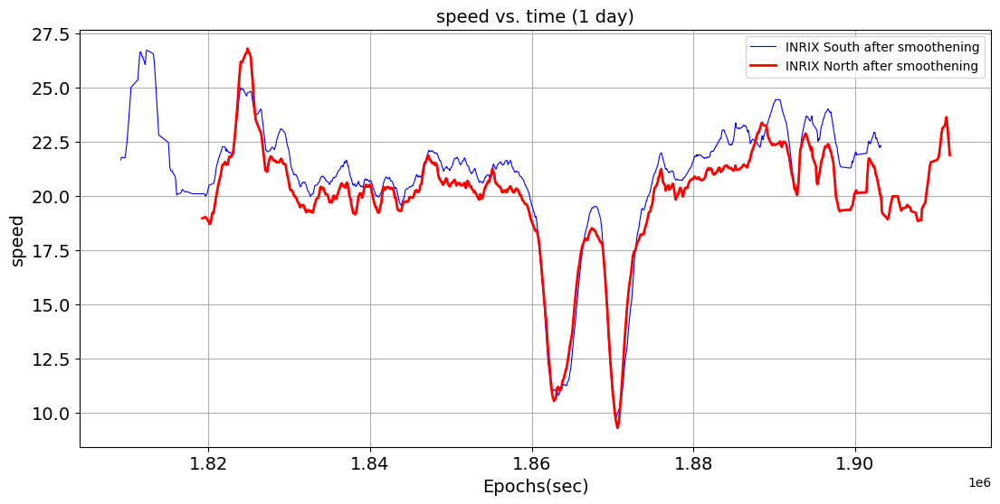

In [ ]:
# Plot smoothened south speed and smoothened north speed
ST = 20
END = 21
plt.figure(figsize=(13, 6))
plotAttr2DF(1, inrixSouth_MA.iloc[1440*ST:1440*END], inrixNorth_MA.iloc[1440*ST:1440*END], 
            'Epoch_inrix', 'speed', 'INRIX South after smoothening', 'INRIX North after smoothening')

# 3. Explore and Pre-process MCS data

## 3.1 Check distribution of speed and flow

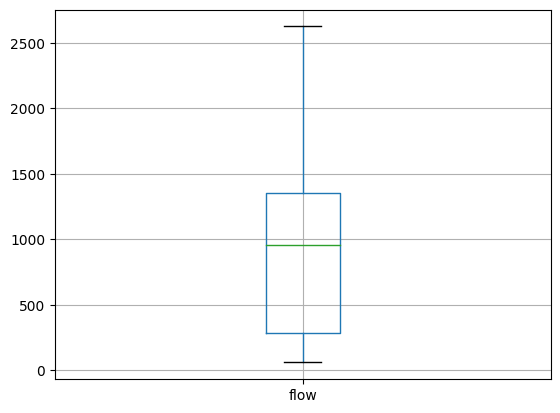

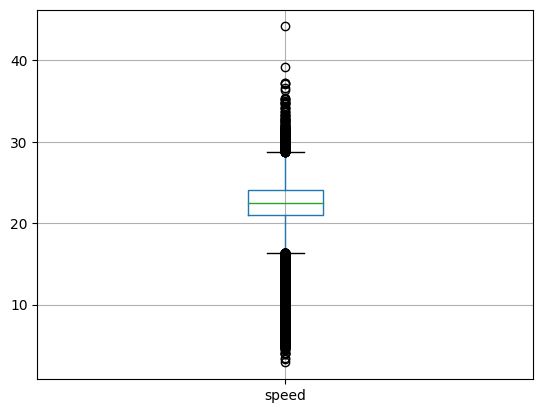

In [ ]:
#check the distribution of MCS speed and flow
# check is there any outlier needs to be filtered
mcsSouth = mcsSouth_raw.copy()

plt.style.use('default')
plt.figure(1)
boxplot1 = mcsSouth.boxplot(column=['flow'])

plt.figure(2)
boxplot2 = mcsSouth.boxplot(column=['speed']) 

## 3.2 Convert to Datetime & Calculate the Epoch

In [ ]:
print(mcsSouth.head(10))
mcsSouth.info()

   fk_id                 date    speed  ...    used_lanes  Epoch_mcs   Density
0   1159  2018-10-01 00:00:00  26.6028  ...     {1,1,1,1}        0.0  0.103373
1   1159  2018-10-01 00:01:00  26.0600  ...  {1,1,1,NULL}       60.0  0.102328
2   1159  2018-10-01 00:02:00  25.0705  ...     {1,1,1,1}      120.0  0.069803
3   1159  2018-10-01 00:03:00  27.2009  ...  {1,1,1,NULL}      180.0  0.134799
4   1159  2018-10-01 00:04:00  24.9600  ...  {1,1,1,NULL}      240.0  0.120192
5   1159  2018-10-01 00:05:00  24.5883  ...     {1,1,1,1}      300.0  0.142344
6   1159  2018-10-01 00:06:00  25.9390  ...     {1,1,1,1}      360.0  0.096380
7   1159  2018-10-01 00:07:00  25.6567  ...  {1,1,1,NULL}      420.0  0.129921
8   1159  2018-10-01 00:08:00  26.5114  ...  {1,1,1,NULL}      480.0  0.163452
9   1159  2018-10-01 00:09:00  23.9637  ...  {1,1,1,NULL}      540.0  0.083460

[10 rows x 8 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44275 entries, 0 to 44274
Data columns (total 8 columns):


In [ ]:
# convert column "date" into Datetime objects, add back into original column "date"
convertToDateD = lambda row: datetime.strptime(row['date'], "%Y-%m-%d %H:%M:%S")
mcsSouth['date'] = mcsSouth.apply(convertToDateD, axis=1)

# check the datatype after convertion
print(mcsSouth.info())
mcsSouth.head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44275 entries, 0 to 44274
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   fk_id          44275 non-null  int64         
 1   date           44275 non-null  datetime64[ns]
 2   speed          44275 non-null  float64       
 3   speed_std_dev  44275 non-null  float64       
 4   flow           44275 non-null  int64         
 5   used_lanes     44275 non-null  object        
 6   Epoch_mcs      44275 non-null  float64       
 7   Density        44275 non-null  float64       
dtypes: datetime64[ns](1), float64(4), int64(2), object(1)
memory usage: 2.7+ MB
None


,fk_id,date,speed,speed_std_dev,flow,used_lanes,Epoch_mcs,Density
0,1159,2018-10-01 00:00:00,26.6028,7.18940,165,"{1,1,1,1}",0.0,0.103373
1,1159,2018-10-01 00:01:00,26.0600,4.10961,160,"{1,1,1,NULL}",60.0,0.102328
2,1159,2018-10-01 00:02:00,25.0705,9.05539,105,"{1,1,1,1}",120.0,0.069803
3,1159,2018-10-01 00:03:00,27.2009,4.54606,220,"{1,1,1,NULL}",180.0,0.134799
4,1159,2018-10-01 00:04:00,24.9600,7.93025,180,"{1,1,1,NULL}",240.0,0.120192
5,1159,2018-10-01 00:05:00,24.5883,5.61249,210,"{1,1,1,1}",300.0,0.142344
6,1159,2018-10-01 00:06:00,25.9390,3.90512,150,"{1,1,1,1}",360.0,0.096380
7,1159,2018-10-01 00:07:00,25.6567,11.08550,200,"{1,1,1,NULL}",420.0,0.129921
8,1159,2018-10-01 00:08:00,26.5114,1.63299,260,"{1,1,1,NULL}",480.0,0.163452
9,1159,2018-10-01 00:09:00,23.9637,5.35413,120,"{1,1,1,NULL}",540.0,0.083460


In [ ]:
# calculate the Epoch according to the date
mcsSouth['Epoch_test'] = 0.0

for i in range(len(mcsSouth)):
  mcsSouth.at[i, 'Epoch_test'] = calEpoch(mcsSouth, 'date', i)

mcsSouth.iloc[idx(mcsSouth,28)+140:idx(mcsSouth, 28) + 150]

,fk_id,date,speed,speed_std_dev,flow,used_lanes,Epoch_mcs,Density,Epoch_test
38718,1159,2018-10-28 02:20:00,27.0953,8.64099,240,"{1,1,1,NULL}",2341200.0,0.147627,2341200.0
38719,1159,2018-10-28 02:21:00,25.3771,3.49106,300,"{1,1,1,1}",2341260.0,0.197028,2341260.0
38720,1159,2018-10-28 02:22:00,26.7140,3.11247,255,"{1,1,1,1}",2341320.0,0.159093,2341320.0
38721,1159,2018-10-28 02:23:00,25.6813,4.26468,255,"{1,1,1,1}",2341380.0,0.165490,2341380.0
38722,1159,2018-10-28 02:24:00,25.5556,0.00000,240,"{1,NULL,NULL,NULL}",2341440.0,0.156521,2341440.0
38723,1159,2018-10-28 02:25:00,25.7075,2.16025,320,"{1,1,1,NULL}",2341500.0,0.207462,2341500.0
38724,1159,2018-10-28 02:26:00,25.9797,2.62467,200,"{1,1,1,NULL}",2345160.0,0.128305,2341560.0
38725,1159,2018-10-28 02:27:00,25.4681,1.65831,210,"{1,1,1,1}",2345220.0,0.137427,2341620.0
38726,1159,2018-10-28 02:28:00,24.9351,7.94906,210,"{1,1,1,1}",2345280.0,0.140364,2341680.0
38727,1159,2018-10-28 02:29:00,26.4942,10.42830,165,"{1,1,1,1}",2345340.0,0.103796,2341740.0


In [ ]:
# assign the new epoch to 'Epoch_mcs', drop the test epoch column
mcsSouth.Epoch_mcs = mcsSouth.Epoch_test
mcsSouth.drop(columns='Epoch_test', inplace=True)
mcsSouth

,fk_id,date,speed,speed_std_dev,flow,used_lanes,Epoch_mcs,Density
0,1159,2018-10-01 00:00:00,26.6028,7.18940,165,"{1,1,1,1}",0.0,0.103373
1,1159,2018-10-01 00:01:00,26.0600,4.10961,160,"{1,1,1,NULL}",60.0,0.102328
2,1159,2018-10-01 00:02:00,25.0705,9.05539,105,"{1,1,1,1}",120.0,0.069803
3,1159,2018-10-01 00:03:00,27.2009,4.54606,220,"{1,1,1,NULL}",180.0,0.134799
4,1159,2018-10-01 00:04:00,24.9600,7.93025,180,"{1,1,1,NULL}",240.0,0.120192
...,...,...,...,...,...,...,...,...
44270,1159,2018-10-31 23:40:00,23.0849,3.80789,195,"{1,1,1,1}",2677200.0,0.140785
44271,1159,2018-10-31 23:41:00,23.8088,24.46810,315,"{1,1,1,1}",2677260.0,0.220507
44272,1159,2018-10-31 23:42:00,22.5673,6.86932,360,"{1,1,1,1}",2677320.0,0.265871
44273,1159,2018-10-31 23:43:00,24.9865,3.50000,285,"{1,1,1,1}",2677380.0,0.190103


## 3.3 Smoothen MCS Speed and Flow

In [ ]:
# smoothen the speed column by centered moving average
rolling_speed = mcsSouth.speed.rolling(window=MOVING_AVERAGE_WINDOW, center=True)
rolling_mean_speed = rolling_speed.mean()
rolling_mean_speed

0       NaN
1       NaN
2       NaN
3       NaN
4       NaN
         ..
44270   NaN
44271   NaN
44272   NaN
44273   NaN
44274   NaN
Name: speed, Length: 44275, dtype: float64

In [ ]:
# smoothen the flow column by centered moving average
rolling_flow = mcsSouth.flow.rolling(window=MOVING_AVERAGE_WINDOW, center=True)
rolling_mean_flow = rolling_flow.mean()
rolling_mean_flow

0       NaN
1       NaN
2       NaN
3       NaN
4       NaN
         ..
44270   NaN
44271   NaN
44272   NaN
44273   NaN
44274   NaN
Name: flow, Length: 44275, dtype: float64

In [ ]:
# add the smoothened columns back to the datafram
mcsSouth_MA = mcsSouth.copy()
mcsSouth_MA.speed = rolling_mean_speed
mcsSouth_MA.flow = rolling_mean_flow
mcsSouth_MA

,fk_id,date,speed,speed_std_dev,flow,used_lanes,Epoch_mcs,Density
0,1159,2018-10-01 00:00:00,NaN,7.18940,NaN,"{1,1,1,1}",0.0,0.103373
1,1159,2018-10-01 00:01:00,NaN,4.10961,NaN,"{1,1,1,NULL}",60.0,0.102328
2,1159,2018-10-01 00:02:00,NaN,9.05539,NaN,"{1,1,1,1}",120.0,0.069803
3,1159,2018-10-01 00:03:00,NaN,4.54606,NaN,"{1,1,1,NULL}",180.0,0.134799
4,1159,2018-10-01 00:04:00,NaN,7.93025,NaN,"{1,1,1,NULL}",240.0,0.120192
...,...,...,...,...,...,...,...,...
44270,1159,2018-10-31 23:40:00,NaN,3.80789,NaN,"{1,1,1,1}",2677200.0,0.140785
44271,1159,2018-10-31 23:41:00,NaN,24.46810,NaN,"{1,1,1,1}",2677260.0,0.220507
44272,1159,2018-10-31 23:42:00,NaN,6.86932,NaN,"{1,1,1,1}",2677320.0,0.265871
44273,1159,2018-10-31 23:43:00,NaN,3.50000,NaN,"{1,1,1,1}",2677380.0,0.190103


In [ ]:
# remove the rows with NaN value due to the moving average process
mcsSouth_MA = mcsSouth_MA.dropna()
mcsSouth_MA.reset_index(inplace=True, drop=True)
mcsSouth_MA

,fk_id,date,speed,speed_std_dev,flow,used_lanes,Epoch_mcs,Density
0,1159,2018-10-01 00:15:00,25.990230,4.96655,171.333333,"{1,1,1,NULL}",900.0,0.065712
1,1159,2018-10-01 00:16:00,25.870637,6.23610,172.333333,"{1,1,1,NULL}",960.0,0.137527
2,1159,2018-10-01 00:17:00,25.843917,11.77660,171.000000,"{1,1,1,1}",1020.0,0.076174
3,1159,2018-10-01 00:18:00,25.850987,7.00000,174.000000,"{1,1,NULL,NULL}",1080.0,0.189890
4,1159,2018-10-01 00:19:00,25.780037,6.68331,172.666667,"{1,1,1,NULL}",1140.0,0.060373
...,...,...,...,...,...,...,...,...
44241,1159,2018-10-31 23:26:00,23.840493,7.25718,288.666667,"{1,1,1,NULL}",2676360.0,0.141372
44242,1159,2018-10-31 23:27:00,23.891030,5.02494,292.166667,"{1,1,1,1}",2676420.0,0.165950
44243,1159,2018-10-31 23:28:00,23.861783,8.49632,294.666667,"{1,1,1,1}",2676480.0,0.201262
44244,1159,2018-10-31 23:29:00,23.885273,5.04975,287.500000,"{1,1,1,1}",2676540.0,0.181899


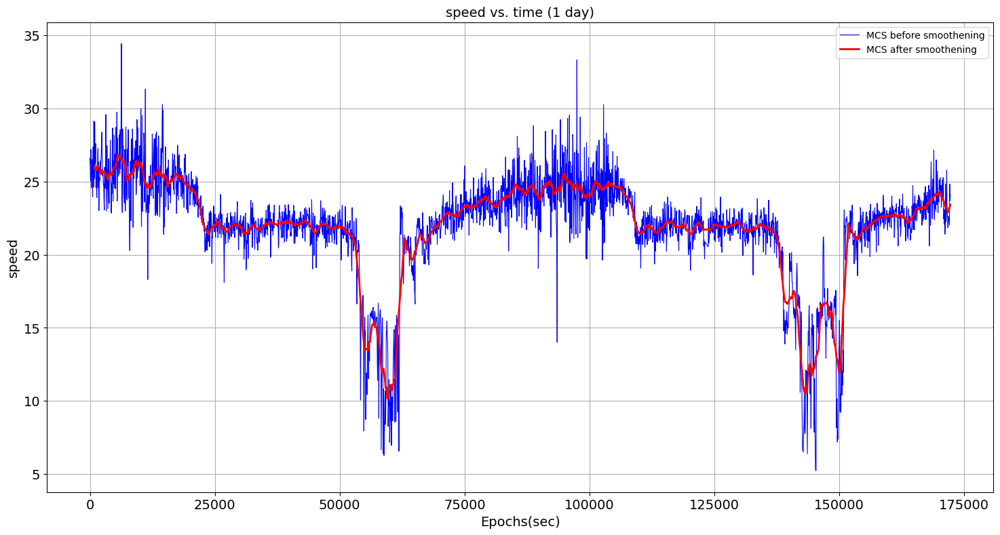

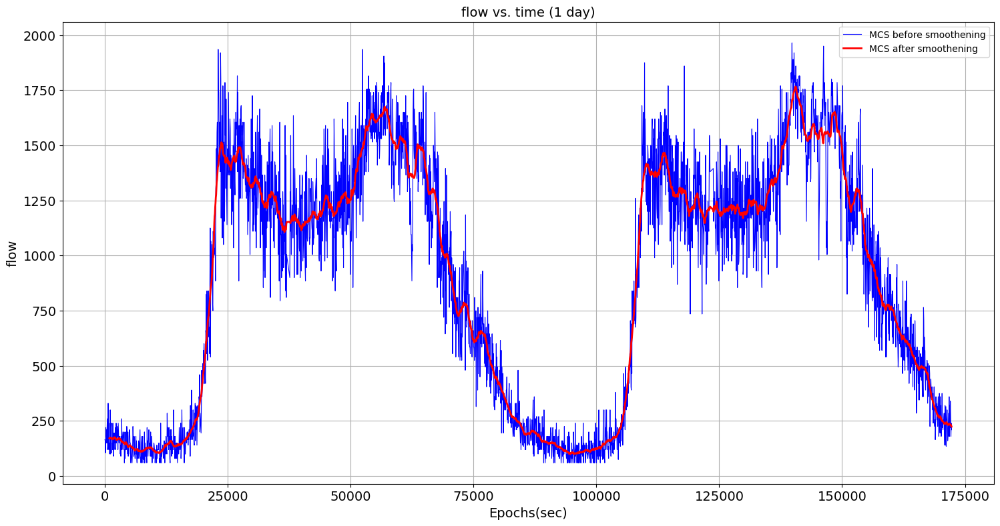

In [ ]:
# Plot original speed and smoothened speed for MCS
plt.figure(figsize=(18, 9))
plotAttr2DF(1, mcsSouth.iloc[:idx(mcsSouth, 3)], mcsSouth_MA.iloc[:idx(mcsSouth_MA, 3)], 
            'Epoch_mcs', 'speed', 'MCS before smoothening', 'MCS after smoothening')

# Plot original flow and smoothened flow for MCS
plt.figure(figsize=(18, 9))
plotAttr2DF(1, mcsSouth.iloc[:idx(mcsSouth, 3)], mcsSouth_MA.iloc[:idx(mcsSouth_MA, 3)], 
            'Epoch_mcs', 'flow', 'MCS before smoothening', 'MCS after smoothening')

# 4. Pre-process(Combine) both MCS and INRIX South/North dataframes

*  Match the corresponding timesteps between MCS and INRIX

## 4.1 Shift the time-lag of INRIX South

In [ ]:
# Shift Epoch_inrix of INRIX south by adding 114 mins in order to eliminate the time-gap  
inrixSouth_shifted = inrixSouth_MA
print(inrixSouth_shifted)
inrixSouth_shifted['Epoch_inrix'] = inrixSouth_shifted.Epoch_inrix + (114 * 60)
print(inrixSouth_shifted)

        segmentid        timestamputc  ...          date_inrix  Epoch_inrix
0      1071883675 2018-10-01 00:15:11  ... 2018-10-01 02:15:11        899.0
1      1071883675 2018-10-01 00:16:09  ... 2018-10-01 02:16:09        957.0
2      1071883675 2018-10-01 00:17:14  ... 2018-10-01 02:17:14       1022.0
3      1071883675 2018-10-01 00:18:08  ... 2018-10-01 02:18:08       1076.0
4      1071883675 2018-10-01 00:19:09  ... 2018-10-01 02:19:09       1137.0
...           ...                 ...  ...                 ...          ...
42498  1071883675 2018-10-31 23:41:08  ... 2018-11-01 00:41:08    2677256.0
42499  1071883675 2018-10-31 23:42:09  ... 2018-11-01 00:42:09    2677317.0
42500  1071883675 2018-10-31 23:43:08  ... 2018-11-01 00:43:08    2677376.0
42501  1071883675 2018-10-31 23:44:09  ... 2018-11-01 00:44:08    2677437.0
42502  1071883675 2018-10-31 23:45:15  ... 2018-11-01 00:45:15    2677503.0

[42503 rows x 10 columns]
        segmentid        timestamputc  ...          date_inri

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [ ]:
# Shift Epoch_inrix of INRIX north by adding 114 mins in order to eliminate the time-gap  
inrixNorth_shifted = inrixNorth_MA
print(inrixNorth_shifted)
inrixNorth_shifted['Epoch_inrix'] = inrixNorth_shifted.Epoch_inrix + (114 * 60)
print(inrixNorth_shifted)

       segmentid        timestamputc  ...          date_inrix  Epoch_inrix
0      225285973 2018-10-01 00:15:14  ... 2018-10-01 02:15:14        900.0
1      225285973 2018-10-01 00:16:11  ... 2018-10-01 02:16:11        957.0
2      225285973 2018-10-01 00:17:16  ... 2018-10-01 02:17:16       1022.0
3      225285973 2018-10-01 00:18:10  ... 2018-10-01 02:18:10       1076.0
4      225285973 2018-10-01 00:19:11  ... 2018-10-01 02:19:11       1137.0
...          ...                 ...  ...                 ...          ...
42383  225285973 2018-10-31 23:41:10  ... 2018-11-01 00:41:09    2677256.0
42384  225285973 2018-10-31 23:42:11  ... 2018-11-01 00:42:10    2677317.0
42385  225285973 2018-10-31 23:43:11  ... 2018-11-01 00:43:11    2677377.0
42386  225285973 2018-10-31 23:44:10  ... 2018-11-01 00:44:10    2677436.0
42387  225285973 2018-10-31 23:45:19  ... 2018-11-01 00:45:19    2677505.0

[42388 rows x 10 columns]
       segmentid        timestamputc  ...          date_inrix  Epoch_inri

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


## 4.2 Match the MCS and INRIX south data rows in the same timesteps




In [ ]:
# function to match inrix timesteps to mcs, and merge them
# Input: mcs dataframe, inrix dataframe
# output: return a new dataframe combines both dataframes after the time-step matching
def matchTimeStep (mcsDf, inrixDf):
  DELTATIME = 26.0
  mcsMatched = pd.DataFrame(columns = mcsDf.columns)
  inrixMatched = pd.DataFrame(columns = inrixDf.columns)
  print(mcsMatched)
  print(inrixMatched)
  i = 0
  j = 0
  while ((j < len(inrixDf)) & (i < len(mcsDf))):
    mcsEpoch = mcsDf.iloc[i]['Epoch_mcs']
    inrixEpoch = inrixDf.iloc[j]['Epoch_inrix']
    # if the difference in epoch between mcs and inrix is smaller than 25 sec,
    # they are in the same time step (within same min interval)
    if (abs(inrixEpoch - mcsEpoch) < DELTATIME ):
      mcsMatched = mcsMatched.append(mcsDf.iloc[i], ignore_index = True)
      inrixMatched = inrixMatched.append(inrixDf.iloc[j], ignore_index = True)
      i += 1
      j += 1
      if(i % 1000.0 == 0): print(mcsMatched)
    elif ((inrixEpoch - mcsEpoch) < 0.0):
      j += 1
      print('missing mcs', j)
    elif ((inrixEpoch -mcsEpoch) > 0.0):
      i +=1
      print('missing inrix', i)
  
  print('length of mcsMatched: ', len(mcsMatched))
  print('length of inrixMatched: ', len(inrixMatched))

  print(inrixMatched.columns)
  inrixMatched.rename(columns = {'speed': 'speed_inrix'}, inplace = True)
  print(inrixMatched.columns)
  
  combinedDf = pd.concat([mcsMatched, inrixMatched], axis=1)
  print('length of combined df:', len(combinedDf))
  
  return combinedDf
  

In [ ]:
# match the shifted inrix with mcs dataframe and combined them
# Notice: a lot of log will be printed out for progress monitoring 
combinedSouth_shifted = matchTimeStep(mcsSouth_MA, inrixSouth_shifted)

Empty DataFrame
Columns: [fk_id, date, speed, speed_std_dev, flow, used_lanes, Epoch_mcs, Density]
Index: []
Empty DataFrame
Columns: [segmentid, timestamputc, speed, average, reference, score, cvalue, travel_time_secs, date_inrix, Epoch_inrix]
Index: []
missing inrix 1
missing inrix 2
missing inrix 3
missing inrix 4
missing inrix 5
missing inrix 6
missing inrix 7
missing inrix 8
missing inrix 9
missing inrix 10
missing inrix 11
missing inrix 12
missing inrix 13
missing inrix 14
missing inrix 15
missing inrix 16
missing inrix 17
missing inrix 18
missing inrix 19
missing inrix 20
missing inrix 21
missing inrix 22
missing inrix 23
missing inrix 24
missing inrix 25
missing inrix 26
missing inrix 27
missing inrix 28
missing inrix 29
missing inrix 30
missing inrix 31
missing inrix 32
missing inrix 33
missing inrix 34
missing inrix 35
missing inrix 36
missing inrix 37
missing inrix 38
missing inrix 39
missing inrix 40
missing inrix 41
missing inrix 42
missing inrix 43
missing inrix 44
missin

In [ ]:
combinedSouth_shifted[['date', 'speed', 'Epoch_mcs', 'timestamputc', 'speed_inrix', 'Epoch_inrix']]

,date,speed,Epoch_mcs,timestamputc,speed_inrix,Epoch_inrix
0,2018-10-01 02:09:00,25.379647,7740.0,2018-10-01 00:15:11,21.490741,7739.0
1,2018-10-01 02:10:00,25.301860,7800.0,2018-10-01 00:16:09,21.268519,7797.0
2,2018-10-01 02:11:00,25.398467,7860.0,2018-10-01 00:17:14,21.046296,7862.0
3,2018-10-01 02:12:00,25.374270,7920.0,2018-10-01 00:18:08,20.787037,7916.0
4,2018-10-01 02:13:00,25.312143,7980.0,2018-10-01 00:19:09,20.527778,7977.0
...,...,...,...,...,...,...
42044,2018-10-31 23:26:00,23.840493,2676360.0,2018-10-31 21:32:09,20.953704,2676357.0
42045,2018-10-31 23:27:00,23.891030,2676420.0,2018-10-31 21:33:08,20.944444,2676416.0
42046,2018-10-31 23:28:00,23.861783,2676480.0,2018-10-31 21:34:10,21.046296,2676478.0
42047,2018-10-31 23:29:00,23.885273,2676540.0,2018-10-31 21:35:09,21.092593,2676537.0


In [ ]:
# Check the datatype after combining, cast the datatypes to the original types
print(combinedSouth_shifted.info())
print(mcsSouth_MA.info())
print(inrixSouth_shifted.info())
combinedSouth_shifted = combinedSouth_shifted.astype({'fk_id':'int64', 'flow':'int64', 
                                                      'segmentid':'int64', 'Epoch_inrix':'int64', 
                                                      'score': 'int64', 'cvalue': 'int64'})
combinedSouth_shifted.info()
combinedSouth_shifted.head(3)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42049 entries, 0 to 42048
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   fk_id             42049 non-null  object        
 1   date              42049 non-null  datetime64[ns]
 2   speed             42049 non-null  float64       
 3   speed_std_dev     42049 non-null  float64       
 4   flow              42049 non-null  float64       
 5   used_lanes        42049 non-null  object        
 6   Epoch_mcs         42049 non-null  float64       
 7   Density           42049 non-null  float64       
 8   segmentid         42049 non-null  object        
 9   timestamputc      42049 non-null  datetime64[ns]
 10  speed_inrix       42049 non-null  float64       
 11  average           42049 non-null  float64       
 12  reference         42049 non-null  float64       
 13  score             42049 non-null  object        
 14  cvalue            4204

,fk_id,date,speed,speed_std_dev,flow,used_lanes,Epoch_mcs,Density,segmentid,timestamputc,speed_inrix,average,reference,score,cvalue,travel_time_secs,date_inrix,Epoch_inrix
0,1159,2018-10-01 02:09:00,25.379647,12.19290,116,"{1,1,1,NULL}",7740.0,0.055834,1071883675,2018-10-01 00:15:11,21.490741,18.888889,18.888889,30,23,54.094,2018-10-01 02:15:11,7739
1,1159,2018-10-01 02:10:00,25.301860,6.32456,114,"{1,1,1,1}",7800.0,0.049002,1071883675,2018-10-01 00:16:09,21.268519,18.888889,18.888889,30,28,54.608,2018-10-01 02:16:09,7797
2,1159,2018-10-01 02:11:00,25.398467,6.50000,115,"{1,1,NULL,NULL}",7860.0,0.083710,1071883675,2018-10-01 00:17:14,21.046296,18.888889,18.888889,30,32,55.122,2018-10-01 02:17:14,7862


## 4.3 Match the MCS/INRIX_South and INRIX North data rows in the same timesteps

In [ ]:
# function to match inrix timesteps to mcs, and merge them
# Input: mcs dataframe, inrix dataframe
# output: return a new dataframe combines both dataframes after the time-step matching
def matchTimeStepNeighbor (mcsDf, inrixDf):
  DELTATIME = 26.0
  mcsMatched = pd.DataFrame(columns = mcsDf.columns)
  inrixMatched = pd.DataFrame(columns = inrixDf.columns)
  print(mcsMatched)
  print(inrixMatched)
  i = 0
  j = 0
  while ((j < len(inrixDf)) & (i < len(mcsDf))):
    mcsEpoch = mcsDf.iloc[i]['Epoch_mcs']
    inrixEpoch = inrixDf.iloc[j]['Epoch_inrix_up'] # change the epoch name to up/downstream
    # if the difference in epoch between mcs and inrix is smaller than 25 sec,
    # they are in the same time step (within same min interval)
    if (abs(inrixEpoch - mcsEpoch) < DELTATIME ):
      mcsMatched = mcsMatched.append(mcsDf.iloc[i], ignore_index = True)
      inrixMatched = inrixMatched.append(inrixDf.iloc[j], ignore_index = True)
      i += 1
      j += 1
      if(i % 1000.0 == 0): print(mcsMatched)
    elif ((inrixEpoch - mcsEpoch) < 0.0):
      j += 1
      print('missing mcs', j)
    elif ((inrixEpoch - mcsEpoch) > 0.0):
      i +=1
      print('missing inrix', i)
  
  print('length of mcsMatched: ', len(mcsMatched))
  print('length of inrixMatched: ', len(inrixMatched))

  print(inrixMatched.columns)
  
  combinedDf = pd.concat([mcsMatched, inrixMatched], axis=1)
  print('length of combined dataframe:', len(combinedDf))
  
  return combinedDf

In [ ]:
inrixNorth_shifted.head(1)

,segmentid,timestamputc,speed,average,reference,score,cvalue,travel_time_secs,date_inrix,Epoch_inrix
0,225285973,2018-10-01 00:15:14,20.333333,16.666667,16.666667,30,30,26.13,2018-10-01 02:15:14,7740.0


In [ ]:
inrixNorth_features = inrixNorth_shifted[['speed', 'travel_time_secs', 'Epoch_inrix']]
inrixNorth_features.rename(columns = {'speed': 'speed_inrix_up','travel_time_secs':'travel_time_secs_up', 'Epoch_inrix':'Epoch_inrix_up'}, inplace = True)
inrixNorth_features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42388 entries, 0 to 42387
Data columns (total 3 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   speed_inrix_up       42388 non-null  float64
 1   travel_time_secs_up  42388 non-null  float64
 2   Epoch_inrix_up       42388 non-null  float64
dtypes: float64(3)
memory usage: 993.6 KB


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:4133: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [ ]:
# match the shifted inrix with mcs dataframe and combined them
# Notice: a lot of log will be printed out for progress monitoring 
combinedSouth_shifted = matchTimeStepNeighbor(combinedSouth_shifted, inrixNorth_features)

Empty DataFrame
Columns: [fk_id, date, speed, speed_std_dev, flow, used_lanes, Epoch_mcs, Density, segmentid, timestamputc, speed_inrix, average, reference, score, cvalue, travel_time_secs, date_inrix, Epoch_inrix]
Index: []
Empty DataFrame
Columns: [speed_inrix_up, travel_time_secs_up, Epoch_inrix_up]
Index: []
missing mcs 50
missing inrix 93
missing inrix 108
missing inrix 109
missing mcs 108
missing mcs 445
missing mcs 446
missing mcs 447
missing mcs 448
missing mcs 449
missing mcs 450
missing mcs 451
missing mcs 452
missing mcs 453
missing mcs 454
    fk_id                date  ...          date_inrix  Epoch_inrix
0    1159 2018-10-01 02:09:00  ... 2018-10-01 02:15:11         7739
1    1159 2018-10-01 02:10:00  ... 2018-10-01 02:16:09         7797
2    1159 2018-10-01 02:11:00  ... 2018-10-01 02:17:14         7862
3    1159 2018-10-01 02:12:00  ... 2018-10-01 02:18:08         7916
4    1159 2018-10-01 02:13:00  ... 2018-10-01 02:19:09         7977
..    ...                 ...  ...

In [ ]:
combinedSouth_shifted[['date', 'speed', 'Epoch_mcs', 'timestamputc', 'speed_inrix', 'Epoch_inrix','speed_inrix_up', 'travel_time_secs_up', 'Epoch_inrix_up']]

,date,speed,Epoch_mcs,timestamputc,speed_inrix,Epoch_inrix,speed_inrix_up,travel_time_secs_up,Epoch_inrix_up
0,2018-10-01 02:09:00,25.379647,7740.0,2018-10-01 00:15:11,21.490741,7739,20.333333,26.130,7740.0
1,2018-10-01 02:10:00,25.301860,7800.0,2018-10-01 00:16:09,21.268519,7797,20.111111,26.362,7797.0
2,2018-10-01 02:11:00,25.398467,7860.0,2018-10-01 00:17:14,21.046296,7862,19.888889,26.594,7862.0
3,2018-10-01 02:12:00,25.374270,7920.0,2018-10-01 00:18:08,20.787037,7916,19.666667,26.826,7916.0
4,2018-10-01 02:13:00,25.312143,7980.0,2018-10-01 00:19:09,20.527778,7977,19.444444,27.058,7977.0
...,...,...,...,...,...,...,...,...,...
41762,2018-10-31 23:26:00,23.840493,2676360.0,2018-10-31 21:32:09,20.953704,2676357,22.425926,23.354,2676356.0
41763,2018-10-31 23:27:00,23.891030,2676420.0,2018-10-31 21:33:08,20.944444,2676416,22.490741,23.270,2676416.0
41764,2018-10-31 23:28:00,23.861783,2676480.0,2018-10-31 21:34:10,21.046296,2676478,22.629630,23.118,2676477.0
41765,2018-10-31 23:29:00,23.885273,2676540.0,2018-10-31 21:35:09,21.092593,2676537,22.694444,23.042,2676537.0


In [ ]:
# Check the datatype after combining, cast the datatypes to the original types
print(combinedSouth_shifted.info())
print(mcsSouth_MA.info())
print(inrixNorth_features.info())
combinedSouth_shifted = combinedSouth_shifted.astype({'fk_id':'int64', 'flow':'int64', 
                                                      'segmentid':'int64','score': 'int64',
                                                      'cvalue': 'int64', 'Epoch_inrix':'float64'})
combinedSouth_shifted.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41767 entries, 0 to 41766
Data columns (total 21 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   fk_id                41767 non-null  object        
 1   date                 41767 non-null  datetime64[ns]
 2   speed                41767 non-null  float64       
 3   speed_std_dev        41767 non-null  float64       
 4   flow                 41767 non-null  object        
 5   used_lanes           41767 non-null  object        
 6   Epoch_mcs            41767 non-null  float64       
 7   Density              41767 non-null  float64       
 8   segmentid            41767 non-null  object        
 9   timestamputc         41767 non-null  datetime64[ns]
 10  speed_inrix          41767 non-null  float64       
 11  average              41767 non-null  float64       
 12  reference            41767 non-null  float64       
 13  score                41767 non-

In [ ]:
# save the processed dataframe into the directory
combinedSouth_shifted.to_pickle('OutData/inrixMcsSouth.pkl')

## 4.4 Data exploration after smoothening, data-steps shifting and matching

<strong>No additional operation on dataframes, only exploration.<strong>
  


In [ ]:
# load the combined/processed dataframe
# start from this cell if data frame has been processed before
combinedSouth_shifted = pd.read_pickle('OutData/inrixMcsSouth.pkl')

In [ ]:
combinedSouth_shifted.describe()

,fk_id,speed,speed_std_dev,flow,Epoch_mcs,Density,segmentid,speed_inrix,average,reference,score,cvalue,travel_time_secs,Epoch_inrix,speed_inrix_up,travel_time_secs_up,Epoch_inrix_up
count,41767.0,41767.000000,41767.000000,41767.000000,4.176700e+04,41767.000000,4.176700e+04,41767.000000,41767.000000,4.176700e+04,41767.000000,41767.000000,41767.000000,4.176700e+04,41767.000000,41767.000000,4.176700e+04
mean,1159.0,21.790229,4.649863,906.398449,1.341337e+06,0.788995,1.071884e+09,20.518941,18.475218,1.888889e+01,29.974621,82.652908,58.789036,1.341335e+06,19.886994,27.530681,1.341335e+06
std,0.0,3.371514,3.213732,509.937348,7.704344e+05,0.607630,0.000000e+00,3.313936,1.296750,1.055524e-11,0.503141,25.867587,16.617866,7.704343e+05,3.130526,9.878668,7.704343e+05
min,1159.0,5.872609,0.000000,93.000000,7.740000e+03,0.025532,1.071884e+09,5.046296,13.888889,1.888889e+01,20.000000,-1.000000,39.654000,7.739000e+03,2.231481,18.964000,7.740000e+03
25%,1159.0,21.156195,2.861380,367.000000,6.716700e+05,0.246092,1.071884e+09,20.148148,17.777778,1.888889e+01,30.000000,76.000000,51.724000,6.716685e+05,19.416667,24.022000,6.716675e+05
50%,1159.0,22.109510,3.897110,1121.000000,1.340460e+06,0.772690,1.071884e+09,21.120370,18.888889,1.888889e+01,30.000000,96.000000,54.266000,1.340459e+06,20.462963,25.250000,1.340458e+06
75%,1159.0,24.247043,5.448620,1337.000000,2.011230e+06,1.103219,1.071884e+09,22.222222,18.888889,1.888889e+01,30.000000,100.000000,56.832000,2.011227e+06,21.546296,26.598000,2.011226e+06
max,1159.0,27.323600,55.500000,1777.000000,2.676600e+06,4.812819,1.071884e+09,29.722222,21.388889,1.888889e+01,30.000000,100.000000,243.594000,2.676597e+06,27.888889,231.546000,2.676596e+06


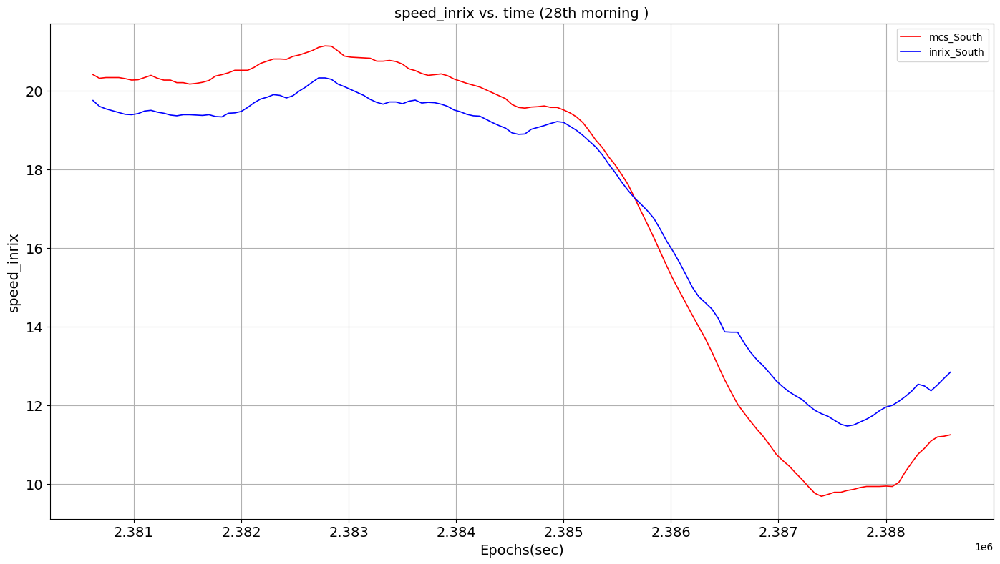

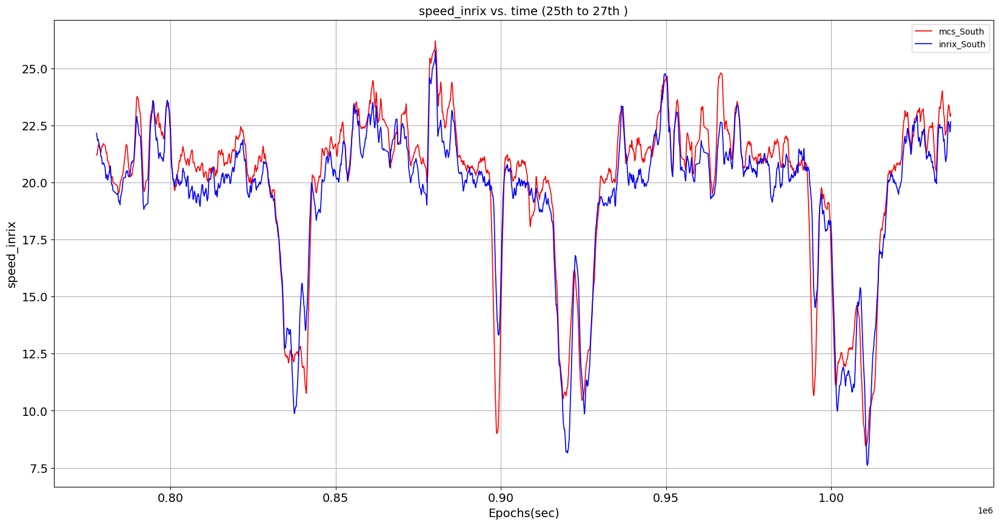

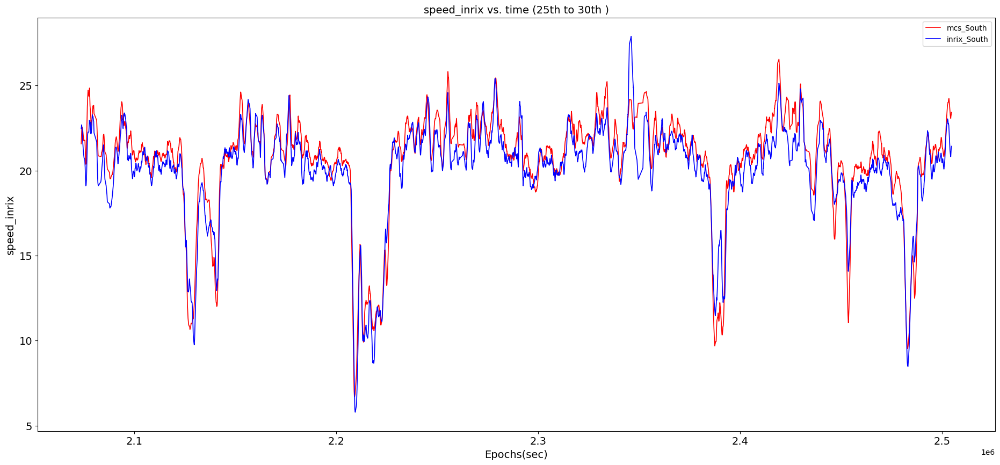

In [ ]:
combinedSouthT_shifted = combinedSouth_shifted.iloc[idx(combinedSouth_shifted, 28) + 700: idx(combinedSouth_shifted, 29) - 500] 
plt.figure(figsize=(17, 9))
plt.grid()
plot2Attr('28th morning', combinedSouthT_shifted, 'speed_inrix', 'speed_inrix_up', 'South')

plt.figure(figsize=(20, 10))
combinedSouthT2_shifted = combinedSouth_shifted.iloc[idx(combinedSouth_shifted, 10) :idx(combinedSouth_shifted, 13)]
plt.grid()
plot2Attr('25th to 27th', combinedSouthT2_shifted, 'speed_inrix', 'speed_inrix_up', 'South')

plt.figure(figsize=(23, 10))
combinedSouthT3_shifted = combinedSouth_shifted.iloc[idx(combinedSouth_shifted, 25) :idx(combinedSouth_shifted, 30)]
plot2Attr('25th to 30th', combinedSouthT3_shifted, 'speed_inrix', 'speed_inrix_up', 'South')

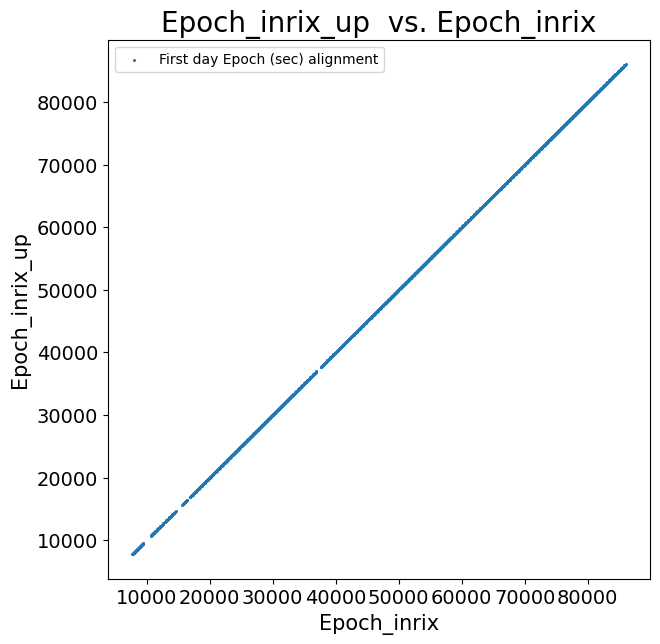

In [ ]:
# draw plot of epoch_mcs vs. epoch_inrix after shifting
plt.figure(figsize = (7, 7))
combinedSouth1day_shifted = combinedSouth_shifted.iloc[:idx(combinedSouth_shifted, 2)]
plotScatter(combinedSouth1day_shifted, combinedSouth1day_shifted, 'Epoch_inrix', 'Epoch_inrix_up','First day Epoch (sec) alignment')

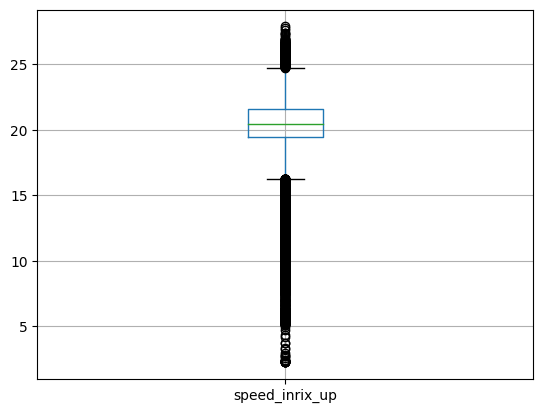

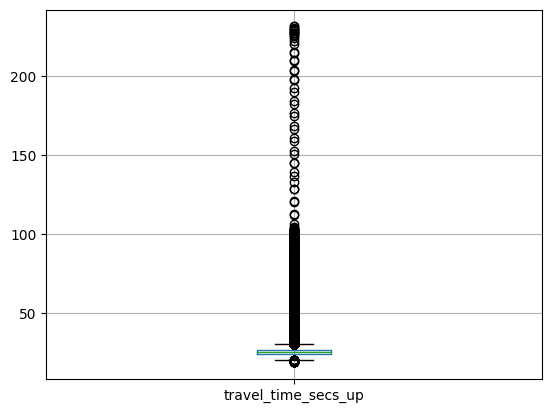

In [ ]:
# check distribution of speed_inrix and tracel_time_secs after remove low score data and match the timesteps among MCS and INRIX

plt.figure(1)
boxplot = combinedSouth_shifted.boxplot(column=['speed_inrix_up'])

plt.figure(2)
boxplot = combinedSouth_shifted.boxplot(column=['travel_time_secs_up'])

             speed_inrix     speed
speed_inrix     1.000000  0.921197
speed           0.921197  1.000000


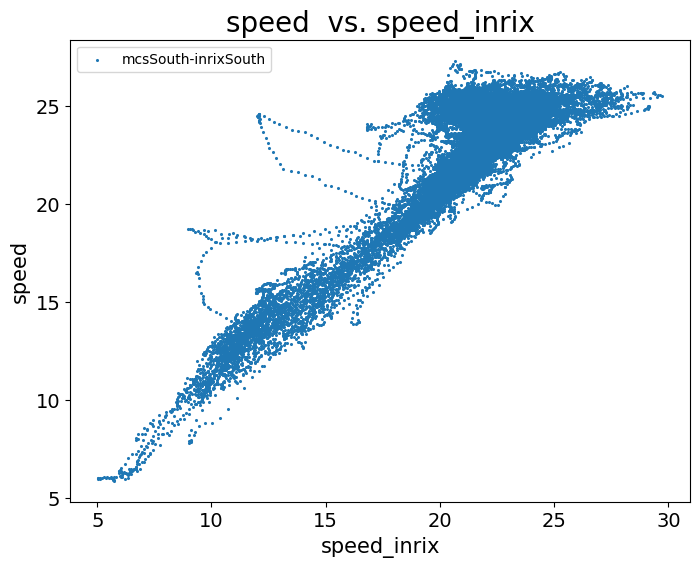

In [ ]:
# draw plot of Speed_mcs vs. Speed_inrix after timestep matching
combinedCorr1 = combinedSouth_shifted.iloc[:idx(combinedSouth_shifted, 28)][['speed_inrix', 'speed']].copy() 
print(combinedCorr1.corr())

plt.figure(figsize=(8,6))
plotScatter(combinedCorr1, combinedCorr1, 'speed_inrix', 'speed', 'mcsSouth-inrixSouth')

                speed_inrix  speed_inrix_up
speed_inrix        1.000000        0.956047
speed_inrix_up     0.956047        1.000000


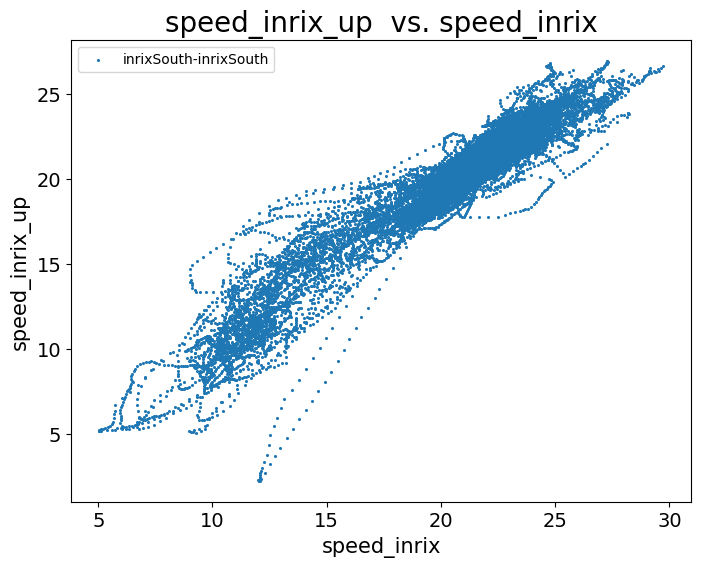

In [ ]:
# draw plot of Speed_inrix(South) vs. Speed_inrix_up (North) after timestep matching
Corr1 = combinedSouth_shifted.iloc[:idx(combinedSouth_shifted, 28)][['speed_inrix', 'speed_inrix_up']].copy() 
print(Corr1.corr())

plt.figure(figsize=(8,6))
plotScatter(Corr1, Corr1, 'speed_inrix', 'speed_inrix_up', 'inrixSouth-inrixSouth')

             speed_inrix      flow
speed_inrix     1.000000 -0.590272
flow           -0.590272  1.000000


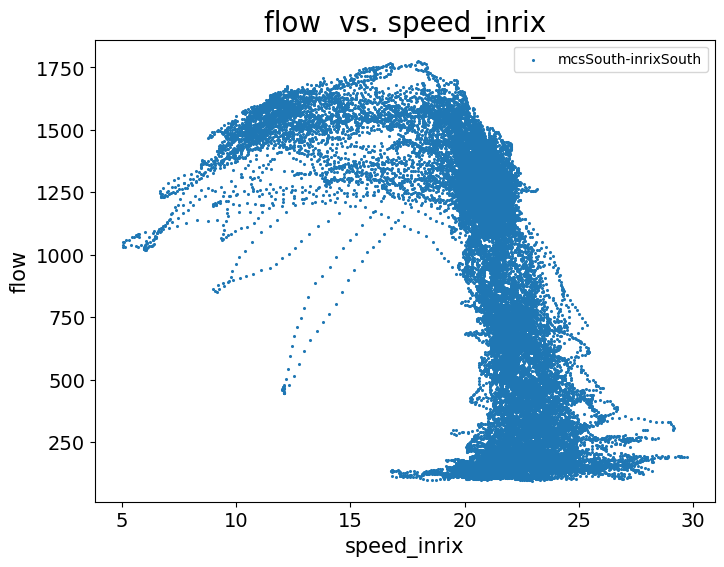

In [ ]:
# draw flow_mcs vs. Speed_inrix after time step matched
combinedCorr2 = combinedSouth_shifted.iloc[:idx(combinedSouth_shifted, 28)][['speed_inrix', 'flow']].copy() # until 27th Oct
print(combinedCorr2.corr())

plt.figure(figsize=(8,6))
plotScatter(combinedCorr2, combinedCorr2, 'speed_inrix', 'flow', 'mcsSouth-inrixSouth')

                speed_inrix_up      flow
speed_inrix_up        1.000000 -0.552844
flow                 -0.552844  1.000000


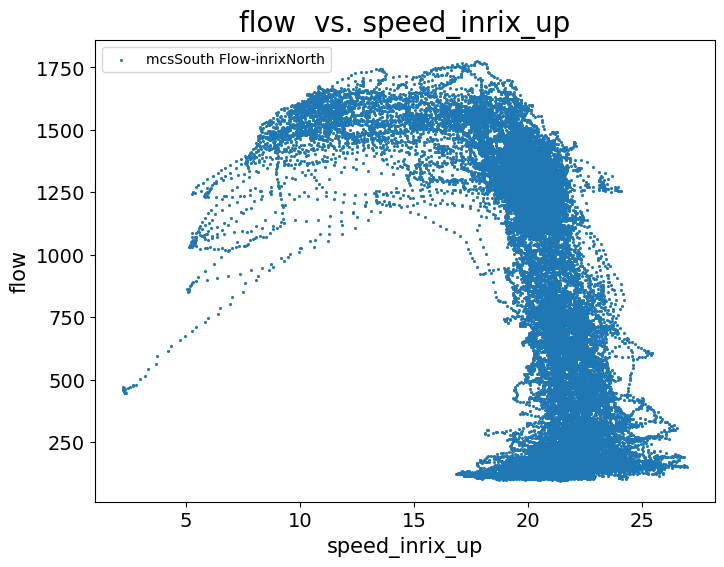

In [ ]:
# draw flow_mcs vs. Speed_inrix_up (North) after time step matched
Corr2 = combinedSouth_shifted.iloc[:idx(combinedSouth_shifted, 28)][['speed_inrix_up', 'flow']].copy() # until 27th Oct 23:59
print(Corr2.corr())

plt.figure(figsize=(8,6))
plotScatter(Corr2, Corr2, 'speed_inrix_up', 'flow', 'mcsSouth Flow-inrixNorth')

          speed      flow
speed  1.000000 -0.746619
flow  -0.746619  1.000000


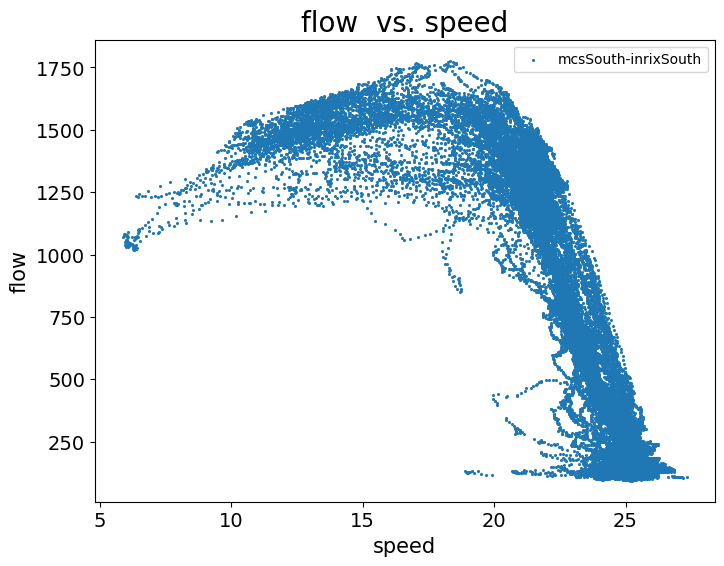

In [ ]:
# draw flow_mcs vs. Speed_mcs after time step matched
combinedCorr3 = combinedSouth_shifted.iloc[:][['speed', 'flow']].copy()
print(combinedCorr3.corr())

plt.figure(figsize=(8,6))
plotScatter(combinedCorr3, combinedCorr3, 'speed', 'flow', 'mcsSouth-inrixSouth')

## 4.5 add temporal factor: day/night

In [ ]:
# load the combined/processed dataframe
# start from this cell if data frame has been processed before
combinedSouth_shifted = pd.read_pickle('OutData/inrixMcsSouth.pkl')

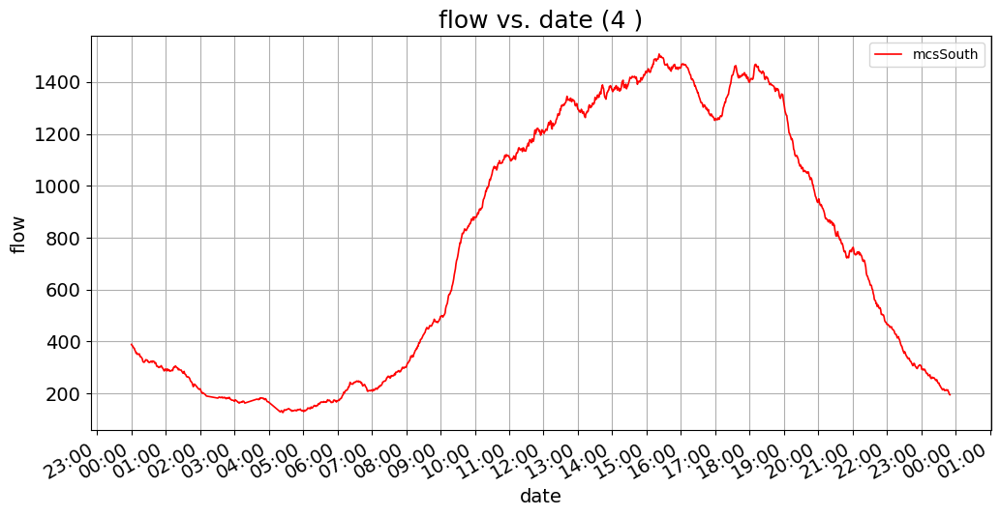

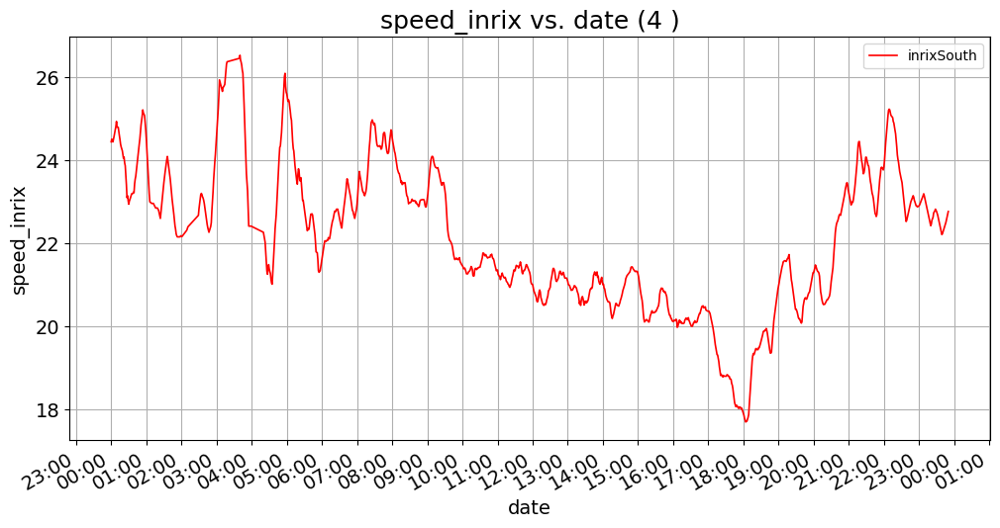

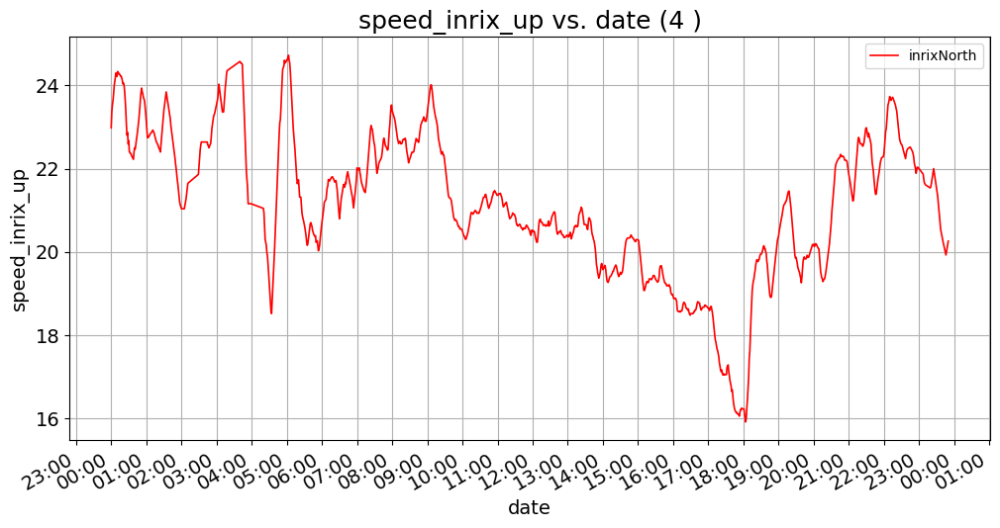

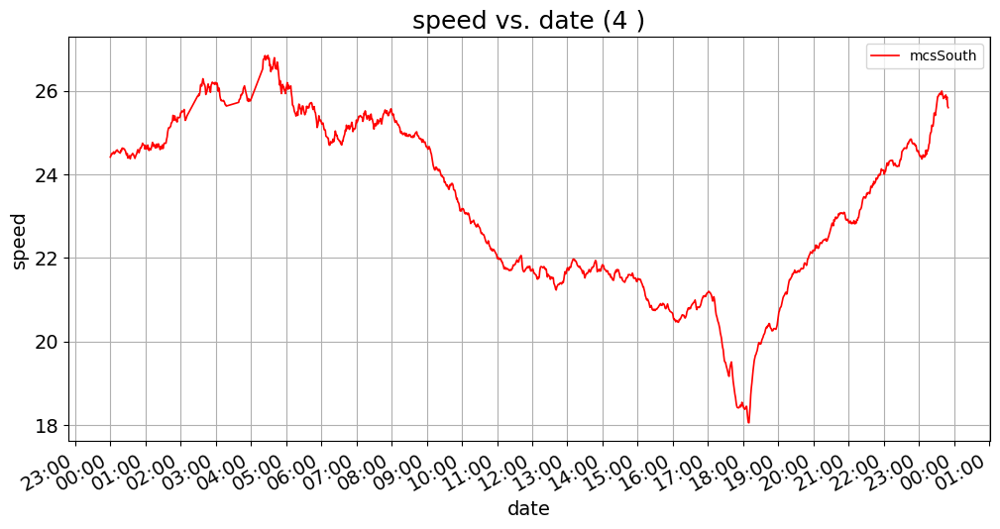

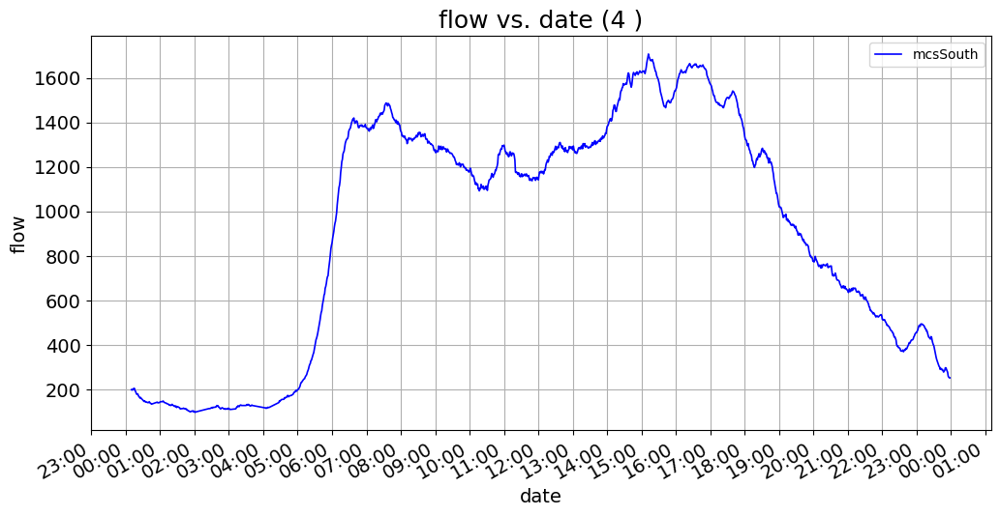

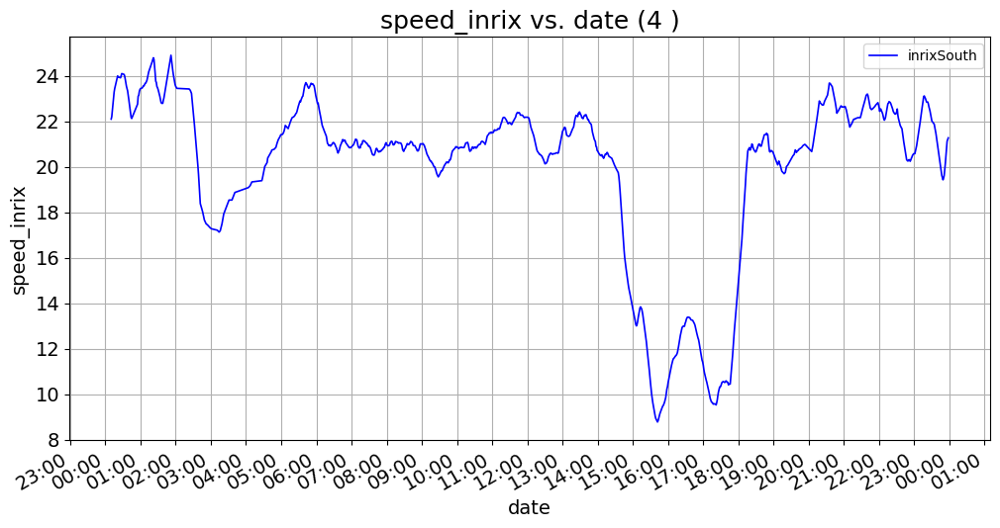

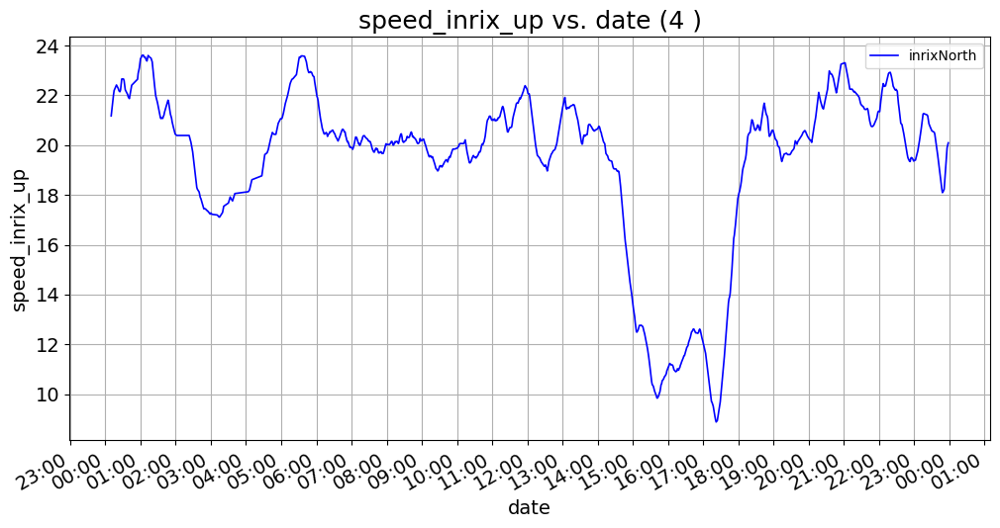

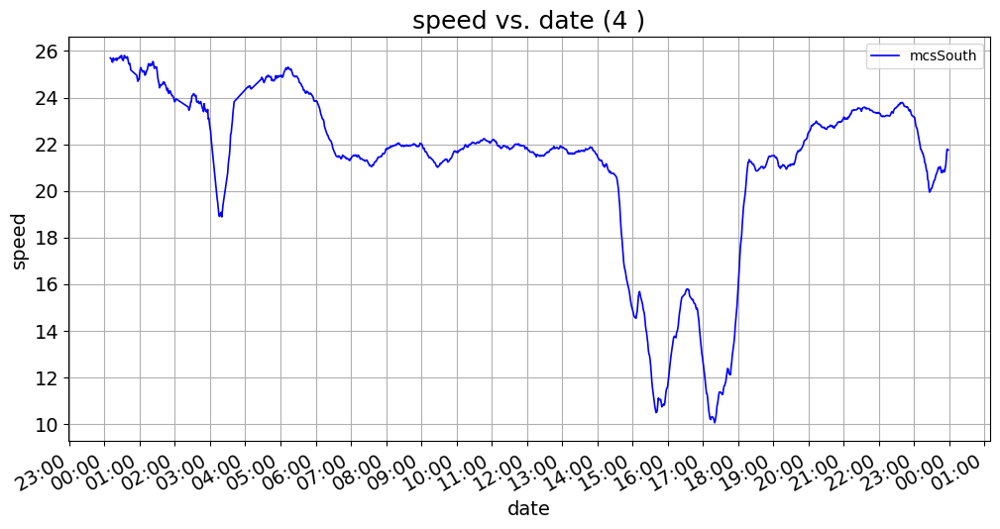

In [ ]:
# Decide the boundaries of daytime according to the flow-datetime relation 
#weekends
WEEKEND1 = 14
WEEKEND2 = 15
plt.figure(figsize=(12,6))
plotAttrDatetime(4, combinedSouth_shifted[idx(combinedSouth_shifted,WEEKEND1):idx(combinedSouth_shifted, WEEKEND2)], 
                 'date', 'flow', 'mcsSouth', 'r')
plt.figure(figsize=(12,6))
plotAttrDatetime(4, combinedSouth_shifted[idx(combinedSouth_shifted,WEEKEND1):idx(combinedSouth_shifted, WEEKEND2)],
                 'date', 'speed_inrix', 'inrixSouth', 'r')
plt.figure(figsize=(12,6))
plotAttrDatetime(4, combinedSouth_shifted[idx(combinedSouth_shifted,WEEKEND1):idx(combinedSouth_shifted, WEEKEND2)],
                 'date', 'speed_inrix_up', 'inrixNorth', 'r')
plt.figure(figsize=(12,6))
plotAttrDatetime(4, combinedSouth_shifted[idx(combinedSouth_shifted,WEEKEND1):idx(combinedSouth_shifted, WEEKEND2)],
                 'date', 'speed', 'mcsSouth', 'r')

#weekdays 6:00 to 20:00
WEEKDAY1 = 16
WEEKDAY2 = 17
plt.figure(figsize=(12,6))
plotAttrDatetime(4, combinedSouth_shifted[idx(combinedSouth_shifted,WEEKDAY1):idx(combinedSouth_shifted, WEEKDAY2)], 
                 'date', 'flow', 'mcsSouth', 'b')
plt.figure(figsize=(12,6))
plotAttrDatetime(4, combinedSouth_shifted[idx(combinedSouth_shifted,WEEKDAY1):idx(combinedSouth_shifted, WEEKDAY2)],
                 'date', 'speed_inrix', 'inrixSouth', 'b')
plt.figure(figsize=(12,6))
plotAttrDatetime(4, combinedSouth_shifted[idx(combinedSouth_shifted,WEEKDAY1):idx(combinedSouth_shifted, WEEKDAY2)],
                 'date', 'speed_inrix_up', 'inrixNorth', 'b')
plt.figure(figsize=(12,6))
plotAttrDatetime(4, combinedSouth_shifted[idx(combinedSouth_shifted,WEEKDAY1):idx(combinedSouth_shifted, WEEKDAY2)],
                 'date', 'speed', 'mcsSouth', 'b')

In [ ]:
# add temporal factor for dataset:
# DAYTIMESTARTHOUR< hour < DAYTIMEENDHOUR : 1.0 (daytime)
# else: 0.0 (night)
func = lambda x: DAYTIME if (x.hour >= DAYTIMESTARTHOUR and x.hour < DAYTIMEENDHOUR) else 0.0

combinedSouth_shifted['daytime'] = combinedSouth_shifted.date.apply(func)

In [ ]:
# save the processed dataframe into the directory
combinedSouth_shifted.to_pickle('OutData/inrixMcsSouth_temp.pkl')

# 5. Linear (Polynomial) Regression Models
  Use linear (polynomial) regression model to capture the relation between speed/travel time and MCS flow/denstiy

*   Ground Truth Model: Mcs speed -> Mcs Flow ( or Density)
*   INRIX speed -> MCS Flow



In [22]:
# load the combined/processed dataframe
# start from this cell if data frame has been processed before
combinedSouth_shifted = pd.read_pickle('OutData/inrixMcsSouth_temp.pkl')

In [23]:
# select 2~3 weeks data to build model
combinedSouth_2w = combinedSouth_shifted.iloc[:idx(combinedSouth_shifted, 22)]

In [24]:
# load the combined/processed dataframe of adjacent link
# start from this cell if data frame has been processed before
combinedNorth_shifted = pd.read_pickle('OutData/inrixMcsSouth_temp_exchanged.pkl')

In [25]:
# test the model on adjacent(upstream) link:
# select 2~3 weeks data to build model
combinedNorth_2w = combinedNorth_shifted.iloc[:idx(combinedNorth_shifted, 22)]

## 5.1 Reference linear regression model: MCS Speed -> MCS FLow

In [26]:
# function for turning single feature into polynomial feature columns 
# Input X: numpy array with shape(sample number, )
# Output X_poly: numpy array with shape(sample #, polynomial degree + 1) Note: 1 for bias
def makePoly(deg, X, bias = True):
  poly = PolynomialFeatures(degree = deg,include_bias = bias)
  X_1 = X.reshape(-1, 1)
  X_poly = poly.fit_transform(X_1)
  return X_poly

In [27]:
# function for turning multi feature input into polynomial feature columns 
# Input X: numpy array with shape(sample number, # of features)
# Output X_poly: numpy array with shape(sample #, polynomial degree + 1) Note: 1 for bias
def makePoly_multi(deg, X, bias = True):
  poly = PolynomialFeatures(degree = deg,include_bias = bias)
  X_poly = poly.fit_transform(X)
  return X_poly

In [28]:
# funtion for normalizing the feature columns
# Input: X: Numpy array with shape(sample #, polynomial degree + 1)
# Output X_scaled: normalized Numpy array with shape(sample #, polynomial degree + 1)
# Output scaler: scaler, which fitted on input array, for normalization
def normalize(X, Scaler=None):
  # remove the bias column
  X_1 = np.delete(X, 0, 1)

  # scale the remaining feature columns
  scaler = None
  X_2 = None

  if(Scaler==None):
    scaler = StandardScaler()
    X_2 = scaler.fit_transform(X_1)
  else:
    scaler = Scaler
    X_2 = scaler.transform(X_1)

  # add the bias column back to the features columns
  ones = np.ones((len(X_2), 1))
  X_scaled = np.append(ones, X_2, 1)
  
  return X_scaled, scaler

In [29]:
# function to build and fit linear model on input arrays
def LRmodel(X_train, Y_train):
  regressor = LinearRegression(fit_intercept=False)
  regressor.fit(X_train, Y_train)
  return regressor

In [30]:
# function used to print the cross-validation scores on training set
def display_scores(scores):
  print("Scores:", scores)
  print("Mean:", scores.mean()) 
  print("Standard deviation:", scores.std())

In [31]:
# prepare the feature "MCS speed" + "temporal factor"
X_epoch = combinedSouth_2w['Epoch_mcs'].values
X_mcs_speed = combinedSouth_2w['speed'].values
X_temporal = combinedSouth_2w['daytime'].values
Y_flow = combinedSouth_2w['flow'].values

# turn single feature into polynomial features matrix: 1, s, s^2, s^3, ...
X_mcs_speed = makePoly(3, X_mcs_speed)
X_mcs_speed, scaler_mcs_speed = normalize(X_mcs_speed)

# append temporal factor to the polynomialized/scaled X_mcs_speed
X_mcs_speed_temp = np.append(X_mcs_speed, X_temporal.reshape(-1,1), axis=1)

# code for monitoring feature matrix
# could be commented out while don't want to print out
dfRawFeatures = pd.DataFrame(X_mcs_speed_temp)
dfRawFeatures.describe()

,0,1,2,3,4
count,28387.0,2.838700e+04,2.838700e+04,2.838700e+04,28387.000000
mean,1.0,-1.190719e-14,-3.839713e-15,-1.295532e-14,0.619509
std,0.0,1.000018e+00,1.000018e+00,1.000018e+00,0.485516
min,1.0,-4.967381e+00,-3.668334e+00,-2.890966e+00,0.000000
25%,1.0,-1.960567e-01,-3.038539e-01,-3.995223e-01,0.000000
50%,1.0,7.093544e-02,-2.726643e-03,-7.741623e-02,1.000000
75%,1.0,7.201136e-01,7.793484e-01,8.166483e-01,1.000000
max,1.0,1.522198e+00,1.843292e+00,2.156109e+00,1.000000


In [32]:
# assign normalized polynomial features matrix into feature matrix,
# assign predict target to label array
X_features = X_mcs_speed_temp
Y_label = Y_flow

# split training and test data
X_train, X_test, Y_train, Y_test = train_test_split(X_features, Y_label, test_size=0.2, random_state=1)

In [33]:
# Use 10 folds cross-validation to fit and validate the model (to determine the degree of polynomial model)
# Validation dataset = 10% of training set
scores = cross_val_score(LinearRegression(fit_intercept=False), X_train, Y_train, scoring='r2', cv=10)
display_scores(scores)

Scores: [0.91717358 0.92046882 0.91509082 0.91228295 0.90930196 0.91280814
 0.91631489 0.90597251 0.91397074 0.91290666]
Mean: 0.9136291068017351
Standard deviation: 0.0038622222129410027


In [34]:
# Build the regression model fitted on train dataset (based on the best degree obtained from cross-validation)
regressor = LRmodel(X_train, Y_train)
regressor.fit(X_train, Y_train)

# Evaluate estimation accuracy on training set
Y_predict_train = regressor.predict(X_train)
print("Root Mean Square Error for training set: ", mean_squared_error(Y_train, Y_predict_train, squared=False))
print("R2 Score for training set: ", r2_score(Y_train, Y_predict_train))
print()

# Evaluate estimation accuracy on testing set
Y_predict_test = regressor.predict(X_test)
print("Root Mean Square Error: ", mean_squared_error(Y_test, Y_predict_test, squared=False))
print("R2 Score for testing set: ", r2_score(Y_test, Y_predict_test))

Root Mean Square Error for training set:  149.72976504364263
R2 Score for training set:  0.9137434023442358

Root Mean Square Error:  149.77638674852386
R2 Score for testing set:  0.9153251488434642


6:00 ~ 18:00: R2=0.8944627156998969 <br>
6:00 ~ 20:00: R2= 0.902 <br>

In [35]:
# print the coefficient of the linear model
regressor.coef_

array([  670.77237324,    66.08396502,  1002.38574316, -1376.08388991,
         370.23732954])

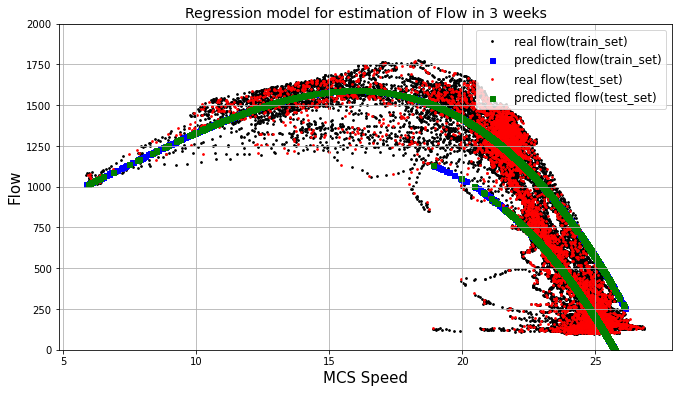

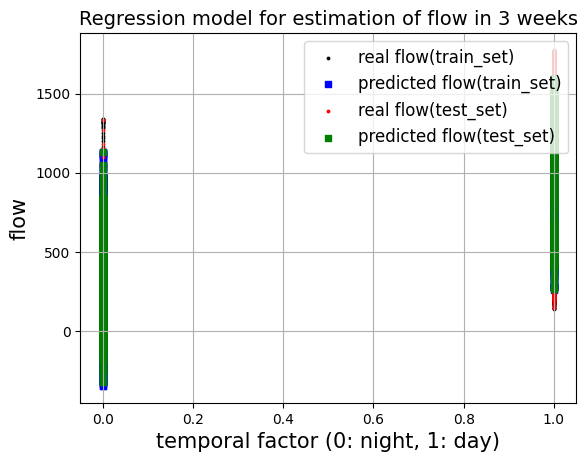

In [36]:
# Plot real and predicted flow for X_train, X_test
X_train_denormalized = scaler_mcs_speed.inverse_transform(X_train[:,1:-1])
X_test_denormalized = scaler_mcs_speed.inverse_transform(X_test[:, 1:-1])
plt.figure(figsize=(11, 6))
plt.ylim(top = 2000)
#plt.xlim(left=-7, right = 2)
plotResult(X_train_denormalized[:, 0], Y_train, Y_predict_train, 
           X_test_denormalized[:, 0], Y_test, Y_predict_test, '3 weeks', 'MCS Speed', 'Flow')

# plot flow vs. temporal factor
plotResult(X_train[:, -1], Y_train, Y_predict_train, 
           X_test[:, -1], Y_test, Y_predict_test, '3 weeks', 'temporal factor (0: night, 1: day)', 'flow')

In [37]:
# Use the model to estimate the flow on all train + test dataset (only for plotting diagram)
Y_predict = regressor.predict(X_features)

In [38]:
combinedSouth_2w.iloc[idx(combinedSouth_2w, ENDDATE) + DELTA_STEP].date

NameError: ignored

In [39]:
combinedNorth_2w.describe()

,fk_id,speed,speed_std_dev,flow,Epoch_mcs,Density,segmentid,speed_inrix,average,reference,score,cvalue,travel_time_secs,Epoch_inrix,speed_inrix_up,travel_time_secs_up,Epoch_inrix_up,daytime
count,28387.0,28387.000000,28387.000000,28387.000000,2.838700e+04,28387.000000,28387.0,28387.000000,28387.000000,2.838700e+04,28387.000000,28387.000000,28387.000000,2.838700e+04,28387.000000,28387.000000,2.838700e+04,28387.000000
mean,1162.0,20.350155,7.736325,864.731426,9.132278e+05,0.807717,225285973.0,20.037681,16.297748,1.666667e+01,29.947863,78.162891,27.364049,9.132252e+05,20.700705,58.161289,9.132252e+05,0.619474
std,0.0,2.946238,3.073268,491.065029,5.213799e+05,0.681636,0.0,3.082002,1.284680,6.501581e-12,0.720184,24.832488,10.639233,5.213797e+05,3.244479,16.470828,5.213797e+05,0.485525
min,1162.0,2.350398,0.000000,88.000000,7.740000e+03,0.026471,225285973.0,2.231481,11.944444,1.666667e+01,20.000000,-1.000000,19.248000,7.740000e+03,5.046296,39.654000,7.739000e+03,0.000000
25%,1162.0,20.255597,6.164410,347.500000,4.617900e+05,0.257814,225285973.0,19.555556,15.555556,1.666667e+01,30.000000,69.000000,23.926000,4.617865e+05,20.287037,51.479000,4.617870e+05,0.000000
50%,1162.0,20.912420,7.632170,1058.000000,9.137400e+05,0.774484,225285973.0,20.555556,16.666667,1.666667e+01,30.000000,88.000000,25.138000,9.137380e+05,21.194444,54.086000,9.137380e+05,1.000000
75%,1162.0,22.023918,9.137830,1279.000000,1.364910e+06,1.095529,225285973.0,21.648148,16.944444,1.666667e+01,30.000000,97.000000,26.396000,1.364909e+06,22.333333,56.461000,1.364909e+06,1.000000
max,1162.0,23.523643,43.369200,1697.000000,1.813680e+06,5.552724,225285973.0,26.935185,18.888889,1.666667e+01,30.000000,100.000000,231.546000,1.813676e+06,29.722222,243.594000,1.813677e+06,1.000000


In [40]:
combinedSouth_2w.describe()

,fk_id,speed,speed_std_dev,flow,Epoch_mcs,Density,segmentid,speed_inrix,average,reference,score,cvalue,travel_time_secs,Epoch_inrix,speed_inrix_up,travel_time_secs_up,Epoch_inrix_up,daytime
count,28387.0,28387.000000,28387.000000,28387.000000,2.838700e+04,28387.000000,2.838700e+04,28387.000000,28387.000000,2.838700e+04,28387.000000,28387.000000,28387.000000,2.838700e+04,28387.000000,28387.000000,2.838700e+04,28387.000000
mean,1159.0,21.929694,4.674463,900.115194,9.131162e+05,0.773077,1.071884e+09,20.700652,18.504450,1.888889e+01,29.973579,82.602459,58.161130,9.131136e+05,20.037576,27.363970,9.131136e+05,0.619509
std,0.0,3.232562,3.257908,510.850832,5.214313e+05,0.594604,0.000000e+00,3.244264,1.292277,9.432621e-12,0.513339,26.015651,16.470521,5.214311e+05,3.081754,10.639128,5.214311e+05,0.485516
min,1159.0,5.872609,0.000000,98.000000,7.740000e+03,0.025532,1.071884e+09,5.046296,13.888889,1.888889e+01,20.000000,-1.000000,39.654000,7.739000e+03,2.231481,19.248000,7.740000e+03,0.000000
25%,1159.0,21.295940,2.861380,362.000000,4.616100e+05,0.242215,1.071884e+09,20.287037,17.777778,1.888889e+01,30.000000,76.000000,51.480000,4.616070e+05,19.555556,23.926000,4.616065e+05,0.000000
50%,1159.0,22.158993,3.905120,1102.000000,9.135000e+05,0.758172,1.071884e+09,21.194444,18.888889,1.888889e+01,30.000000,95.000000,54.086000,9.134960e+05,20.555556,25.138000,9.134950e+05,1.000000
75%,1159.0,24.257465,5.448620,1333.000000,1.364850e+06,1.088554,1.071884e+09,22.333333,18.888889,1.888889e+01,30.000000,100.000000,56.461000,1.364846e+06,21.648148,26.396000,1.364846e+06,1.000000
max,1159.0,26.850207,55.500000,1777.000000,1.813680e+06,4.744283,1.071884e+09,29.722222,21.388889,1.888889e+01,30.000000,100.000000,243.594000,1.813677e+06,26.935185,231.546000,1.813676e+06,1.000000


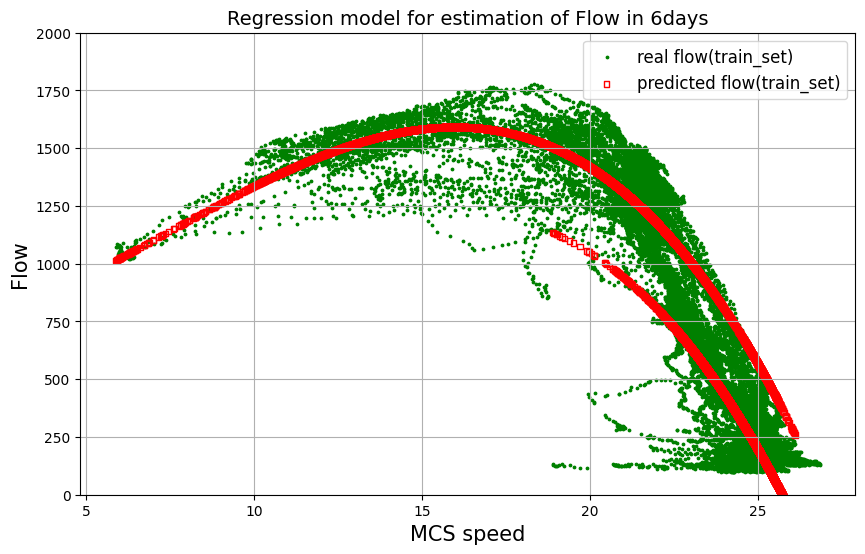

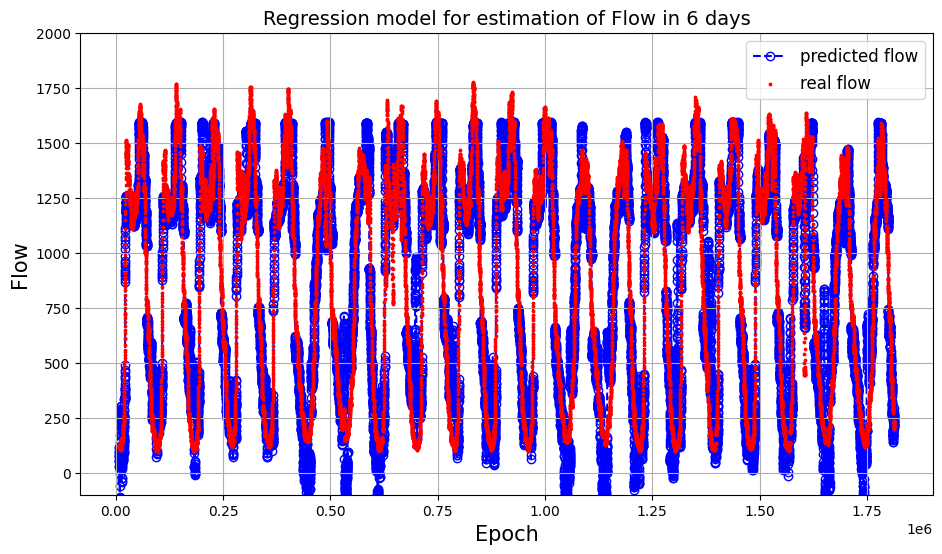

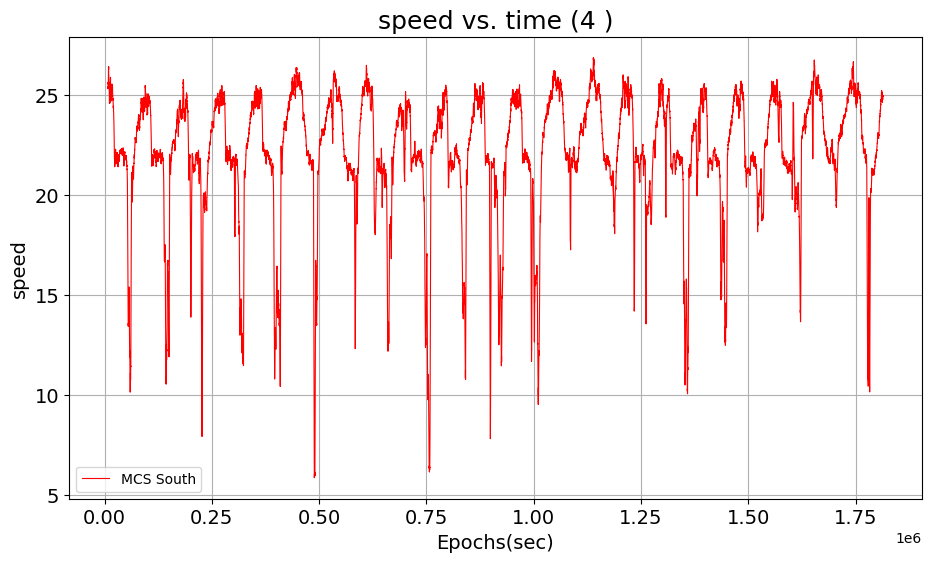

In [41]:
STARTDATE = 1
ENDDATE = 99
DELTA_STEP = 0
# Plot real and predicted flow vs. X_features (speed_mcs)
X_features_mcs_denormalized = scaler_mcs_speed.inverse_transform(X_features[:,1:-1])
plt.figure(figsize=(10, 6))
plt.ylim(bottom = 0, top=2000)
# plt.xlim(left = 3, right=28)
plotResult(X_features_mcs_denormalized[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP, 0], 
           Y_label[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           Y_predict[idx(combinedSouth_2w, STARTDATE) : idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           None,  None, None, '6days', 'MCS speed', 'Flow')

# plotResult(X_features_mcs_denormalized[:, 0], Y_label, Y_predict, 
#            None,  None, None, '3 weeks', 'MCS speed', 'Flow')


# Plot real and predicted flow vs. Epoch 
plt.figure(figsize=(11, 6))
plt.ylim(bottom = -100, top = 2000)
plotResult(X_epoch[idx(combinedSouth_2w, STARTDATE):idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           Y_label[idx(combinedSouth_2w, STARTDATE):idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           Y_predict[idx(combinedSouth_2w, STARTDATE):idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           None, None, None, '6 days', 'Epoch', 'Flow', 'p')

# Plot corresponding mcs speed 
plt.figure(figsize=(11, 6))
plotAttr(4, combinedSouth_2w.iloc[idx(combinedSouth_2w, STARTDATE):idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 'speed', 'MCS South')


#### Test the LR model on the future data (totally unseen) from the same link:
*   test the model on the future dataset 22nd - 27th Oct.

In [42]:
# select 1 week future data (22nd - 27th) to test the model
combinedSouth_future = combinedSouth_shifted.iloc[idx(combinedSouth_shifted, 22):idx(combinedSouth_shifted, 28)]
combinedSouth_future.reset_index(inplace=True, drop=True)

# prepare the feature "MCS speed" + "temporal factor"
X_epoch = combinedSouth_future['Epoch_mcs'].values
X_mcs_speed = combinedSouth_future['speed'].values
X_temporal = combinedSouth_future['daytime'].values
Y_flow = combinedSouth_future['flow'].values

# turn single feature into polynomial features matrix: 1, s, s^2, s^3, ...
X_mcs_speed = makePoly(3, X_mcs_speed)
X_mcs_speed, scaler_mcs_speed = normalize(X_mcs_speed)

# append temporal factor to the polynomialized/scaled X_mcs_speed
X_mcs_speed_temp = np.append(X_mcs_speed, X_temporal.reshape(-1,1), axis=1)

# code for monitoring feature matrix
# could be commented out while don't want to print out
dfRawFeatures = pd.DataFrame(X_mcs_speed_temp)
dfRawFeatures.describe()

,0,1,2,3,4
count,8007.0,8.007000e+03,8.007000e+03,8.007000e+03,8007.000000
mean,1.0,1.639385e-14,1.291960e-15,2.783184e-15,0.626452
std,0.0,1.000062e+00,1.000062e+00,1.000062e+00,0.483776
min,1.0,-4.443945e+00,-3.308559e+00,-2.625309e+00,0.000000
25%,1.0,-1.787944e-01,-2.864117e-01,-3.842295e-01,0.000000
50%,1.0,8.378168e-02,5.456598e-03,-7.430206e-02,1.000000
75%,1.0,7.438873e-01,7.934114e-01,8.248171e-01,1.000000
max,1.0,1.625135e+00,1.966235e+00,2.317432e+00,1.000000


In [43]:
# assign normalized polynomial features matrix to the feature matrix,
# assign target to label array
X_features_future = X_mcs_speed_temp
Y_future = Y_flow

In [44]:
# Use the model to estimate the flow on adjacent link dataset
Y_predict_future = regressor.predict(X_features_future)

# Evaluate estimation accuracy on testing set
print("Root Mean Square Error: ", mean_squared_error(Y_future, Y_predict_future, squared=False))
print("R2 Score for (future) testing set: ", r2_score(Y_future, Y_predict_future))

Root Mean Square Error:  124.5237148643974
R2 Score for (future) testing set:  0.9394987159166206


In [45]:
dataFrame.iloc[idx(dataFrame, ENDDATE) + DELTA_STEP -1].date

NameError: ignored

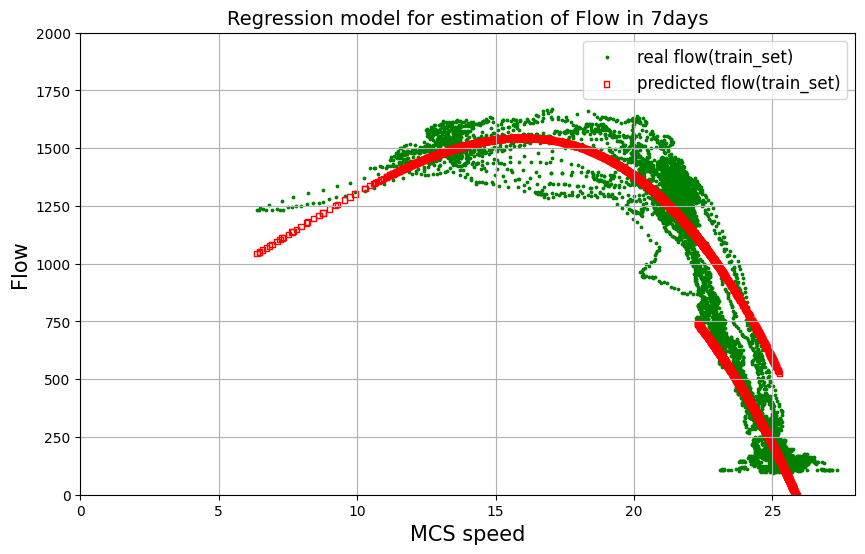

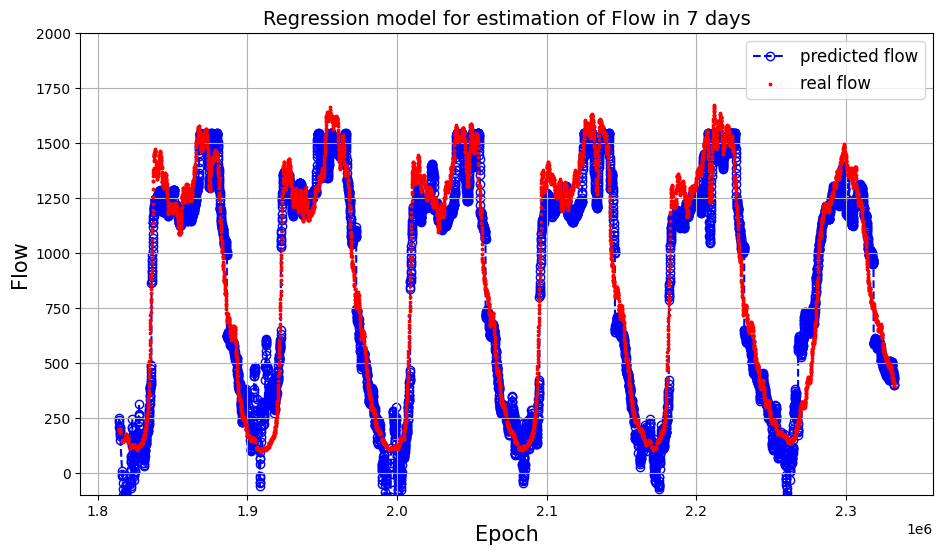

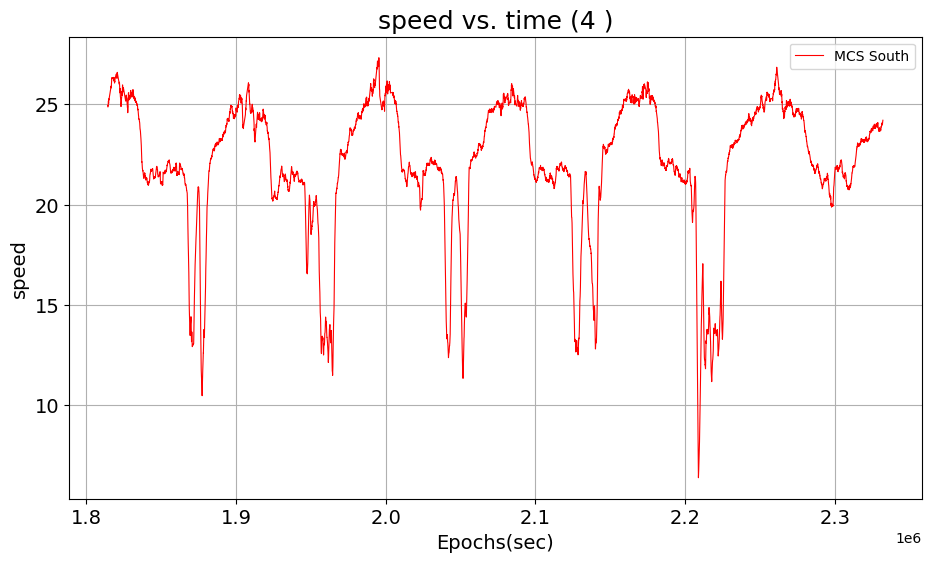

In [46]:
STARTDATE = 22
ENDDATE = 99
DELTA_STEP = 0
dataFrame = combinedSouth_future
# Plot real and predicted flow vs. X_features (speed_mcs)
X_features_mcs_denormalized = scaler_mcs_speed.inverse_transform(X_features_future[:,1:-1])
plt.figure(figsize=(10, 6))
plt.ylim(bottom = 0, top=2000)
plt.xlim(left = 0, right=28)
plotResult(X_features_mcs_denormalized[idx(dataFrame, STARTDATE): idx(dataFrame, ENDDATE) + DELTA_STEP, 0], 
           Y_future[idx(dataFrame, STARTDATE): idx(dataFrame, ENDDATE) + DELTA_STEP], 
           Y_predict_future[idx(dataFrame, STARTDATE) : idx(dataFrame, ENDDATE) + DELTA_STEP], 
           None,  None, None, '7days', 'MCS speed', 'Flow')

# plotResult(X_features_mcs_denormalized[:, 0], Y_label, Y_predict, 
#            None,  None, None, '3 weeks', 'MCS speed', 'Flow')


# Plot real and predicted flow vs. Epoch 
plt.figure(figsize=(11, 6))
plt.ylim(bottom = -100, top = 2000)
plotResult(X_epoch[idx(dataFrame, STARTDATE):idx(dataFrame, ENDDATE) + DELTA_STEP], 
           Y_future[idx(dataFrame, STARTDATE):idx(dataFrame, ENDDATE) + DELTA_STEP], 
           Y_predict_future[idx(dataFrame, STARTDATE):idx(dataFrame, ENDDATE) + DELTA_STEP], 
           None, None, None, '7 days', 'Epoch', 'Flow', 'p')

# Plot corresponding mcs speed 
plt.figure(figsize=(11, 6))
plotAttr(4, dataFrame.iloc[idx(dataFrame, STARTDATE):idx(dataFrame, ENDDATE) + DELTA_STEP], 'speed', 'MCS South')


#### Test the LR model on adjacent(upstream) link

In [47]:
# adjacent(upstream) link dataset:
combinedNorth_shifted.describe()

,fk_id,speed,speed_std_dev,flow,Epoch_mcs,Density,segmentid,speed_inrix,average,reference,score,cvalue,travel_time_secs,Epoch_inrix,speed_inrix_up,travel_time_secs_up,Epoch_inrix_up,daytime
count,41772.0,41772.000000,41772.000000,41772.000000,4.177200e+04,41772.000000,41772.0,41772.000000,41772.000000,4.177200e+04,41772.000000,41772.000000,41772.000000,4.177200e+04,41772.000000,41772.000000,4.177200e+04,41772.000000
mean,1162.0,20.222668,7.642548,869.867160,1.341634e+06,0.822107,225285973.0,19.887246,16.281414,1.666667e+01,29.952121,78.227952,27.530367,1.341631e+06,20.518714,58.789565,1.341631e+06,0.621325
std,0.0,3.021537,3.058547,490.132441,7.705462e+05,0.693699,0.0,3.130576,1.288208,3.737500e-12,0.690296,24.873644,9.878230,7.705462e+05,3.313762,16.616860,7.705462e+05,0.485063
min,1162.0,2.350398,0.000000,87.000000,7.740000e+03,0.026471,225285973.0,2.231481,11.944444,1.666667e+01,20.000000,-1.000000,18.964000,7.740000e+03,5.046296,39.654000,7.739000e+03,0.000000
25%,1162.0,20.114993,6.057020,350.000000,6.719850e+05,0.261400,225285973.0,19.416667,15.555556,1.666667e+01,30.000000,69.000000,24.022000,6.719815e+05,20.148148,51.724000,6.719810e+05,0.000000
50%,1162.0,20.845123,7.533260,1071.000000,1.340670e+06,0.789829,225285973.0,20.462963,16.666667,1.666667e+01,30.000000,88.000000,25.250000,1.340668e+06,21.120370,54.266000,1.340668e+06,1.000000
75%,1162.0,21.980626,9.027730,1280.000000,2.011515e+06,1.103229,225285973.0,21.546296,16.944444,1.666667e+01,30.000000,97.000000,26.600000,2.011512e+06,22.222222,56.832000,2.011512e+06,1.000000
max,1162.0,24.014040,43.369200,1697.000000,2.677200e+06,5.552724,225285973.0,27.888889,18.888889,1.666667e+01,30.000000,100.000000,231.546000,2.677196e+06,29.722222,243.594000,2.677197e+06,1.000000


In [48]:
# one of minimum speed occurs in 08.10 around 7AM: rush hour + rain
# one of minimum speed occurs in 08.19 around 13:30 : non-rush hour (accident??)
combinedNorth_shifted[combinedNorth_shifted['speed'] <= 3.9].head(5)

,fk_id,date,speed,speed_std_dev,flow,used_lanes,Epoch_mcs,Density,segmentid,timestamputc,speed_inrix,average,reference,score,cvalue,travel_time_secs,date_inrix,Epoch_inrix,speed_inrix_up,travel_time_secs_up,Epoch_inrix_up,daytime
9744,1162,2018-10-08 07:01:00,3.894933,6.689540,895,"{1,1,1,1}",630060.0,4.028568,225285973,2018-10-08 05:07:11,5.111111,16.666667,16.666667,30,45,102.420,2018-10-08 07:07:10,630057.0,9.064815,131.748,630056.0,1.0
9745,1162,2018-10-08 07:02:00,3.833378,2.861380,888,"{1,1,1,1}",630120.0,4.178569,225285973,2018-10-08 05:08:10,5.092593,16.666667,16.666667,30,48,102.728,2018-10-08 07:08:09,630116.0,9.157407,130.876,630116.0,1.0
9746,1162,2018-10-08 07:03:00,3.808943,4.145780,877,"{1,1,1,1}",630180.0,3.300001,225285973,2018-10-08 05:09:10,5.055556,16.666667,16.666667,30,52,103.292,2018-10-08 07:09:10,630176.0,9.268519,129.956,630177.0,1.0
9747,1162,2018-10-08 07:04:00,3.817684,5.244040,887,"{1,1,1,1}",630240.0,3.152540,225285973,2018-10-08 05:10:12,5.166667,16.666667,16.666667,30,54,102.196,2018-10-08 07:10:12,630238.0,9.481481,128.208,630238.0,1.0
25064,1162,2018-10-19 13:36:00,3.652723,0.942809,409,"{1,1,1,NULL}",1604160.0,2.342853,225285973,2018-10-19 11:42:10,3.342593,14.166667,16.666667,30,28,190.118,2018-10-19 13:42:10,1604156.0,12.268519,93.518,1604156.0,1.0


In [49]:
# prepare the feature "MCS speed" + "temporal factor"
X_epoch = combinedNorth_2w['Epoch_mcs'].values
X_mcs_speed = combinedNorth_2w['speed'].values
X_temporal = combinedNorth_2w['daytime'].values
Y_flow = combinedNorth_2w['flow'].values

# turn single feature into polynomial features matrix: 1, s, s^2, s^3, ...
X_mcs_speed = makePoly(3, X_mcs_speed)
X_mcs_speed, scaler_mcs_speed = normalize(X_mcs_speed)

# append temporal factor to the polynomialized/scaled X_mcs_speed
X_mcs_speed_temp = np.append(X_mcs_speed, X_temporal.reshape(-1,1), axis=1)

# code for monitoring feature matrix
# could be commented out while don't want to print out
dfRawFeatures = pd.DataFrame(X_mcs_speed_temp)
print(dfRawFeatures.describe())

#assign normalized polynomial features matrix into feature matrix,
# assign predict target to label array
X_features_upstream = X_mcs_speed_temp
Y_upstream = Y_flow

             0             1             2             3             4
count  28387.0  2.838700e+04  2.838700e+04  2.838700e+04  28387.000000
mean       1.0 -2.208853e-14  3.442087e-14  8.945139e-15      0.619474
std        0.0  1.000018e+00  1.000018e+00  1.000018e+00      0.485525
min        1.0 -6.109512e+00 -4.310745e+00 -3.452511e+00      0.000000
25%        1.0 -3.209515e-02 -1.293336e-01 -2.239458e-01      0.000000
50%        1.0  1.908451e-01  1.500036e-01  1.009320e-01      1.000000
75%        1.0  5.681120e-01  6.430116e-01  6.990275e-01      1.000000
max        1.0  1.077152e+00  1.348674e+00  1.607294e+00      1.000000


In [50]:
# Use the model to estimate the flow on adjacent link dataset
Y_predict_upstream = regressor.predict(X_features_upstream)

# Evaluate estimation accuracy on testing set
print("Root Mean Square Error: ", mean_squared_error(Y_upstream, Y_predict_upstream, squared=False))
print("R2 Score for testing set: ", r2_score(Y_upstream, Y_predict_upstream))

Root Mean Square Error:  179.26278444304205
R2 Score for testing set:  0.8667345528131167


In [51]:
dataFrame.iloc[idx(dataFrame, ENDDATE) + DELTA_STEP].date

IndexError: ignored

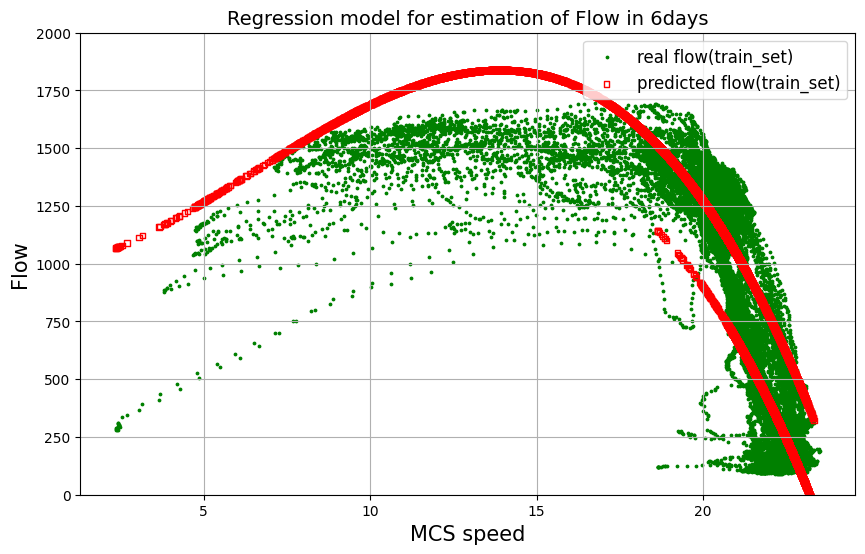

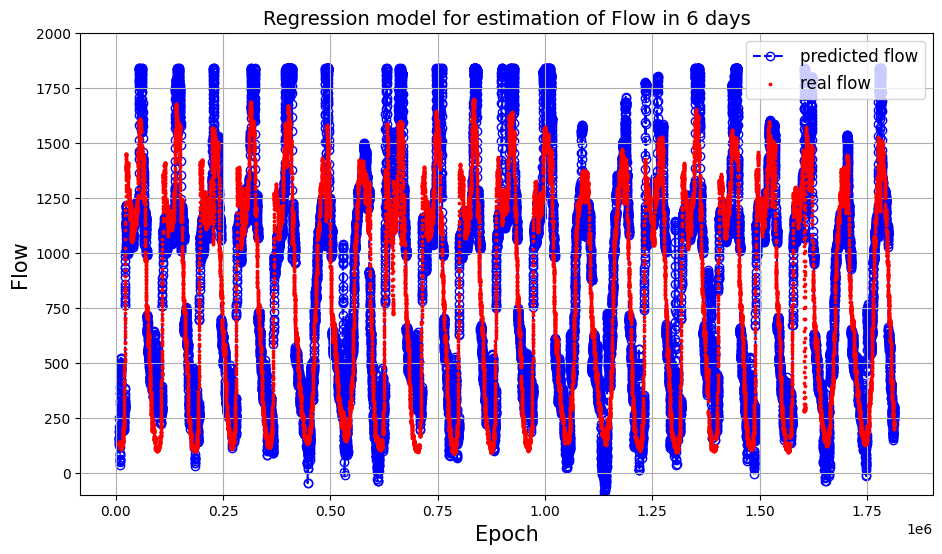

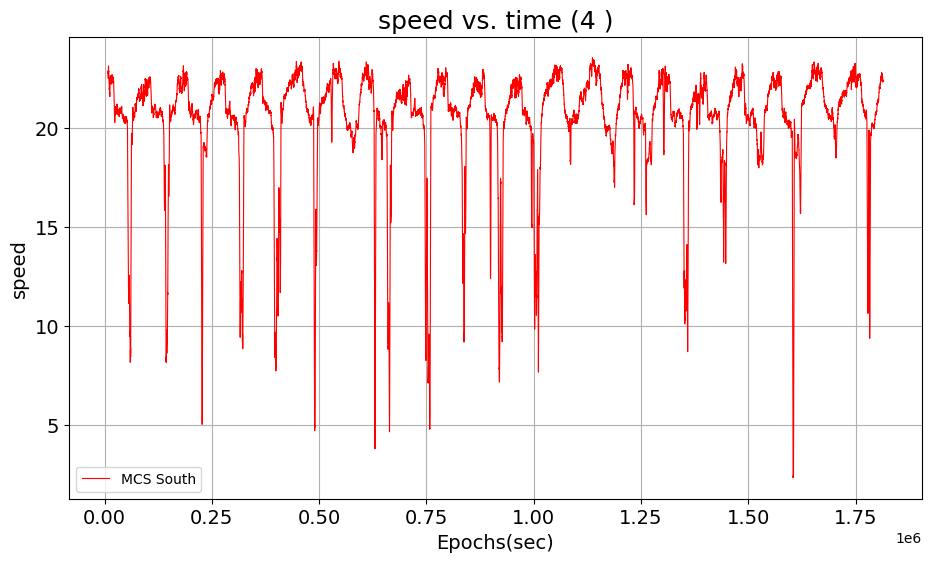

In [52]:
STARTDATE = 1
ENDDATE = 99
DELTA_STEP = 0
dataFrame = combinedNorth_2w
# Plot real and predicted flow vs. X_features (speed_mcs)
X_features_mcs_denormalized = scaler_mcs_speed.inverse_transform(X_features_upstream[:,1:-1])
plt.figure(figsize=(10, 6))
plt.ylim(bottom = 0, top=2000)
# plt.xlim(left = 0, right=28)
plotResult(X_features_mcs_denormalized[idx(dataFrame, STARTDATE): idx(dataFrame, ENDDATE) + DELTA_STEP, 0], 
           Y_upstream[idx(dataFrame, STARTDATE): idx(dataFrame, ENDDATE) + DELTA_STEP], 
           Y_predict_upstream[idx(dataFrame, STARTDATE) : idx(dataFrame, ENDDATE) + DELTA_STEP], 
           None,  None, None, '6days', 'MCS speed', 'Flow')

# plotResult(X_features_mcs_denormalized[:, 0], Y_label, Y_predict, 
#            None,  None, None, '3 weeks', 'MCS speed', 'Flow')


# Plot real and predicted flow vs. Epoch 
plt.figure(figsize=(11, 6))
plt.ylim(bottom = -100, top = 2000)
plotResult(X_epoch[idx(dataFrame, STARTDATE):idx(dataFrame, ENDDATE) + DELTA_STEP], 
           Y_upstream[idx(dataFrame, STARTDATE):idx(dataFrame, ENDDATE) + DELTA_STEP], 
           Y_predict_upstream[idx(dataFrame, STARTDATE):idx(dataFrame, ENDDATE) + DELTA_STEP], 
           None, None, None, '6 days', 'Epoch', 'Flow', 'p')

# Plot corresponding mcs speed 
plt.figure(figsize=(11, 6))
plotAttr(4, dataFrame.iloc[idx(dataFrame, STARTDATE):idx(dataFrame, ENDDATE) + DELTA_STEP], 'speed', 'MCS South')


## 5.2 Linear regression model: INRIX Data  -> MCS Flow (Speed + travel time + daytime * single)

In [ ]:
combinedSouth_2w.head()

,fk_id,date,speed,speed_std_dev,flow,used_lanes,Epoch_mcs,Density,segmentid,timestamputc,speed_inrix,average,reference,score,cvalue,travel_time_secs,date_inrix,Epoch_inrix,speed_inrix_up,travel_time_secs_up,Epoch_inrix_up,daytime
0,1159,2018-10-01 02:09:00,25.379647,12.19290,116,"{1,1,1,NULL}",7740.0,0.055834,1071883675,2018-10-01 00:15:11,21.490741,18.888889,18.888889,30,23,54.094,2018-10-01 02:15:11,7739.0,20.333333,26.130,7740.0,0.0
1,1159,2018-10-01 02:10:00,25.301860,6.32456,114,"{1,1,1,1}",7800.0,0.049002,1071883675,2018-10-01 00:16:09,21.268519,18.888889,18.888889,30,28,54.608,2018-10-01 02:16:09,7797.0,20.111111,26.362,7797.0,0.0
2,1159,2018-10-01 02:11:00,25.398467,6.50000,115,"{1,1,NULL,NULL}",7860.0,0.083710,1071883675,2018-10-01 00:17:14,21.046296,18.888889,18.888889,30,32,55.122,2018-10-01 02:17:14,7862.0,19.888889,26.594,7862.0,0.0
3,1159,2018-10-01 02:12:00,25.374270,1.69967,115,"{1,1,1,NULL}",7920.0,0.062570,1071883675,2018-10-01 00:18:08,20.787037,18.888889,18.888889,30,61,55.682,2018-10-01 02:18:08,7916.0,19.666667,26.826,7916.0,0.0
4,1159,2018-10-01 02:13:00,25.312143,0.00000,116,"{1,NULL,NULL,NULL}",7980.0,0.049315,1071883675,2018-10-01 00:19:09,20.527778,18.888889,18.888889,30,63,56.242,2018-10-01 02:19:09,7977.0,19.444444,27.058,7977.0,0.0


In [ ]:
# prepare the feature "INRIX speed"
X_epoch = combinedSouth_2w['Epoch_mcs'].values
X_inrix_speed = combinedSouth_2w['speed_inrix'].values
X_inrix_travel = combinedSouth_2w['travel_time_secs'].values
# X = combinedSouth_2w[['speed_inrix','travel_time_secs']].values
X_temporal = combinedSouth_2w['daytime'].values
Y_flow = combinedSouth_2w['flow'].values

# turn single feature into polynomial features matrix: 1, s, s^2, s^3, ...
X_inrix_speed = makePoly(4, X_inrix_speed)
X_inrix_travel = makePoly(4, X_inrix_travel)
X_inrix_travel = np.delete(X_inrix_travel, 0, 1)
X_inrix_speed_travel = np.concatenate((X_inrix_speed, X_inrix_travel), axis=1)

# X = makePoly_multi(4, X)
# standardizate the (polynomial) speed and travel time vectors
X_inrix, inrix_scaler = normalize(X_inrix_speed_travel)

# combine (normalized/polymerized) speed, speed_upstream, temporal factor to a feature vector
X_inrix_features = np.concatenate((X_inrix, X_temporal.reshape(-1,1)), axis=1)


# code for monitoring feature matrix
# could be commented out while don't want to print out
dfRawFeatures = pd.DataFrame(X_inrix_features)
dfRawFeatures.describe()

,0,1,2,3,4,5,6,7,8,9
count,28387.0,2.838700e+04,2.838700e+04,2.838700e+04,2.838700e+04,2.838700e+04,2.838700e+04,2.838700e+04,2.838700e+04,28387.000000
mean,1.0,3.785811e-15,-3.464129e-15,1.048769e-13,5.093869e-15,-2.582392e-15,3.697091e-15,-6.015358e-15,4.539626e-17,0.619509
std,0.0,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,0.485516
min,1.0,-4.825326e+00,-3.527007e+00,-2.744254e+00,-2.222269e+00,-1.123672e+00,-6.683460e-01,-3.664618e-01,-1.989062e-01,0.000000
25%,1.0,-1.274934e-01,-2.343340e-01,-3.277907e-01,-4.007445e-01,-4.056488e-01,-3.223001e-01,-2.306250e-01,-1.549190e-01,0.000000
50%,1.0,1.522075e-01,8.666730e-02,1.648139e-02,-5.098527e-02,-2.474240e-01,-2.339690e-01,-1.906767e-01,-1.400937e-01,1.000000
75%,1.0,5.032606e-01,5.094313e-01,4.922931e-01,4.563258e-01,-1.032244e-01,-1.496693e-01,-1.507547e-01,-1.245806e-01,1.000000
max,1.0,2.780825e+00,3.789602e+00,4.935965e+00,6.195372e+00,1.125867e+01,1.787912e+01,2.602411e+01,3.380944e+01,1.000000


In [ ]:
# assign normalized polynomial features matrix into feature matrix,
# assign predict target to label array
X_features = X_inrix_features
Y_label = Y_flow

# split training and test data
X_train, X_test, Y_train, Y_test = train_test_split(X_features, Y_label, test_size=0.2, random_state=1)

In [ ]:
# Use 10 folds cross-validation to fit and validate the model by training set (validation set = 10% training set)
scores = cross_val_score(LinearRegression(fit_intercept=False), X_train, Y_train, scoring='r2', cv=10)
display_scores(scores)

Scores: [0.79119665 0.79885373 0.78119973 0.77571389 0.79191711 0.78451481
 0.79235628 0.78718467 0.78765927 0.78049832]
Mean: 0.7871094454685312
Standard deviation: 0.006486964133073802


multi-poly( cross validation/training set/test set)
* s = 2: 78.0/78.0/78.4
* s = 3: 78.6/78.6/79.0
* s = 4: 78.7/78.7/79.0
* s = 5: 78.7/78.7/79.0
* s = 6: 78.7/78.7/79.0

multi-poly( cross validation/training set/test set)
* tt = 2: 78.5/78.6/78.9
* tt = 3: 78.6/78.6/79.0
* tt = 4: 78.7/78.7/79.0
* tt = 5: 78.7/78.7/79.0
* tt = 6: 78.7/78.7/79.0
* tt = 7: 78.7/78.7/79.0

In [ ]:
# Build the regression model fitted on whole train dataset
regressor = LRmodel(X_train, Y_train)

# Evaluate Performance of training set
Y_predict_train = regressor.predict(X_train)
print("Root Mean Square Error for training set: ", mean_squared_error(Y_train, Y_predict_train, squared=False))
print("R2 Score for training set: ", r2_score(Y_train, Y_predict_train))

# Evaluate Performance of testing set
Y_predict_test = regressor.predict(X_test)
print("Root Mean Square Error: ", mean_squared_error(Y_test, Y_predict_test, squared=False))
print("R2 Score: ", r2_score(Y_test, Y_predict_test))

Root Mean Square Error for training set:  235.1288394320934
R2 Score for training set:  0.7872900341196095
Root Mean Square Error:  235.66318867788533
R2 Score:  0.7903710579238332


In [ ]:
# Use all dataset (train+test) to predict the flow 
#(only for drawing plot)
Y_predict = regressor.predict(X_features)

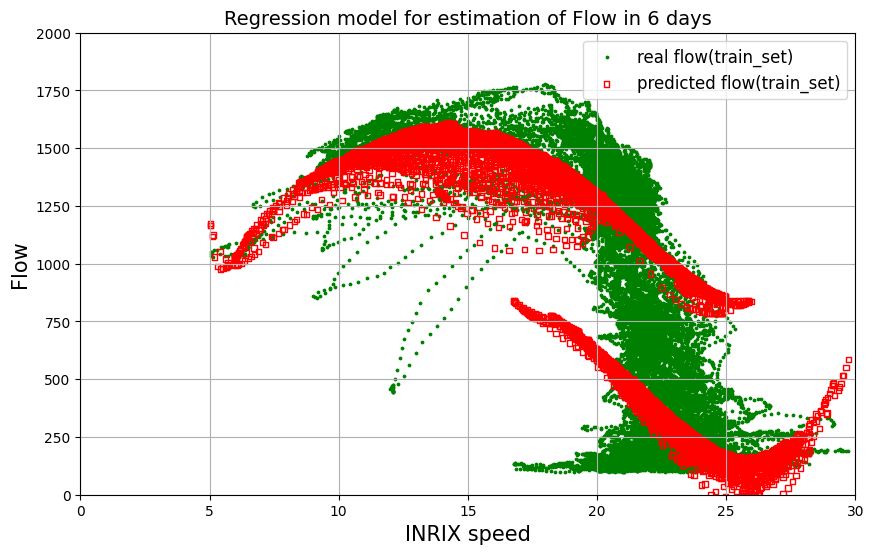

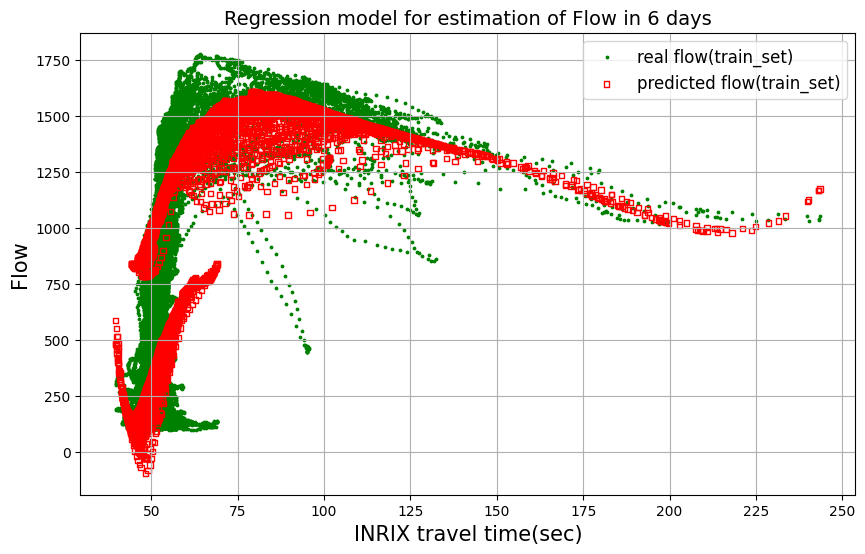

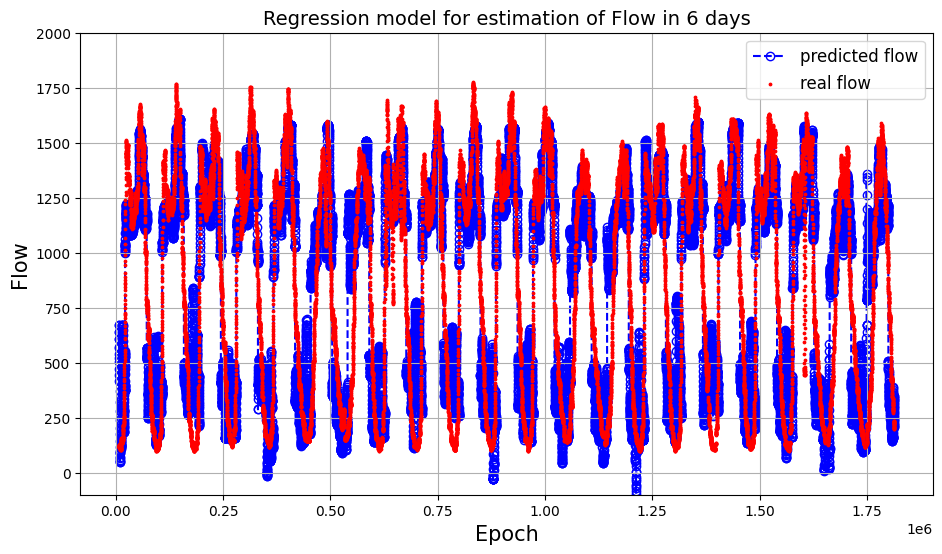

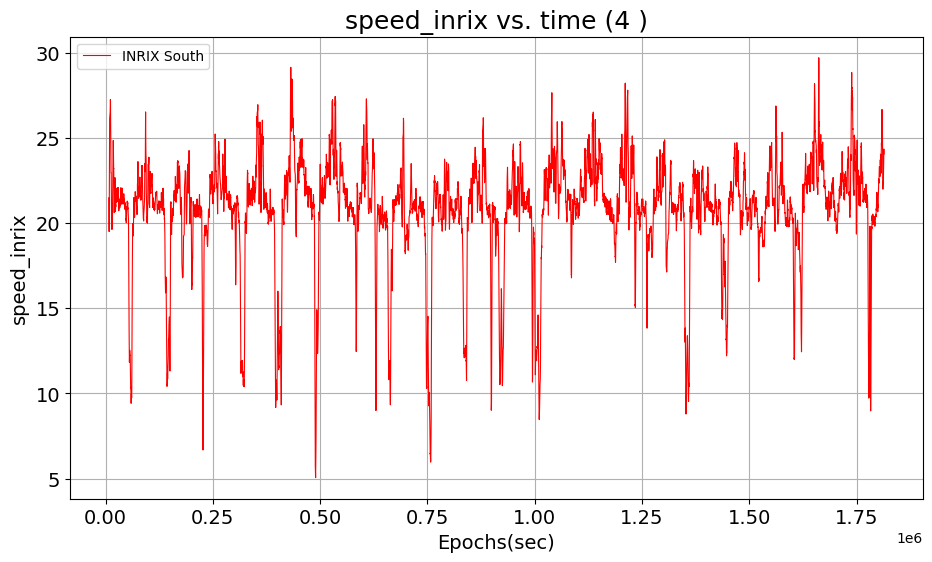

In [ ]:
STARTDATE = 1
ENDDATE = 99
DELTA_STEP = 0
DELTA_STEP2 = 0
X_features_inrix_denormalized = inrix_scaler.inverse_transform(X_features[:,1:-1])
# Plot real and predicted flow vs. X_features (speed_inrix)
plt.figure(figsize=(10, 6))
plt.ylim(bottom = 0, top=2000)
plt.xlim(left = 0, right=30)
plotResult(X_features_inrix_denormalized[idx(combinedSouth_2w, STARTDATE) +DELTA_STEP: idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2, 0], 
           Y_label[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP: idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           Y_predict[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP : idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           None,  None, None, '6 days', 'INRIX speed', 'Flow')

# Plot real and predicted flow vs. X_features (travel time)
plt.figure(figsize=(10, 6))
plotResult(X_features_inrix_denormalized[idx(combinedSouth_2w, STARTDATE) +DELTA_STEP: idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2, 4], 
           Y_label[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP: idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           Y_predict[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP : idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           None,  None, None, '6 days', 'INRIX travel time(sec)', 'Flow')


# Plot real and predicted flow vs. Epoch 
plt.figure(figsize=(11, 6))
plt.ylim(bottom = -100, top = 2000)
plotResult(X_epoch[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP:idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           Y_label[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP:idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           Y_predict[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP:idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           None, None, None, '6 days', 'Epoch', 'Flow', 'p')

# Plot corresponding mcs speed 
plt.figure(figsize=(11, 6))
plotAttr(4, combinedSouth_2w.iloc[idx(combinedSouth_2w, STARTDATE):idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 'speed_inrix', 'INRIX South')


#### Test the LR model on the future data (totally unseen) from the same link
*   test the model on the future dataset 22nd - 27th Oct.

In [ ]:
# select 1 week future data (22nd - 27th) to test the model
combinedSouth_future = combinedSouth_shifted.iloc[idx(combinedSouth_shifted, 22):idx(combinedSouth_shifted, 28)]
combinedSouth_future.reset_index(inplace=True, drop=True)


# prepare the feature "INRIX speed"
X_epoch = combinedSouth_future['Epoch_mcs'].values
X_inrix_speed = combinedSouth_future['speed_inrix'].values
X_inrix_travel = combinedSouth_future['travel_time_secs'].values
X_temporal = combinedSouth_future['daytime'].values
Y_flow = combinedSouth_future['flow'].values

# turn single feature into polynomial features matrix: 1, s, s^2, s^3, ...
X_inrix_speed = makePoly(4, X_inrix_speed)
X_inrix_travel = makePoly(4, X_inrix_travel)
X_inrix_travel = np.delete(X_inrix_travel, 0, 1)
X_inrix_speed_travel = np.concatenate((X_inrix_speed, X_inrix_travel), axis=1)

# X = makePoly_multi(4, X)
# standardizate the (polynomial) speed and travel time vectors
X_inrix, inrix_scaler_future = normalize(X_inrix_speed_travel)

# combine (normalized/polymerized) speed, speed_upstream, temporal factor to a feature vector
X_inrix_features = np.concatenate((X_inrix, X_temporal.reshape(-1,1)), axis=1)

# code for monitoring feature matrix
# could be commented out while don't want to print out
dfRawFeatures = pd.DataFrame(X_inrix_features)
dfRawFeatures.describe()

,0,1,2,3,4,5,6,7,8,9
count,8007.0,8.007000e+03,8.007000e+03,8.007000e+03,8.007000e+03,8.007000e+03,8.007000e+03,8.007000e+03,8.007000e+03,8007.000000
mean,1.0,3.635145e-15,7.008049e-15,-1.472341e-14,-1.378634e-15,8.470030e-15,1.245573e-15,6.221589e-16,7.792360e-16,0.626452
std,0.0,1.000062e+00,1.000062e+00,1.000062e+00,1.000062e+00,1.000062e+00,1.000062e+00,1.000062e+00,1.000062e+00,0.483776
min,1.0,-4.120197e+00,-3.253490e+00,-2.673613e+00,-2.260689e+00,-9.504641e-01,-6.832798e-01,-4.818810e-01,-3.357047e-01,0.000000
25%,1.0,-7.005109e-02,-1.742482e-01,-2.731566e-01,-3.590652e-01,-4.481072e-01,-3.952058e-01,-3.334890e-01,-2.679246e-01,0.000000
50%,1.0,2.206426e-01,1.652366e-01,1.021409e-01,3.684003e-02,-3.015170e-01,-3.019216e-01,-2.802837e-01,-2.410759e-01,1.000000
75%,1.0,5.197217e-01,5.310755e-01,5.257463e-01,5.048883e-01,-1.460388e-01,-1.984283e-01,-2.185388e-01,-2.084837e-01,1.000000
max,1.0,1.903312e+00,2.442097e+00,3.031244e+00,3.648080e+00,6.997378e+00,9.611397e+00,1.287713e+01,1.627599e+01,1.000000


In [ ]:
# assign normalized polynomial features matrix to the feature matrix,
# assign target to label array
X_features_future = X_inrix_features
Y_future = Y_flow

In [ ]:
# Use the model to estimate the flow on adjacent link dataset
Y_predict_future = regressor.predict(X_features_future)

# Evaluate estimation accuracy on testing set
print("Root Mean Square Error: ", mean_squared_error(Y_future, Y_predict_future, squared=False))
print("R2 Score for (future) testing set: ", r2_score(Y_future, Y_predict_future))

Root Mean Square Error:  215.06597352027651
R2 Score for (future) testing set:  0.8195304796110934


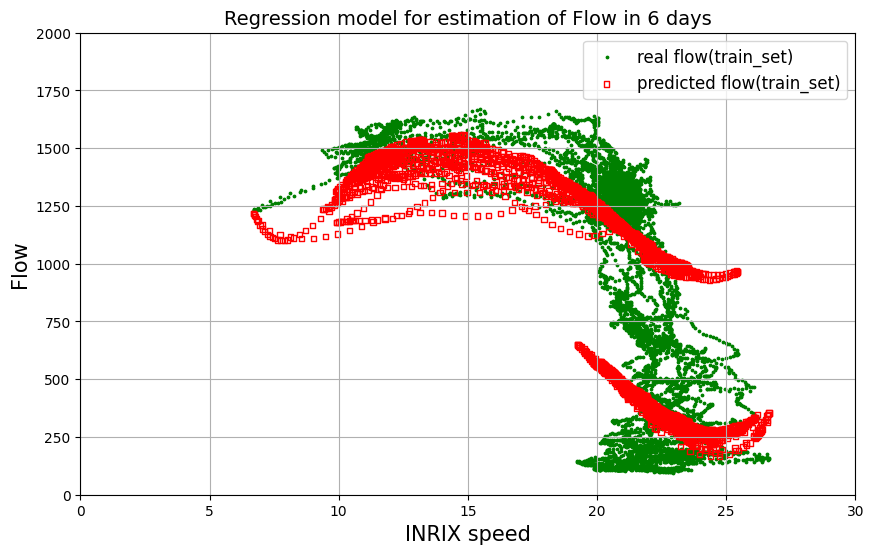

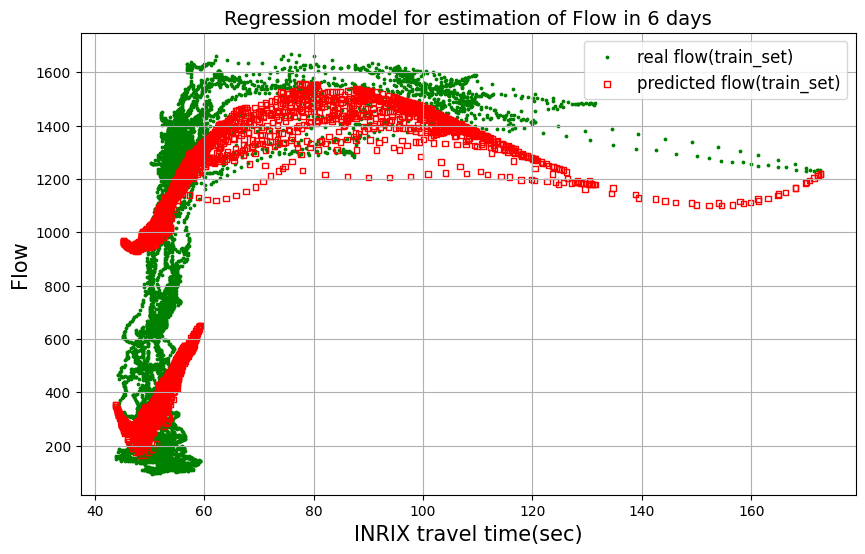

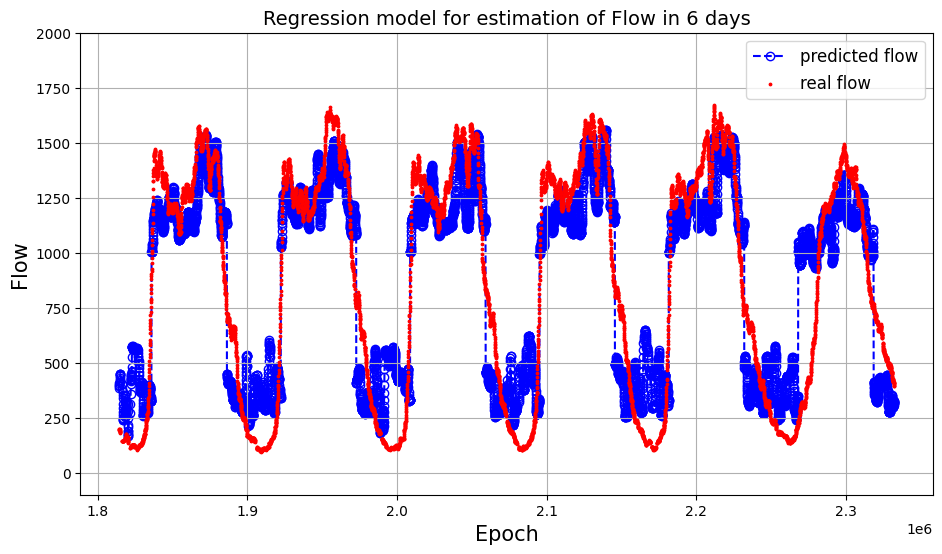

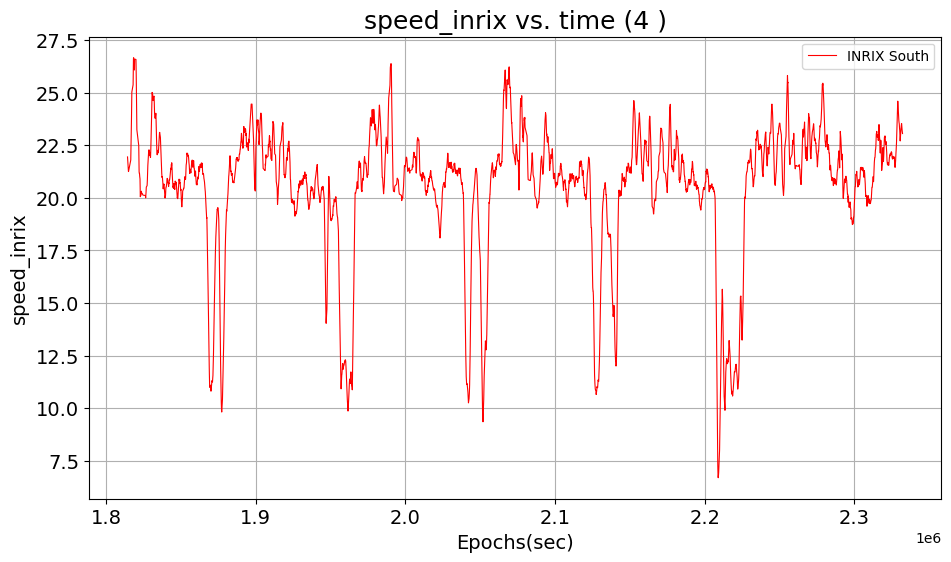

In [ ]:
STARTDATE = 1
ENDDATE = 99
DELTA_STEP = 0
DELTA_STEP2 = 0
dataFrame = combinedSouth_future
X_features_inrix_denormalized = inrix_scaler_future.inverse_transform(X_features_future[:,1:-1])
# Plot real and predicted flow vs. X_features (speed_inrix)
plt.figure(figsize=(10, 6))
plt.ylim(bottom = 0, top=2000)
plt.xlim(left = 0, right=30)
plotResult(X_features_inrix_denormalized[idx(dataFrame, STARTDATE) +DELTA_STEP: idx(dataFrame, ENDDATE) + DELTA_STEP2, 0], 
           Y_future[idx(dataFrame, STARTDATE)+DELTA_STEP: idx(dataFrame, ENDDATE) + DELTA_STEP2], 
           Y_predict_future[idx(dataFrame, STARTDATE)+DELTA_STEP : idx(dataFrame, ENDDATE) + DELTA_STEP2], 
           None,  None, None, '6 days', 'INRIX speed', 'Flow')

# Plot real and predicted flow vs. X_features (travel time)
plt.figure(figsize=(10, 6))
plotResult(X_features_inrix_denormalized[idx(dataFrame, STARTDATE) +DELTA_STEP: idx(dataFrame, ENDDATE) + DELTA_STEP2, 4], 
           Y_future[idx(dataFrame, STARTDATE)+DELTA_STEP: idx(dataFrame, ENDDATE) + DELTA_STEP2], 
           Y_predict_future[idx(dataFrame, STARTDATE)+DELTA_STEP : idx(dataFrame, ENDDATE) + DELTA_STEP2], 
           None,  None, None, '6 days', 'INRIX travel time(sec)', 'Flow')


# Plot real and predicted flow vs. Epoch 
plt.figure(figsize=(11, 6))
plt.ylim(bottom = -100, top = 2000)
plotResult(X_epoch[idx(dataFrame, STARTDATE)+DELTA_STEP:idx(dataFrame, ENDDATE) + DELTA_STEP2], 
           Y_future[idx(dataFrame, STARTDATE)+DELTA_STEP:idx(dataFrame, ENDDATE) + DELTA_STEP2], 
           Y_predict_future[idx(dataFrame, STARTDATE)+DELTA_STEP:idx(dataFrame, ENDDATE) + DELTA_STEP2], 
           None, None, None, '6 days', 'Epoch', 'Flow', 'p')

# Plot corresponding mcs speed 
plt.figure(figsize=(11, 6))
plotAttr(4, dataFrame.iloc[idx(dataFrame, STARTDATE):idx(dataFrame, ENDDATE) + DELTA_STEP], 'speed_inrix', 'INRIX South')


#### Test the LR model on adjacent(upstream) link

In [ ]:
# select 1 week future data (22nd - 27th) to test the model
combinedNorth_2w = combinedNorth_shifted.iloc[:idx(combinedNorth_shifted, 22)]

# prepare the feature "INRIX speed"
X_epoch = combinedNorth_2w['Epoch_mcs'].values
X_inrix_speed = combinedNorth_2w['speed_inrix'].values
X_inrix_travel = combinedNorth_2w['travel_time_secs'].values
X_temporal = combinedNorth_2w['daytime'].values
Y_flow = combinedNorth_2w['flow'].values


# turn single feature into polynomial features matrix: 1, s, s^2, s^3, ...
X_inrix_speed = makePoly(4, X_inrix_speed)
X_inrix_travel = makePoly(4, X_inrix_travel)
X_inrix_travel = np.delete(X_inrix_travel, 0, 1)
X_inrix_speed_travel = np.concatenate((X_inrix_speed, X_inrix_travel), axis=1)

# X = makePoly_multi(4, X)
# standardizate the (polynomial) speed and travel time vectors
X_inrix, inrix_scaler_adjacent = normalize(X_inrix_speed_travel)

# combine (normalized/polymerized) speed, speed_upstream, temporal factor to a feature vector
X_inrix_features = np.concatenate((X_inrix, X_temporal.reshape(-1,1)), axis=1)

# code for monitoring feature matrix
# could be commented out while don't want to print out
dfRawFeatures = pd.DataFrame(X_inrix_features)
dfRawFeatures.describe()

,0,1,2,3,4,5,6,7,8,9
count,28387.0,2.838700e+04,2.838700e+04,2.838700e+04,2.838700e+04,2.838700e+04,2.838700e+04,2.838700e+04,2.838700e+04,28387.000000
mean,1.0,3.826229e-14,4.377338e-14,1.183007e-13,7.057283e-15,-2.897511e-14,1.072465e-14,1.514007e-16,6.009463e-17,0.619474
std,0.0,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,0.485525
min,1.0,-5.777580e+00,-3.859498e+00,-2.940665e+00,-2.391371e+00,-7.628550e-01,-2.817051e-01,-9.621885e-02,-4.937211e-02,0.000000
25%,1.0,-1.564353e-01,-2.717369e-01,-3.707025e-01,-4.484505e-01,-3.231539e-01,-1.659452e-01,-7.713074e-02,-4.679590e-02,0.000000
50%,1.0,1.680348e-01,1.095396e-01,4.467472e-02,-1.942608e-02,-2.092339e-01,-1.318620e-01,-7.076749e-02,-4.582709e-02,1.000000
75%,1.0,5.225485e-01,5.478524e-01,5.471095e-01,5.266071e-01,-9.099022e-02,-9.470413e-02,-6.348103e-02,-4.466187e-02,1.000000
max,1.0,2.238034e+00,2.989455e+00,3.780970e+00,4.602337e+00,1.919176e+01,3.023508e+01,3.597518e+01,3.883218e+01,1.000000


In [ ]:
# assign normalized polynomial features matrix to the feature matrix,
# assign target to label array
X_features_adjacent = X_inrix_features
Y_ = Y_flow

In [ ]:
# Use the model to estimate the flow on adjacent link dataset
Y_predict_adjacent = regressor.predict(X_features_adjacent)

# Evaluate estimation accuracy on testing set
print("Root Mean Square Error: ", mean_squared_error(Y_adjacent, Y_predict_adjacent, squared=False))
print("R2 Score for (adjacent) testing set: ", r2_score(Y_adjacent, Y_predict_adjacent))

Root Mean Square Error:  447.61336201057077
R2 Score for (adjacent) testing set:  0.1691103101185688


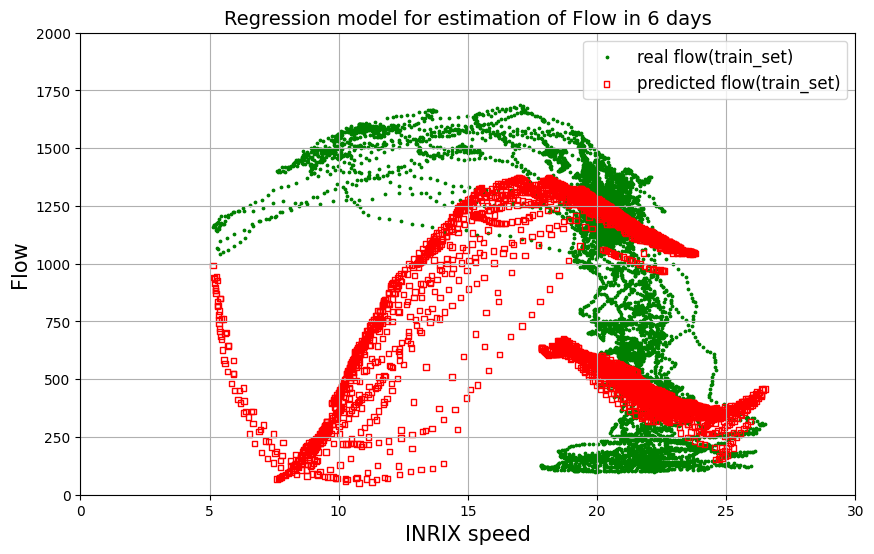

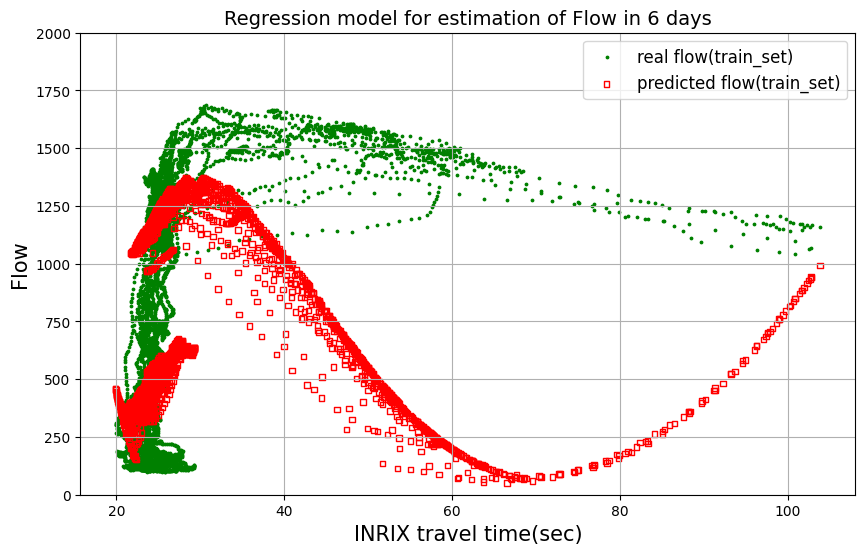

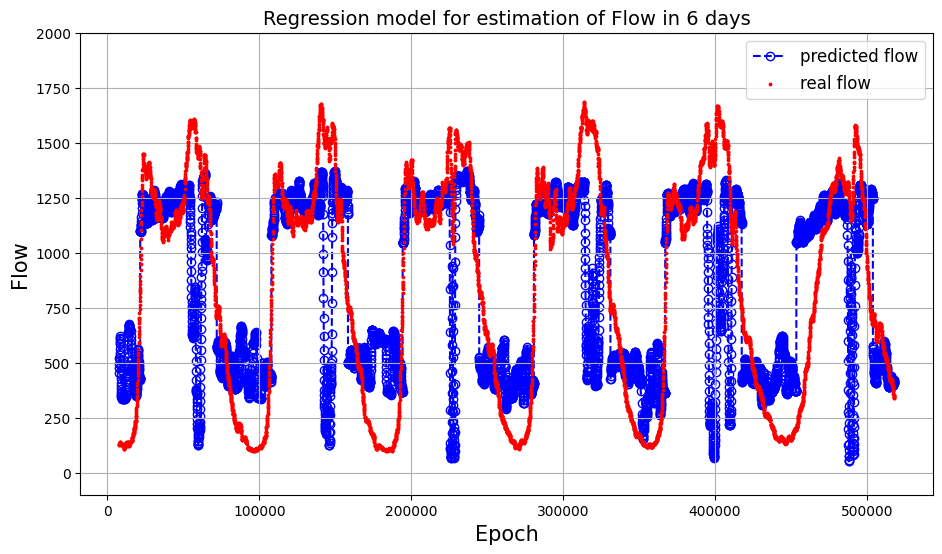

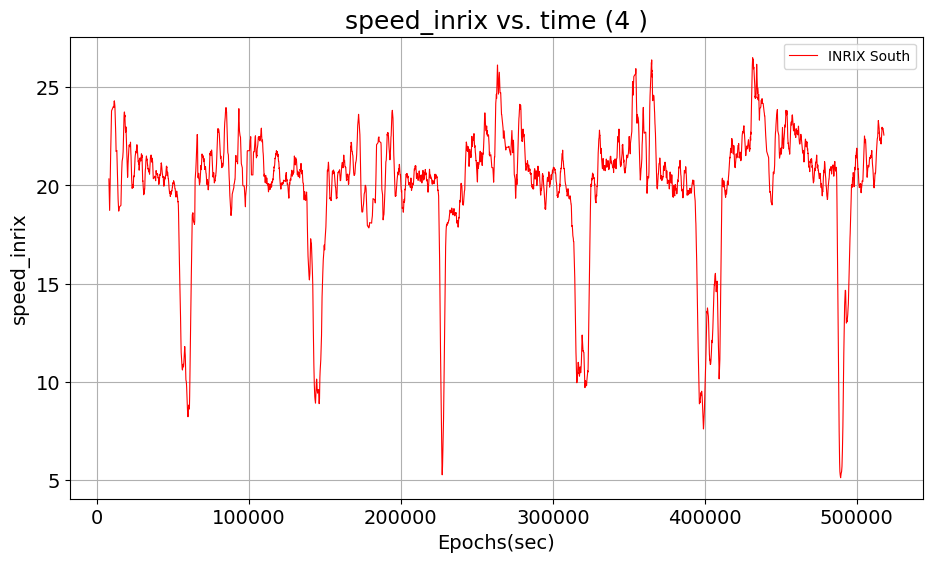

In [ ]:
STARTDATE = 1
ENDDATE = 7
DELTA_STEP = 0
DELTA_STEP2 = 0
dataFrame = combinedNorth_2w
X_features_inrix_denormalized = inrix_scaler_adjacent.inverse_transform(X_features_adjacent[:,1:-1])
# Plot real and predicted flow vs. X_features (speed_inrix)
plt.figure(figsize=(10, 6))
plt.ylim(bottom = 0, top=2000)
plt.xlim(left = 0, right=30)
plotResult(X_features_inrix_denormalized[idx(dataFrame, STARTDATE) +DELTA_STEP: idx(dataFrame, ENDDATE) + DELTA_STEP2, 0], 
           Y_adjacent[idx(dataFrame, STARTDATE)+DELTA_STEP: idx(dataFrame, ENDDATE) + DELTA_STEP2], 
           Y_predict_adjacent[idx(dataFrame, STARTDATE)+DELTA_STEP : idx(dataFrame, ENDDATE) + DELTA_STEP2], 
           None,  None, None, '6 days', 'INRIX speed', 'Flow')

# Plot real and predicted flow vs. X_features (travel time)
plt.figure(figsize=(10, 6))
plt.ylim(bottom = 0, top=2000)
plotResult(X_features_inrix_denormalized[idx(dataFrame, STARTDATE) +DELTA_STEP: idx(dataFrame, ENDDATE) + DELTA_STEP2, 4], 
           Y_adjacent[idx(dataFrame, STARTDATE)+DELTA_STEP: idx(dataFrame, ENDDATE) + DELTA_STEP2], 
           Y_predict_adjacent[idx(dataFrame, STARTDATE)+DELTA_STEP : idx(dataFrame, ENDDATE) + DELTA_STEP2], 
           None,  None, None, '6 days', 'INRIX travel time(sec)', 'Flow')


# Plot real and predicted flow vs. Epoch 
plt.figure(figsize=(11, 6))
plt.ylim(bottom = -100, top = 2000)
plotResult(X_epoch[idx(dataFrame, STARTDATE)+DELTA_STEP:idx(dataFrame, ENDDATE) + DELTA_STEP2], 
           Y_adjacent[idx(dataFrame, STARTDATE)+DELTA_STEP:idx(dataFrame, ENDDATE) + DELTA_STEP2], 
           Y_predict_adjacent[idx(dataFrame, STARTDATE)+DELTA_STEP:idx(dataFrame, ENDDATE) + DELTA_STEP2], 
           None, None, None, '6 days', 'Epoch', 'Flow', 'p')

# Plot corresponding mcs speed 
plt.figure(figsize=(11, 6))
plotAttr(4, dataFrame.iloc[idx(dataFrame, STARTDATE):idx(dataFrame, ENDDATE) + DELTA_STEP], 'speed_inrix', 'INRIX South')


## 5.3 Linear regression model: INRIX Speed -> MCS Flow (speed + daytime * 2 links)

In [ ]:
# prepare the feature "INRIX speed"
X_inrix_speed = combinedSouth_2w['speed_inrix'].values
X_inrix_speed_up = combinedSouth_2w['speed_inrix_up'].values
Y_flow = combinedSouth_2w['flow'].values
X_temporal = combinedSouth_2w['daytime'].values

# turn single feature into polynomial features matrix: 1, s, s^2, s^3, ...
X_inrix_speed = makePoly(4, X_inrix_speed)
X_inrix_speed, scaler_inrix_speed = normalize(X_inrix_speed)
X_inrix_speed_up = makePoly(4, X_inrix_speed_up) # upstream speed
X_inrix_speed_up, scaler_inrix_speed_up = normalize(X_inrix_speed_up)
X_inrix_speed_up = np.delete(X_inrix_speed_up, 0, axis=1)

# combine (normalized/polymerized) speed, speed_upstream, temporal factor to a feature vector
X_inrix_features = np.concatenate((X_inrix_speed, X_inrix_speed_up, X_temporal.reshape(-1,1)), axis=1)


# code for monitoring feature matrix
# could be commented out while don't want to print out
dfRawFeatures = pd.DataFrame(X_inrix_features)
dfRawFeatures.describe()

,0,1,2,3,4,5,6,7,8,9
count,28387.0,2.838700e+04,2.838700e+04,2.838700e+04,2.838700e+04,2.838700e+04,2.838700e+04,2.838700e+04,2.838700e+04,28387.000000
mean,1.0,3.785811e-15,-3.464129e-15,1.048769e-13,5.093869e-15,3.630994e-14,4.341331e-14,1.205382e-13,6.826790e-15,0.619509
std,0.0,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,0.485516
min,1.0,-4.825326e+00,-3.527007e+00,-2.744254e+00,-2.222269e+00,-5.778012e+00,-3.859856e+00,-2.940949e+00,-2.391580e+00,0.000000
25%,1.0,-1.274934e-01,-2.343340e-01,-3.277907e-01,-4.007445e-01,-1.564138e-01,-2.717113e-01,-3.706725e-01,-4.484131e-01,0.000000
50%,1.0,1.522075e-01,8.666730e-02,1.648139e-02,-5.098527e-02,1.680825e-01,1.096059e-01,4.475543e-02,-1.933442e-02,1.000000
75%,1.0,5.032606e-01,5.094313e-01,4.922931e-01,4.563258e-01,5.226247e-01,5.479655e-01,5.472516e-01,5.267678e-01,1.000000
max,1.0,2.780825e+00,3.789602e+00,4.935965e+00,6.195372e+00,2.238249e+00,2.989829e+00,3.781507e+00,4.603013e+00,1.000000


In [ ]:
# assign normalized polynomial features matrix into feature matrix,
# assign predict target to label array
X_features = X_inrix_features
Y_label = Y_flow

# split training and test data
X_train, X_test, Y_train, Y_test = train_test_split(X_features, Y_label, test_size=0.2, random_state=1)

In [ ]:
# Use 10 folds cross-validation to fit and validate the model by training set
scores = cross_val_score(LinearRegression(fit_intercept=False), X_train, Y_train, scoring='r2', cv=10)
display_scores(scores)

Scores: [0.79564019 0.79500391 0.78216115 0.7741053  0.79389138 0.78527707
 0.79604678 0.79049906 0.78874636 0.78247907]
Mean: 0.7883850275035403
Standard deviation: 0.006908374047687341


In [ ]:
# Build the regression model fitted on whole train dataset
regressor = LRmodel(X_train, Y_train)

# Evaluate Performance of training set
Y_predict_train = regressor.predict(X_train)
print("Root Mean Square Error for training set: ", mean_squared_error(Y_train, Y_predict_train, squared=False))
print("R2 Score for training set: ", r2_score(Y_train, Y_predict_train))

# Evaluate Performance of testing set
Y_predict_test = regressor.predict(X_test)
print("Root Mean Square Error: ", mean_squared_error(Y_test, Y_predict_test, squared=False))
print("R2 Score: ", r2_score(Y_test, Y_predict_test))

Root Mean Square Error for training set:  234.40421282155984
R2 Score for training set:  0.7885990848744227
Root Mean Square Error:  235.30679713220616
R2 Score:  0.7910046188244672


6:00 to 18:00: 0.7204284190785<br>
6:00 to 20:00: 0.787160 <br>

In [ ]:
# print the coefficient of the linear model
regressor.coef_

array([   477.09348491,  -2247.68075055,   9200.04725344, -11881.57913895,
         4832.05885566,   1546.08778485,  -4225.10714718,   3744.50739869,
        -1076.09543724,    685.09168399])

    R2 Experiment(10-folds cross validation on train dataset):
    * d = 2: 
    * d = 3: 0.45
    * d = 4: 0.477
    * d = 5: 0.49
    * d = 6: 0.48


  

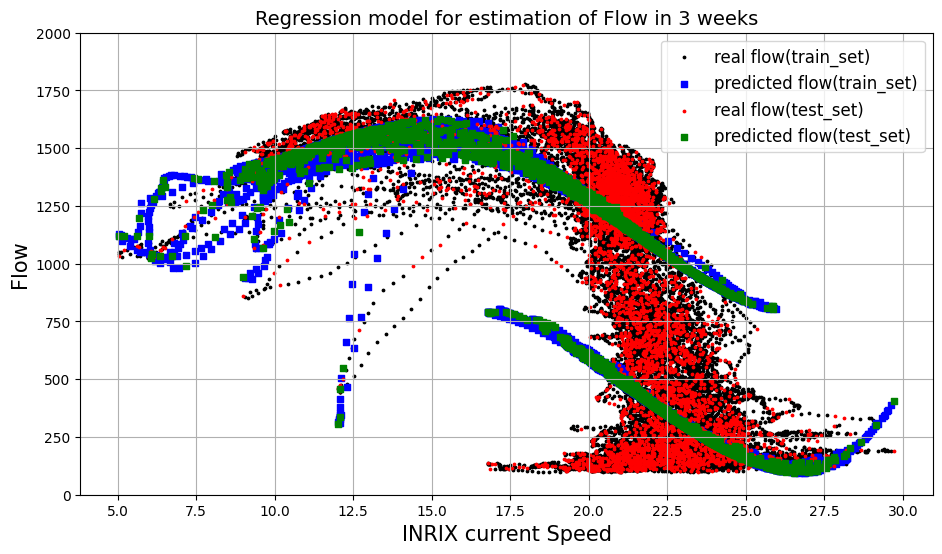

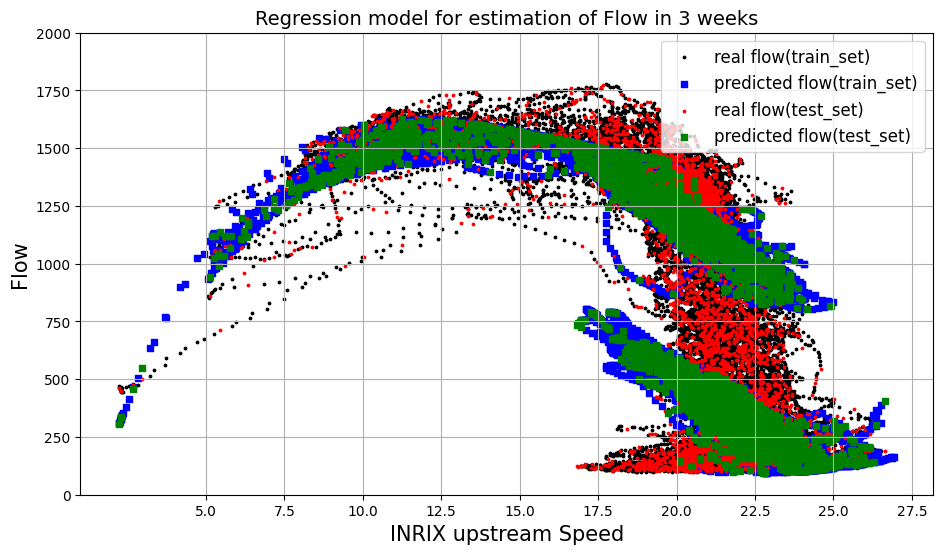

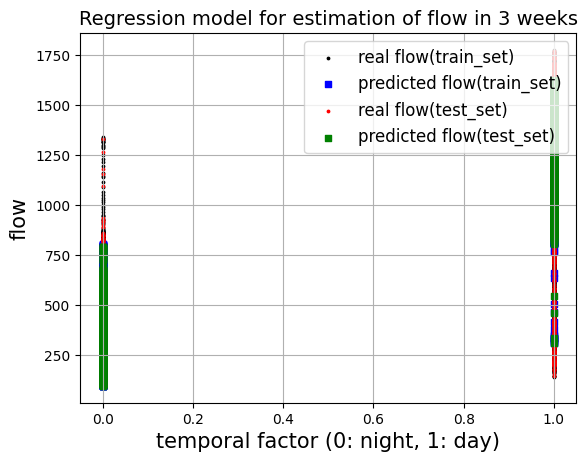

In [ ]:
X_train_denormalized = scaler_inrix_speed.inverse_transform(X_train[:,1:5])
X_test_denormalized = scaler_inrix_speed.inverse_transform(X_test[:, 1:5])
X_train_up_denormalized = scaler_inrix_speed_up.inverse_transform(X_train[:,5:9])
X_test_up_denormalized = scaler_inrix_speed_up.inverse_transform(X_test[:,5:9])

# Plot real and predicted flow for X_train(South), X_test
plt.figure(figsize=(11, 6))
plt.ylim(top = 2000)
#plt.xlim(left=-7, right = 2)
plt.xticks(np.arange(5, 40, step=2.5))
plotResult(X_train_denormalized[:, 0], Y_train, Y_predict_train, 
           X_test_denormalized[:, 0], Y_test, Y_predict_test, '3 weeks', 'INRIX current Speed', 'Flow')

# Plot real and predicted flow for X_train(South), X_test
plt.figure(figsize=(11, 6))
plt.ylim(top = 2000)
#plt.xlim(left=-7, right = 2)
plt.xticks(np.arange(5, 40, step=2.5))
plotResult(X_train_up_denormalized[:, 0], Y_train, Y_predict_train, 
           X_test_up_denormalized[:, 0], Y_test, Y_predict_test, '3 weeks', 'INRIX upstream Speed', 'Flow')

# plot flow vs. temporal factor
plotResult(X_train[:, -1], Y_train, Y_predict_train, 
           X_test[:, -1], Y_test, Y_predict_test, '3 weeks', 'temporal factor (0: night, 1: day)', 'flow')

In [ ]:
# Use all dataset (train+test) to predict the flow 
#(only for drawing plot)
Y_predict = regressor.predict(X_features)

In [ ]:
print(combinedSouth_2w.iloc[idx(combinedSouth_2w, STARTDATE) + DELTA_STEP].date)
print(combinedSouth_2w.iloc[idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2].date)

2018-10-08 00:00:00
2018-10-14 00:00:00


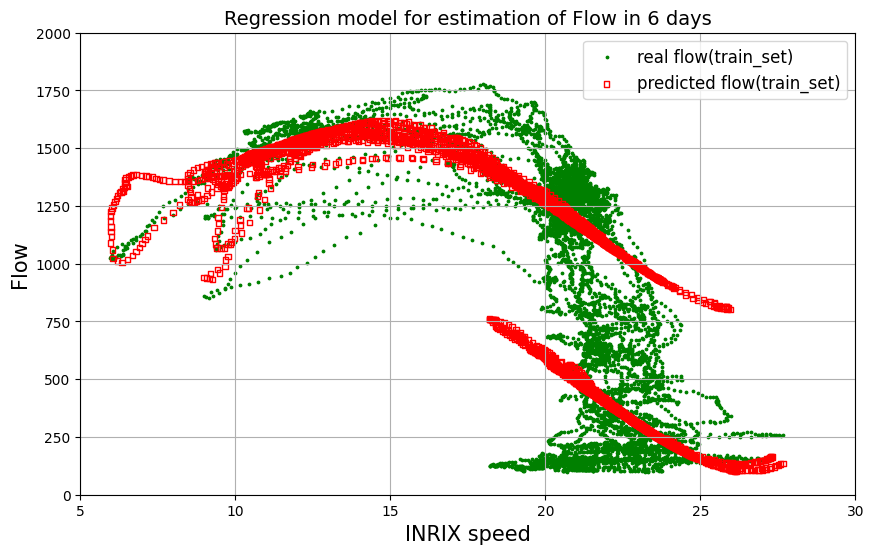

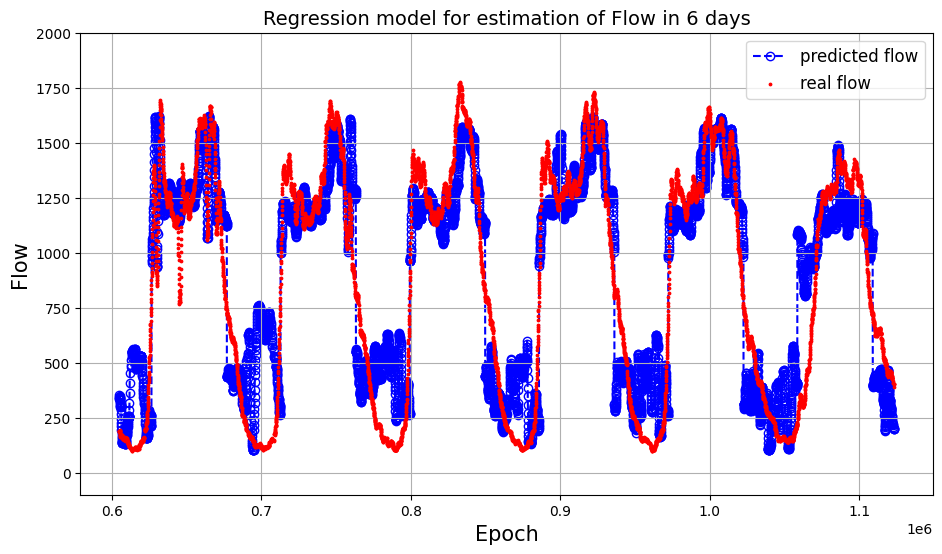

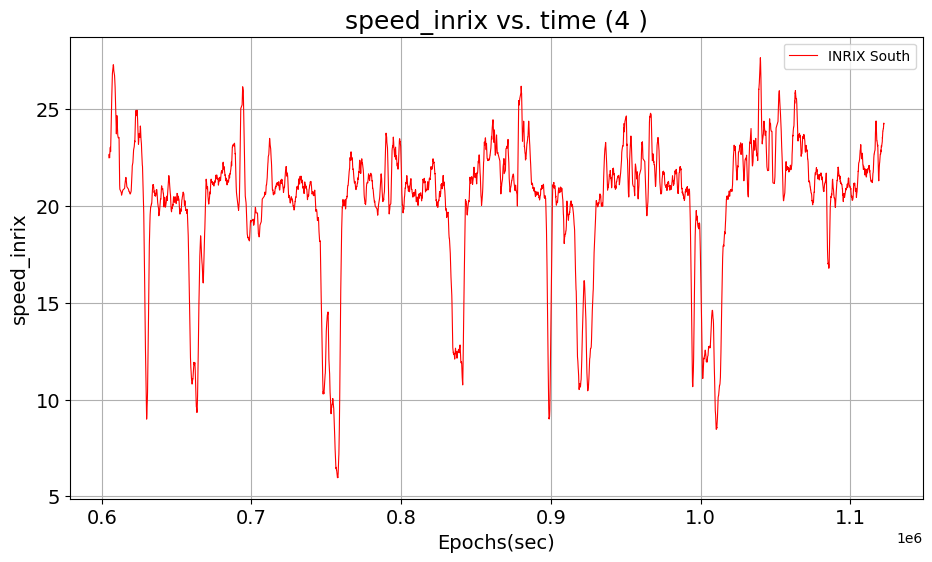

In [ ]:
STARTDATE = 8
ENDDATE = 14
DELTA_STEP = 0
DELTA_STEP2 = 0
X_features_inrix_denormalized = scaler_inrix_speed.inverse_transform(X_features[:,1:5])
# Plot real and predicted flow vs. X_features (speed_inrix)
plt.figure(figsize=(10, 6))
plt.ylim(bottom = 0, top=2000)
plt.xlim(left = 5, right=30)
plotResult(X_features_inrix_denormalized[idx(combinedSouth_2w, STARTDATE) +DELTA_STEP: idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2, 0], 
           Y_label[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP: idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           Y_predict[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP : idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           None,  None, None, '6 days', 'INRIX speed', 'Flow')

# plotResult(X_features_mcs_denormalized[:, 0], Y_label, Y_predict, 
#            None,  None, None, '3 weeks', 'MCS speed', 'Flow')


# Plot real and predicted flow vs. Epoch 
plt.figure(figsize=(11, 6))
plt.ylim(bottom = -100, top = 2000)
plotResult(X_epoch[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP:idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           Y_label[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP:idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           Y_predict[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP:idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           None, None, None, '6 days', 'Epoch', 'Flow', 'p')

# Plot corresponding mcs speed 
plt.figure(figsize=(11, 6))
plotAttr(4, combinedSouth_2w.iloc[idx(combinedSouth_2w, STARTDATE):idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 'speed_inrix', 'INRIX South')


      add future prediction!!

# 6. Dicision Tree


*   Use decision tree to extract dependency between MCS speed and (MCS) flow
*   Use decision tree to extract dependency between INRIX speed, INRIX travel time and (MCS) flow



## 6.1 Decision tree model: MCS speed -> MCS flow



In [53]:
# function for quickly tuning the depth of the decision tree 
# (should use cross validation for hyper-parameter tuning)
# Input: decision tree model, train and test datasets, and a list that specifies the 
# depth splits, eg: split = [2, 3, 4, 5, 6] tests depth from 2 to 6
# Output: return the experiment result in as dataframe with 3 columns:
# depth split, r2 for test dataset, r2 for train dataset.
def quickSplitTuning(model, x_train, y_train, x_test, y_test, split):
  trainR2Array = []
  testR2Array = []
  for i in split:
    estimator = model(max_depth = i, random_state = 0)
    estimator.fit(x_train, y_train)
    trainR2Array.append(estimator.score(x_train, y_train))
    testR2Array.append(estimator.score(x_test, y_test))
  result = pd.DataFrame({'split': split, 'Train_R2': trainR2Array, 'Test_R2': testR2Array})
  
  return result


In [54]:
# prepare the features [MCS speed] and label [flow]
# Notice: Y_flow was already defined in previous section 3.
# X_epoch was already defined
X_mcs_speed_temp = combinedSouth_2w[['speed', 'daytime']].values

X_features = X_mcs_speed_temp
Y_label = Y_flow

print(X_features.shape)

# split the train and test datasets
X_train, X_test, Y_train, Y_test = train_test_split(X_features, Y_label, test_size=0.2, random_state=1)


(28387, 2)


In [55]:
# quick eperiment the max_depth splits(hyperparameters) 
split = list(range(1, 15))
print(split)
result = quickSplitTuning(DecisionTreeRegressor, X_train, Y_train, X_test, Y_test, split)
print(result)

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]
    split  Train_R2   Test_R2
0       1  0.783866  0.789835
1       2  0.868708  0.870779
2       3  0.912906  0.914618
3       4  0.927030  0.927058
4       5  0.933373  0.932268
5       6  0.935366  0.933255
6       7  0.936667  0.932814
7       8  0.937981  0.931603
8       9  0.939622  0.929182
9      10  0.941597  0.928037
10     11  0.944021  0.925338
11     12  0.946542  0.922806
12     13  0.949723  0.918807
13     14  0.952596  0.915764


    Split Experiment Result:
    depth = 5 or 6 has largest accuracy while not over-fitting

In [56]:
# Hyperparameter tuning: depth of tree
# by using training set
DTRegressor = DecisionTreeRegressor()
print(DTRegressor.get_params)

param_grid = {'max_depth': [int(x) for x in np.arange(7, 8, 1)], 
              'min_samples_leaf': [int(x) for x in np.arange(20, 30, 1)]}

# param_grid = {'max_depth': [5], 
#               'min_samples_leaf': [int(x) for x in np.arange(1, 20, step=1)]}
              
grid_search = GridSearchCV(DTRegressor, param_grid, cv=7, scoring='r2', n_jobs = -1)
grid_search.fit(X_train, Y_train)

grid_search.best_params_

<bound method BaseEstimator.get_params of DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')>


{'max_depth': 7, 'min_samples_leaf': 23}

In [57]:
cvres = grid_search.cv_results_
for mean_score, params in zip(cvres["mean_test_score"], cvres['params']):
  print(mean_score, params)

0.9309441058737474 {'max_depth': 7, 'min_samples_leaf': 20}
0.9310354034959337 {'max_depth': 7, 'min_samples_leaf': 21}
0.9310169510130082 {'max_depth': 7, 'min_samples_leaf': 22}
0.9312310466158316 {'max_depth': 7, 'min_samples_leaf': 23}
0.9310273113459815 {'max_depth': 7, 'min_samples_leaf': 24}
0.931048059564758 {'max_depth': 7, 'min_samples_leaf': 25}
0.9309117130603667 {'max_depth': 7, 'min_samples_leaf': 26}
0.930879950004343 {'max_depth': 7, 'min_samples_leaf': 27}
0.9308778473384886 {'max_depth': 7, 'min_samples_leaf': 28}
0.9308673901592056 {'max_depth': 7, 'min_samples_leaf': 29}


In [58]:
# train the model with train dataset and check the accuracy
DT_MAXDEPTH = 7
DT_MSL = 23 # minimum sample leaf
DTRegressor = DecisionTreeRegressor(max_depth = DT_MAXDEPTH, min_samples_leaf=10, random_state=0)
DTRegressor.fit(X_train, Y_train)

# Use 10 folds cross-validation to fit and validate the model by training set
scores = cross_val_score(DecisionTreeRegressor(max_depth = DT_MAXDEPTH, min_samples_leaf=10, random_state=0), 
                         X_train, Y_train, scoring='r2', cv=10)
display_scores(scores)
print()

# Evaluate Performance of training set
Y_predict_train = DTRegressor.predict(X_train)
print("Root Mean Square Error: ", mean_squared_error(Y_train, Y_predict_train, squared=False))
print("R2 Score: ", DTRegressor.score(X_train, Y_train))

# Evaluate Performance of testing set
Y_predict_test = DTRegressor.predict(X_test)
print("Root Mean Square Error: ", mean_squared_error(Y_test, Y_predict_test, squared=False))
print("R2 Score: ", r2_score(Y_test, Y_predict_test))


Scores: [0.93534549 0.93814952 0.92932304 0.93189723 0.92592256 0.92948156
 0.93174889 0.92901395 0.93759075 0.93175929]
Mean: 0.9320232270961692
Standard deviation: 0.0037383419174537233

Root Mean Square Error:  124.10137488439892
R2 Score:  0.9358908028491072
Root Mean Square Error:  128.18193856271455
R2 Score:  0.9328082979596319


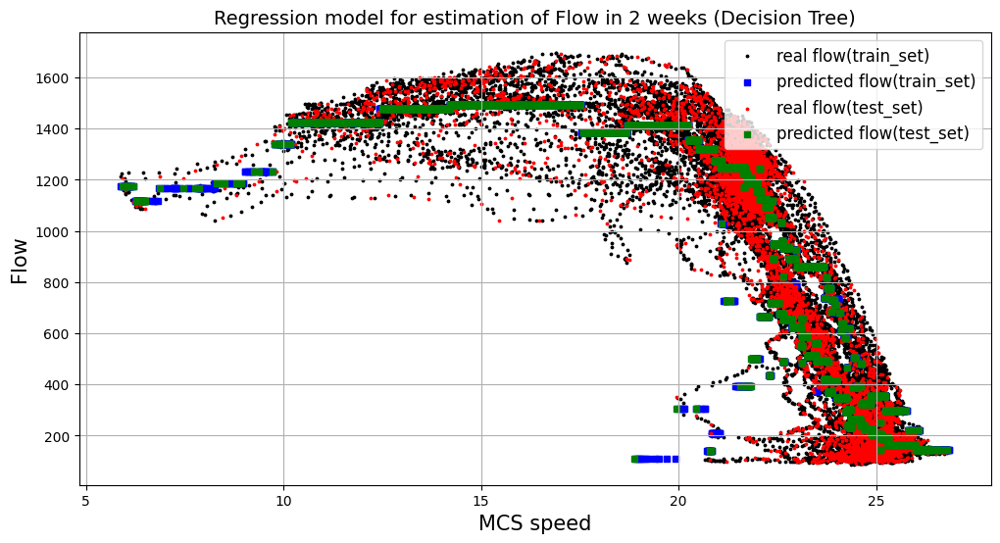

In [59]:
# Plot real and predicted 'flow' vs 'mcs speed' 
plt.figure(figsize=(12, 6))
# plt.ylim(top = 2000)
plotResult(X_train[:, 0], Y_train, Y_predict_train, X_test[:, 0], Y_test, Y_predict_test, '2 weeks (Decision Tree)', 'MCS speed', 'Flow')


In [60]:
# Use all data to predict the flow
Y_predict = DTRegressor.predict(X_features)

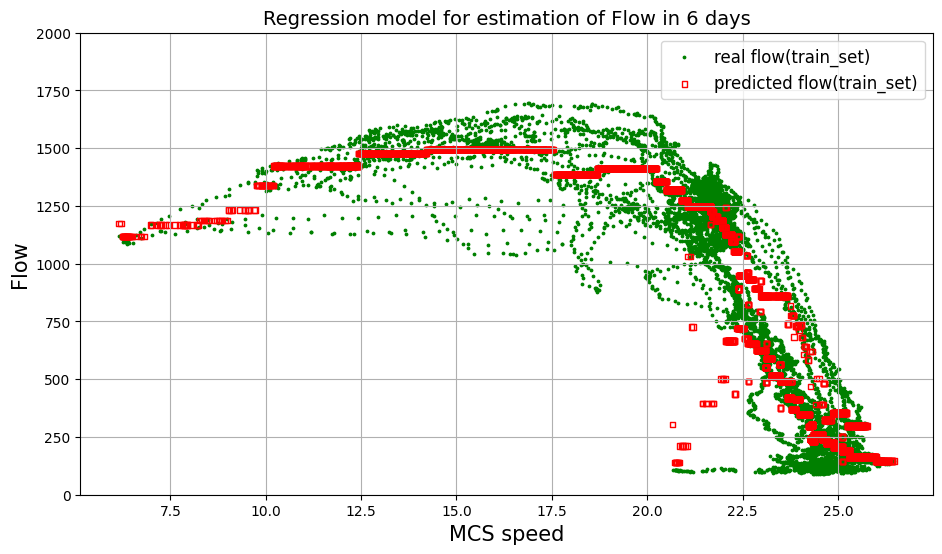

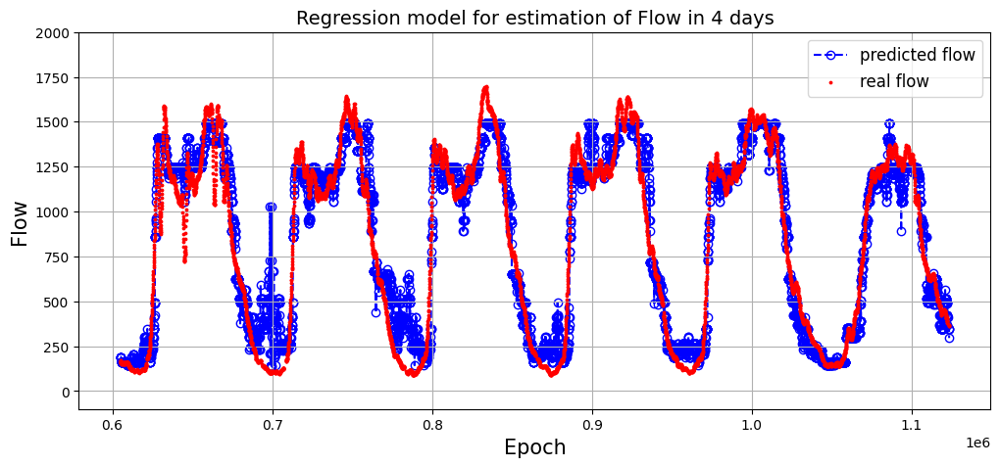

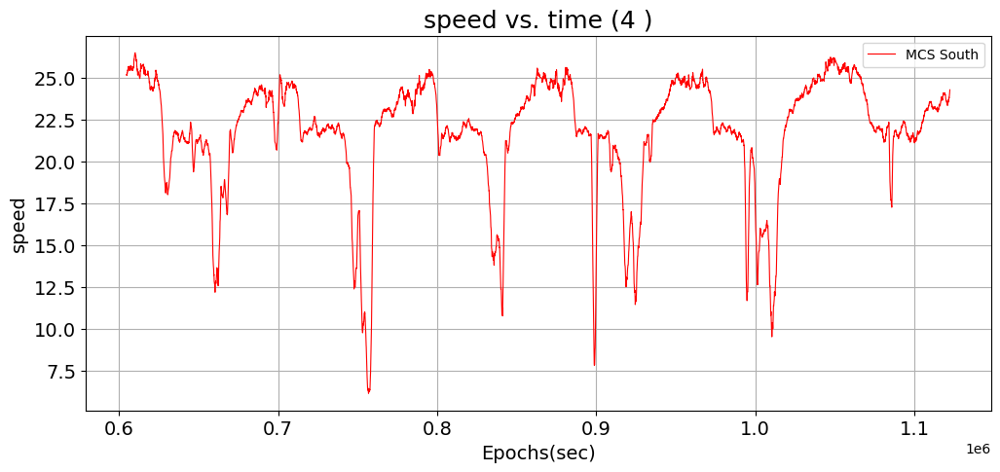

In [61]:
STARTDATE = 8
ENDDATE = 14
DELTA_STEP = 0
# Plot real and predicted flow vs. X_features (speed_inrix)
plt.figure(figsize=(11, 6))
plt.ylim(bottom = 0, top=2000)
# plt.xlim(left = 5, right=30)
plotResult(X_features[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP, 0], 
           Y_label[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           Y_predict[idx(combinedSouth_2w, STARTDATE) : idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           None,  None, None, '6 days', 'MCS speed', 'Flow')

# plotResult(X_features_mcs_denormalized[:, 0], Y_label, Y_predict, 
#            None,  None, None, '3 weeks', 'MCS speed', 'Flow')


# Plot real and predicted flow vs. Epoch 
plt.figure(figsize=(12, 5))
plt.ylim(bottom = -100, top = 2000)
plotResult(X_epoch[idx(combinedSouth_2w, STARTDATE):idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           Y_label[idx(combinedSouth_2w, STARTDATE):idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           Y_predict[idx(combinedSouth_2w, STARTDATE):idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           None, None, None, '4 days', 'Epoch', 'Flow', 'p')

# Plot corresponding mcs speed 
plt.figure(figsize=(12, 5))
plotAttr(4, combinedSouth_2w.iloc[idx(combinedSouth_2w, STARTDATE):idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 'speed', 'MCS South')



#### Test the Decision Tree model on the future data (totally unseen) from the same link:
*   test the model on the future dataset 22nd - 27th Oct.

In [ ]:
# test model on future test datasets (22th to 28th):
X_future = combinedSouth_future[['speed', 'daytime']].values
Y_future = combinedSouth_future[['flow']].values
print(X_future.shape)
Y_future_predict = DTRegressor.predict(X_future)
print("Root Mean Square Error: ", mean_squared_error(Y_future, Y_future_predict, squared=False))
print("R2 Score: ", r2_score(Y_future, Y_future_predict))

(8007, 2)
Root Mean Square Error:  112.50149953493916
R2 Score:  0.950617044532625


#### Test the Decision Tree model on the adjacent(upstream) link:

In [ ]:
# test model on adjacent(upstream) test datasets:
X_features_upstream = combinedNorth_2w[['speed', 'daytime']].values
X_epoch = combinedNorth_2w['Epoch_mcs'].values
Y_upstream = combinedNorth_2w[['flow']].values
Y_predict_upstream = DTRegressor.predict(X_features_upstream)
print("Root Mean Square Error: ", mean_squared_error(Y_upstream, Y_predict_upstream, squared=False))
print("R2 Score: ", r2_score(Y_upstream, Y_predict_upstream))

Root Mean Square Error:  305.1379060227169
R2 Score:  0.613873500102508


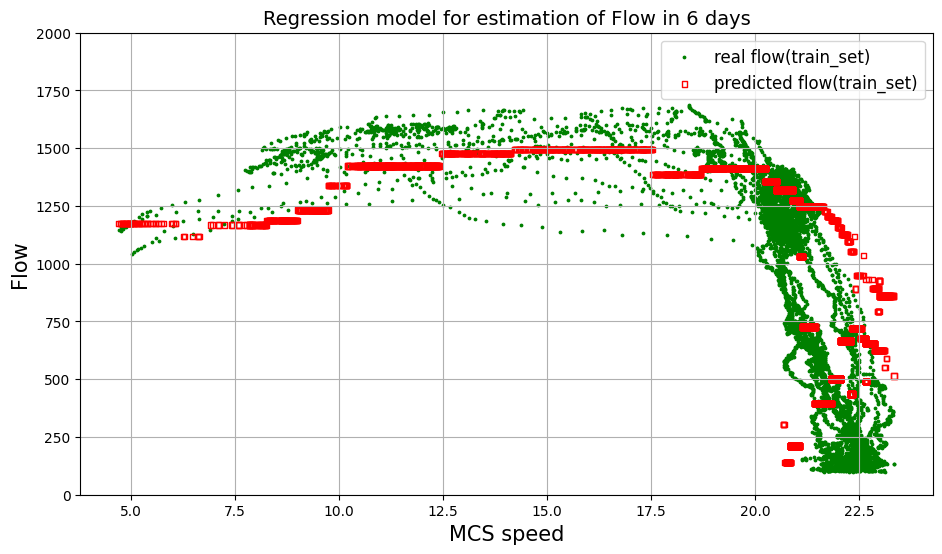

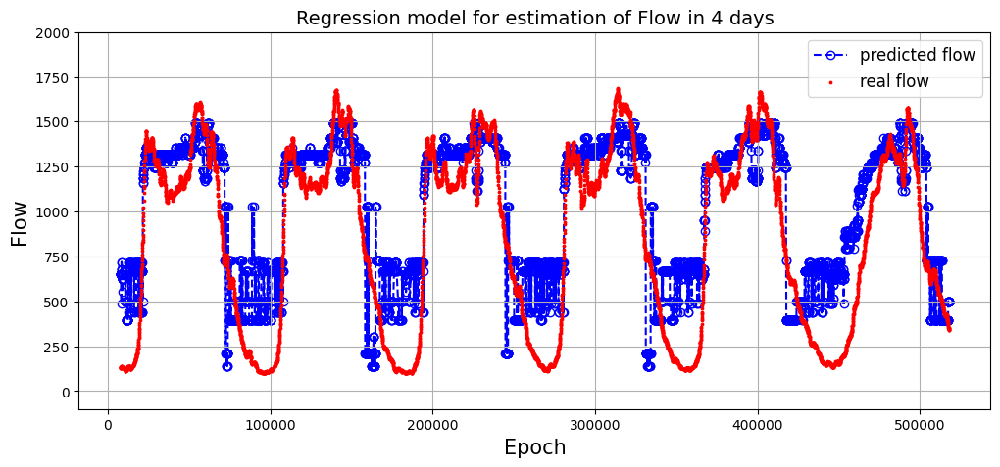

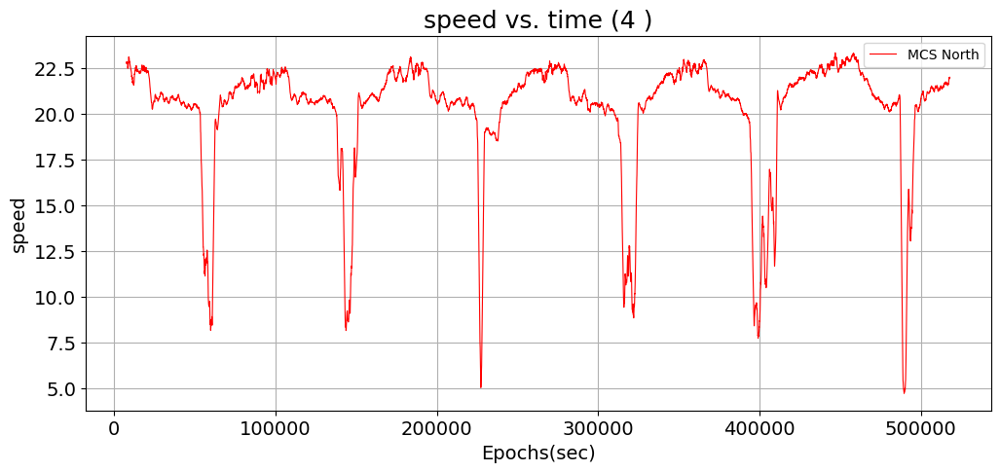

In [ ]:
STARTDATE = 1
ENDDATE = 7
DELTA_STEP = 0
dataFrame = combinedNorth_2w
# Plot real and predicted flow vs. X_features (speed_inrix)
plt.figure(figsize=(11, 6))
plt.ylim(bottom = 0, top=2000)
# plt.xlim(left = 5, right=30)
plotResult(X_features_upstream[idx(dataFrame, STARTDATE): idx(dataFrame, ENDDATE) + DELTA_STEP, 0], 
           Y_upstream[idx(dataFrame, STARTDATE): idx(dataFrame, ENDDATE) + DELTA_STEP], 
           Y_predict_upstream[idx(dataFrame, STARTDATE) : idx(dataFrame, ENDDATE) + DELTA_STEP], 
           None,  None, None, '6 days', 'MCS speed', 'Flow')

# plotResult(X_features_mcs_denormalized[:, 0], Y_label, Y_predict, 
#            None,  None, None, '3 weeks', 'MCS speed', 'Flow')


# Plot real and predicted flow vs. Epoch 
plt.figure(figsize=(12, 5))
plt.ylim(bottom = -100, top = 2000)
plotResult(X_epoch[idx(dataFrame, STARTDATE):idx(dataFrame, ENDDATE) + DELTA_STEP], 
           Y_upstream[idx(dataFrame, STARTDATE):idx(dataFrame, ENDDATE) + DELTA_STEP], 
           Y_predict_upstream[idx(dataFrame, STARTDATE):idx(dataFrame, ENDDATE) + DELTA_STEP], 
           None, None, None, '4 days', 'Epoch', 'Flow', 'p')

# Plot corresponding mcs speed 
plt.figure(figsize=(12, 5))
plotAttr(4, dataFrame.iloc[idx(dataFrame, STARTDATE):idx(dataFrame, ENDDATE) + DELTA_STEP], 'speed', 'MCS North')



## 6.2 Decision tree model: INRIX -> MCS flow (Speed + Travel Time + daytime * 2 links)



In [62]:
# prepare the features [MCS speed] and label [flow]
# Notice: Y_flow was already defined in previous section 3.
# X_epoch was already defined
X_inrix_speed_travelTime_neighbor = combinedSouth_2w[['speed_inrix', 'travel_time_secs', 'speed_inrix_up','travel_time_secs_up', 'daytime']].values

X_features = X_inrix_speed_travelTime_neighbor
Y_label = Y_flow

print(X_features.shape)

# split the train and test datasets
X_train, X_test, Y_train, Y_test = train_test_split(X_features, Y_label, test_size=0.2, random_state=1)

(28387, 5)


In [63]:
# temporarily tune the max_depth (hyperparameters) 
# Notice: should use cross-validation instead, here only for quick result
split = list(range(1, 15))
print(split)
result = quickSplitTuning(DecisionTreeRegressor, X_train, Y_train, X_test, Y_test, split)
print(result)

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]
    split  Train_R2   Test_R2
0       1  0.699785  0.703649
1       2  0.793517  0.801816
2       3  0.833947  0.843024
3       4  0.848980  0.854470
4       5  0.858183  0.862024
5       6  0.866711  0.866721
6       7  0.872035  0.868457
7       8  0.877688  0.871233
8       9  0.884913  0.872022
9      10  0.892698  0.872610
10     11  0.901451  0.871552
11     12  0.910959  0.868797
12     13  0.920110  0.864829
13     14  0.929146  0.861782


In [ ]:
# Hyperparameter tuning: depth of tree
# by using training set
DTRegressor = DecisionTreeRegressor()
print(DTRegressor.get_params)

# param_grid = {'max_depth': [int(x) for x in np.arange(10, 16, step=1)], 
#               'min_samples_leaf': [int(x) for x in np.arange(10,100 ,step = 10)]     
#               }

param_grid = {'max_depth': [11], 
              'min_samples_leaf': [int(x) for x in np.arange(8, 25, step=1)]}

              
grid_search = GridSearchCV(DTRegressor, param_grid, cv=7, scoring='r2', n_jobs=-1)
grid_search.fit(X_train, Y_train)

grid_search.best_params_

<bound method BaseEstimator.get_params of DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')>


{'max_depth': 11, 'min_samples_leaf': 11}

In [ ]:
cvres = grid_search.cv_results_
for mean_score, params in zip(cvres["mean_test_score"], cvres['params']):
  print(mean_score, params)

0.871635390414788 {'max_depth': 11, 'min_samples_leaf': 8}
0.8723038843317602 {'max_depth': 11, 'min_samples_leaf': 9}
0.8724359908347462 {'max_depth': 11, 'min_samples_leaf': 10}
0.8727127581145488 {'max_depth': 11, 'min_samples_leaf': 11}
0.8727738562701225 {'max_depth': 11, 'min_samples_leaf': 12}
0.8725535533258072 {'max_depth': 11, 'min_samples_leaf': 13}
0.8730459143664449 {'max_depth': 11, 'min_samples_leaf': 14}
0.8722260989802094 {'max_depth': 11, 'min_samples_leaf': 15}
0.8726463048489167 {'max_depth': 11, 'min_samples_leaf': 16}
0.8726926112916616 {'max_depth': 11, 'min_samples_leaf': 17}
0.8720884750660639 {'max_depth': 11, 'min_samples_leaf': 18}
0.871981229538763 {'max_depth': 11, 'min_samples_leaf': 19}
0.8717634722979296 {'max_depth': 11, 'min_samples_leaf': 20}
0.8715676319671425 {'max_depth': 11, 'min_samples_leaf': 21}
0.8716702592714969 {'max_depth': 11, 'min_samples_leaf': 22}
0.8715548153104862 {'max_depth': 11, 'min_samples_leaf': 23}
0.8716288127089865 {'max_dep

In [64]:
# train the model with train dataset and check the accuracy
DT_MAXDEPTH = 11
DT_MSL = 15
DTRegressor = DecisionTreeRegressor(max_depth = DT_MAXDEPTH, min_samples_leaf= DT_MSL, random_state=0)
DTRegressor.fit(X_train, Y_train)

# Evaluate Performance of training set
Y_predict_train = DTRegressor.predict(X_train)
scores = cross_val_score(DTRegressor, X_train, Y_train, scoring='r2', cv=10)
display_scores(scores)
print()
print("Root Mean Square Error: ", mean_squared_error(Y_train, Y_predict_train, squared=False))
print("R2 Score for training set: ", DTRegressor.score(X_train, Y_train))

# Evaluate Performance of testing set
Y_predict_test = DTRegressor.predict(X_test)
print("Root Mean Square Error: ", mean_squared_error(Y_test, Y_predict_test, squared=False))
print("R2 Score for testing set: ", r2_score(Y_test, Y_predict_test))


Scores: [0.88700241 0.86842217 0.86192859 0.86426095 0.86702294 0.86714295
 0.8685658  0.86663691 0.86361199 0.87084847]
Mean: 0.8685443178837973
Standard deviation: 0.006636153877089294

Root Mean Square Error:  162.62783910227498
R2 Score for training set:  0.8899077024901682
Root Mean Square Error:  175.41220070713203
R2 Score for testing set:  0.8741707621457715


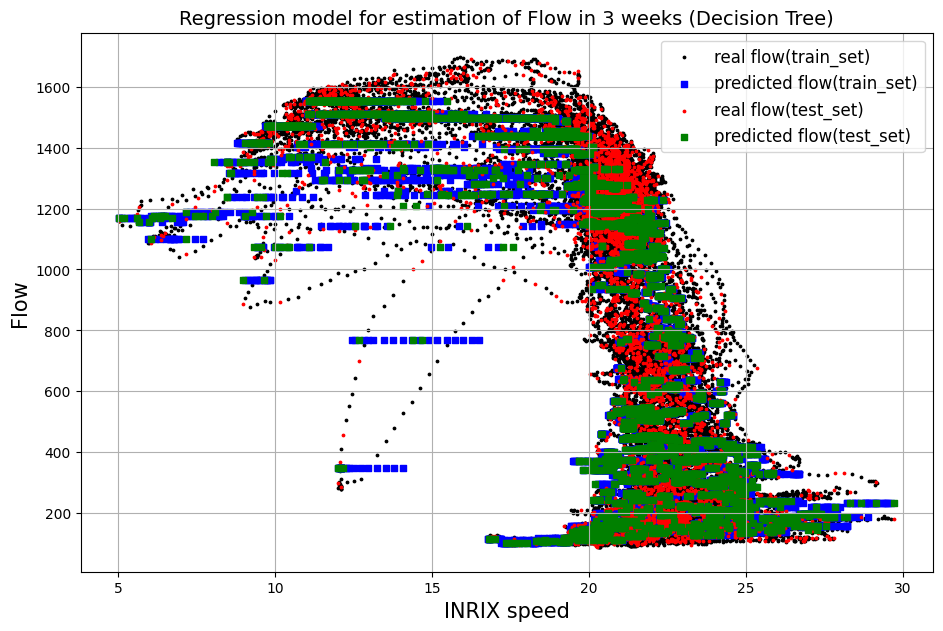

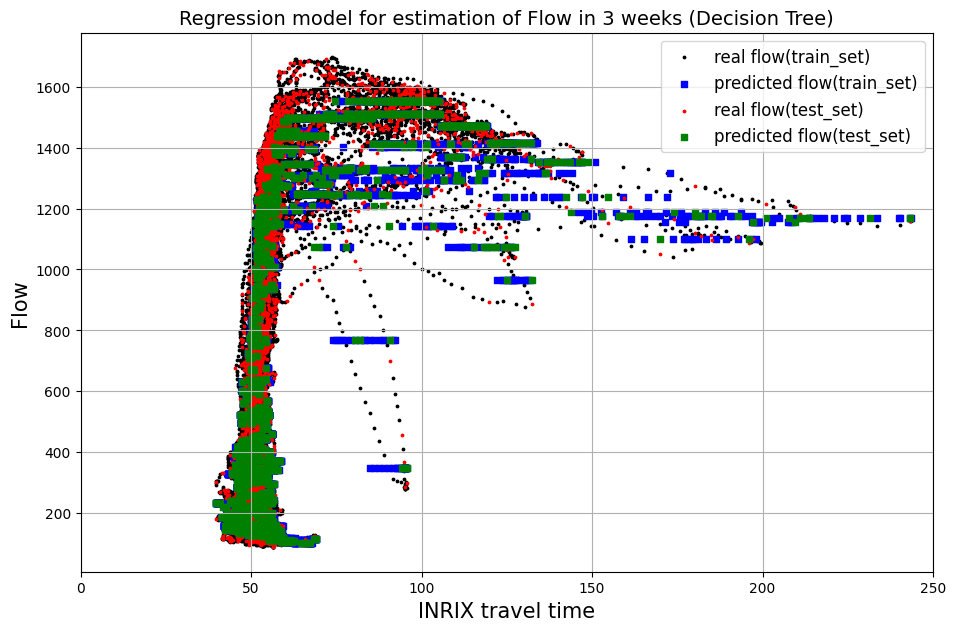

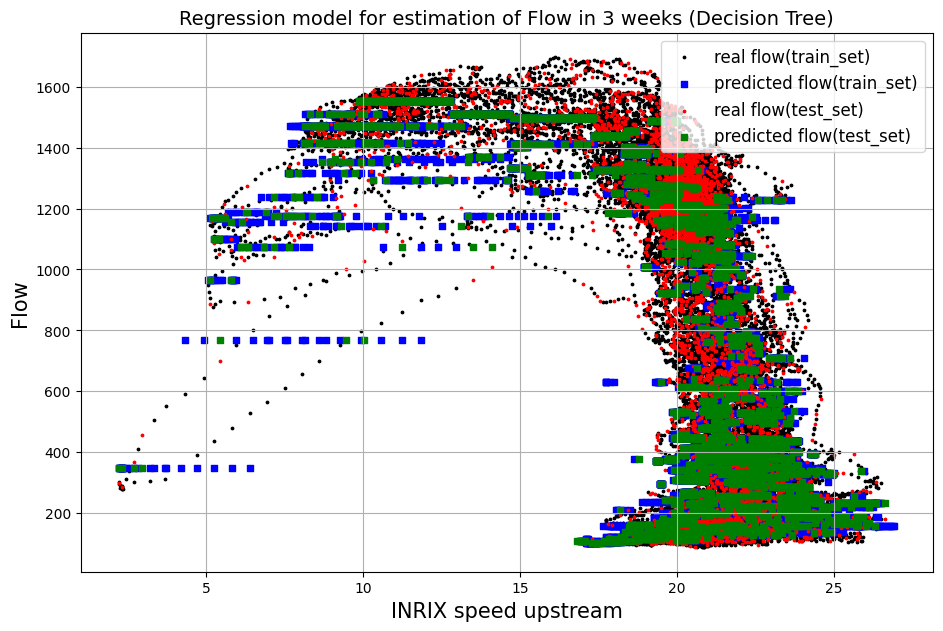

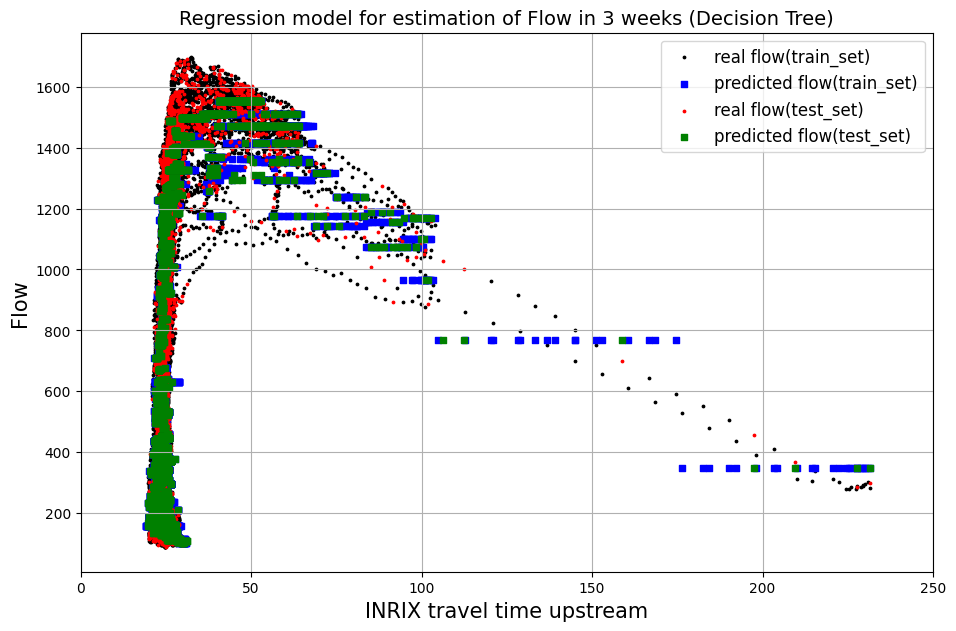

In [65]:
# Plot real and predicted 'flow' vs 'speed current' 
plt.figure(figsize=(11, 7))
# plt.ylim(top = 2000)
plotResult(X_train[:, 0], Y_train, Y_predict_train, X_test[:, 0], Y_test, Y_predict_test, '3 weeks (Decision Tree)', 'INRIX speed', 'Flow')

# Plot real and predicted 'flow' vs 'speed current' 
plt.figure(figsize=(11, 7))
plt.xlim(right = 250)
plotResult(X_train[:, 1], Y_train, Y_predict_train, X_test[:, 1], Y_test, Y_predict_test, '3 weeks (Decision Tree)', 'INRIX travel time', 'Flow')

# Plot real and predicted 'flow' vs 'speed upstream' 
plt.figure(figsize=(11, 7))
# plt.ylim(top = 2000)
plotResult(X_train[:, 2], Y_train, Y_predict_train, X_test[:, 2], Y_test, Y_predict_test, '3 weeks (Decision Tree)', 'INRIX speed upstream', 'Flow')

# Plot real and predicted 'flow' vs 'speed upstream' 
plt.figure(figsize=(11, 7))
plt.xlim(right = 250)
plotResult(X_train[:, 3], Y_train, Y_predict_train, X_test[:, 3], Y_test, Y_predict_test, '3 weeks (Decision Tree)', 'INRIX travel time upstream', 'Flow')

In [ ]:
# Use all data to predict the flow for plotting
Y_predict = DTRegressor.predict(X_features)

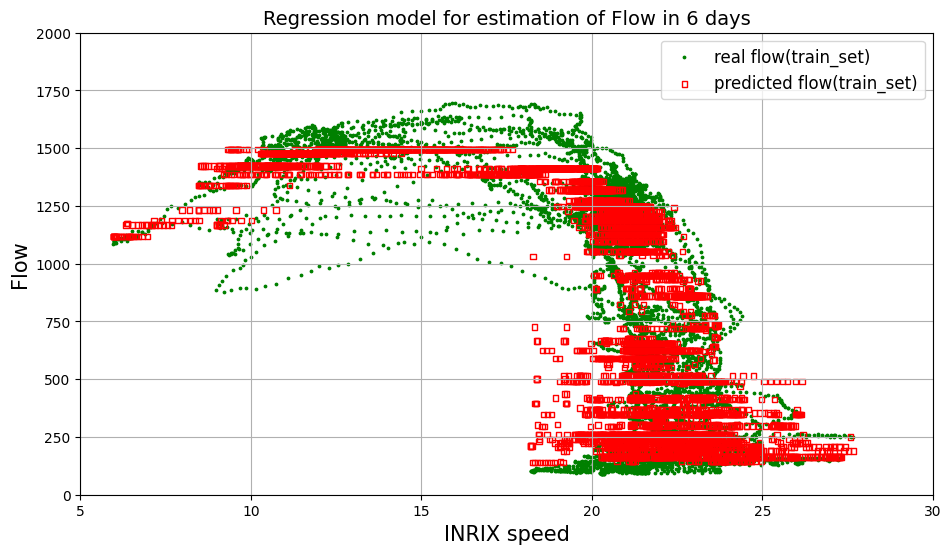

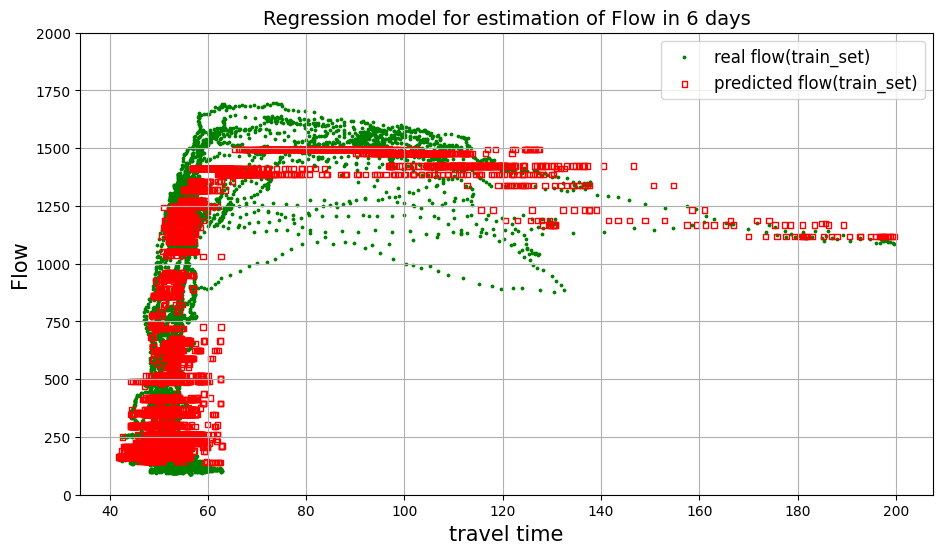

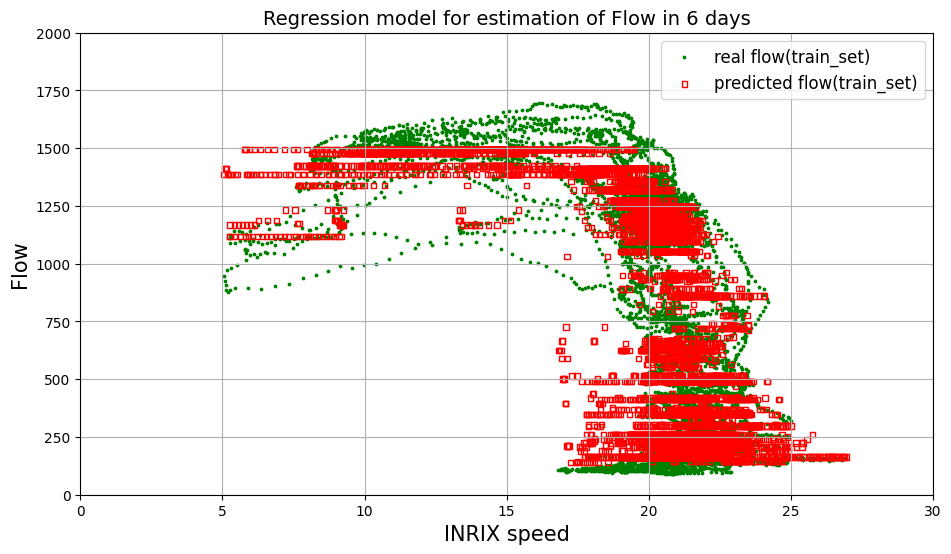

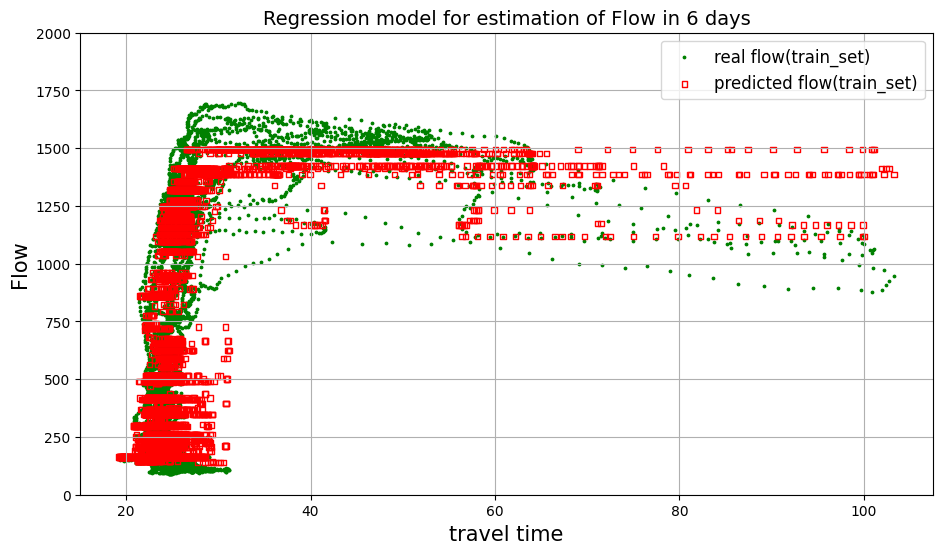

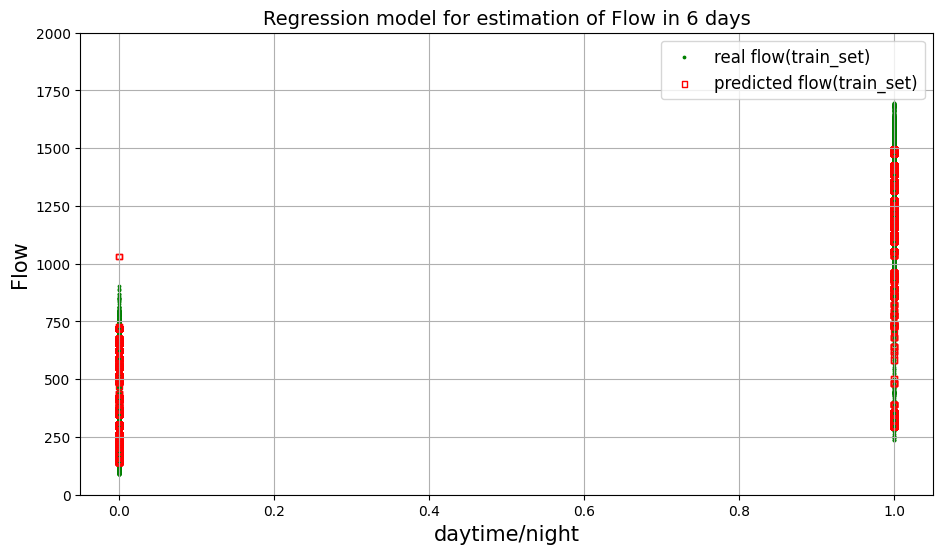

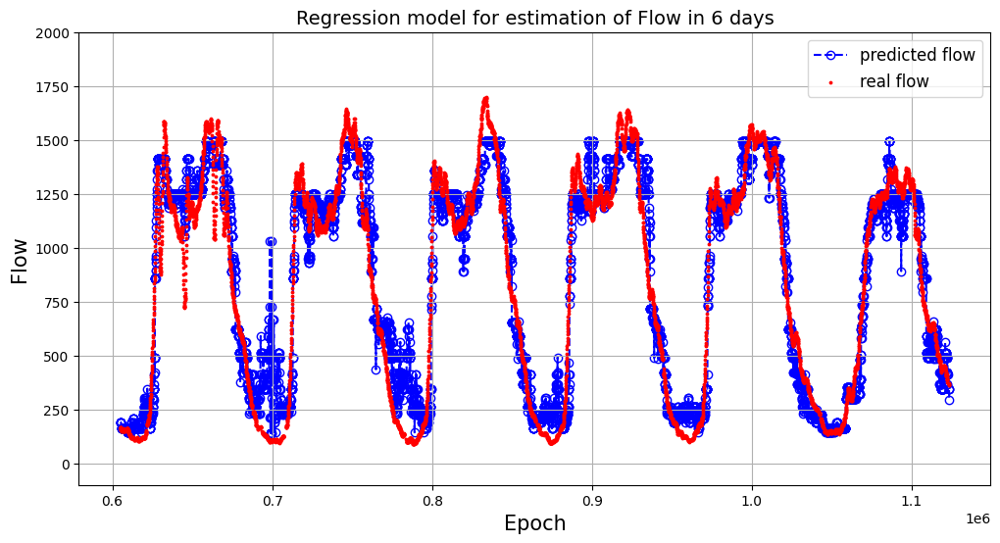

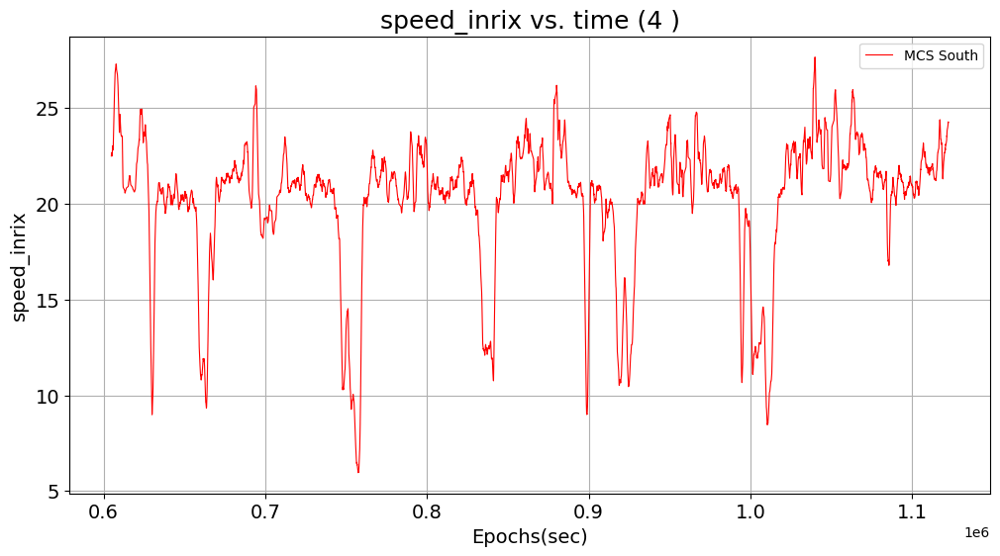

In [66]:
STARTDATE = 8
ENDDATE = 14
DELTA_STEP = 0

# Plot real and predicted flow vs. X_features (speed_inrix current)
plt.figure(figsize=(11, 6))
plt.ylim(bottom = 0, top=2000)
plt.xlim(left = 5, right=30)
plotResult(X_features[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP, 0], 
           Y_label[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           Y_predict[idx(combinedSouth_2w, STARTDATE) : idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           None,  None, None, '6 days', 'INRIX speed', 'Flow')



# Plot real and predicted flow vs. X_features (travel_inrix upstream)
plt.figure(figsize=(11, 6))
plt.ylim(bottom = 0, top=2000)
# plt.xlim(left = 5, right=30)
plotResult(X_features[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP, 1], 
           Y_label[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           Y_predict[idx(combinedSouth_2w, STARTDATE) : idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           None,  None, None, '6 days', 'travel time', 'Flow')

# Plot real and predicted flow vs. X_features (speed_inrix upstream)
plt.figure(figsize=(11, 6))
plt.ylim(bottom = 0, top=2000)
plt.xlim(left = 0, right=30)
plotResult(X_features[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP, 2], 
           Y_label[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           Y_predict[idx(combinedSouth_2w, STARTDATE) : idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           None,  None, None, '6 days', 'INRIX speed', 'Flow')



# Plot real and predicted flow vs. X_features (travel_inrix)
plt.figure(figsize=(11, 6))
plt.ylim(bottom = 0, top=2000)
# plt.xlim(left = 5, right=30)
plotResult(X_features[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP, 3], 
           Y_label[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           Y_predict[idx(combinedSouth_2w, STARTDATE) : idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           None,  None, None, '6 days', 'travel time', 'Flow')

# Plot real and predicted flow vs. X_features (temporal factor)
plt.figure(figsize=(11, 6))
plt.ylim(bottom = 0, top=2000)
plotResult(X_features[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP, 4], 
           Y_label[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           Y_predict[idx(combinedSouth_2w, STARTDATE) : idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           None,  None, None, '6 days', 'daytime/night', 'Flow')


# Plot real and predicted flow vs. Epoch 
plt.figure(figsize=(12, 6))
plt.ylim(bottom = -100, top = 2000)
plotResult(X_epoch[idx(combinedSouth_2w, STARTDATE):idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           Y_label[idx(combinedSouth_2w, STARTDATE):idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           Y_predict[idx(combinedSouth_2w, STARTDATE):idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           None, None, None, '6 days', 'Epoch', 'Flow', 'p')

# Plot corresponding mcs speed 
plt.figure(figsize=(12, 6))
plotAttr(4, combinedSouth_2w.iloc[idx(combinedSouth_2w, STARTDATE):idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 'speed_inrix', 'MCS South')



In [67]:
# test model on future datasets (22th to 27th):
combinedFuture = combinedSouth_shifted.iloc[idx(combinedSouth_shifted, 22): idx(combinedSouth_shifted, 27)]
X_future = combinedFuture[['speed_inrix', 'travel_time_secs', 'speed_inrix_up', 'travel_time_secs_up', 'daytime']].values
Y_future = combinedFuture[['flow']].values
print(X_future.shape)
Y_future_predict = DTRegressor.predict(X_future)
print("Root Mean Square Error: ", mean_squared_error(Y_future, Y_future_predict, squared=False))
print("R2 Score: ", r2_score(Y_future, Y_future_predict))

(6637, 5)
Root Mean Square Error:  177.2628596912599
R2 Score:  0.8791125239896865


## 6.3 Decision tree model: INRIX -> MCS flow (Speed + Travel Time + Daytime * single link)



In [ ]:
# prepare the features [MCS speed] and label [flow]
# Notice: Y_flow was already defined in previous section 3.
# X_epoch was already defined
X_inrix_speed_travelTime = combinedSouth_2w[['speed_inrix', 'travel_time_secs', 'daytime']].values

X_features = X_inrix_speed_travelTime
Y_label = Y_flow

print(X_features.shape)

# split the train and test datasets
X_train, X_test, Y_train, Y_test = train_test_split(X_features, Y_label, test_size=0.2, random_state=1)

(28387, 3)


In [ ]:
# train the model with train dataset and check the accuracy
# parameters were tuned on previous notebooks
DT_MAXDEPTH = 15
DT_MSL = 50
DTRegressor = DecisionTreeRegressor(max_depth = DT_MAXDEPTH, min_samples_leaf= DT_MSL, random_state=0)
DTRegressor.fit(X_train, Y_train)

# Evaluate Performance of training set
Y_predict_train = DTRegressor.predict(X_train)
scores = cross_val_score(DTRegressor, X_train, Y_train, scoring='r2', cv=10)
display_scores(scores)
print()
print("Root Mean Square Error: ", mean_squared_error(Y_train, Y_predict_train, squared=False))
print("R2 Score for training set: ", DTRegressor.score(X_train, Y_train))
print()

# Evaluate Performance of testing set
Y_predict_test = DTRegressor.predict(X_test)
print("Root Mean Square Error: ", mean_squared_error(Y_test, Y_predict_test, squared=False))
print("R2 Score for testing set: ", r2_score(Y_test, Y_predict_test))


Scores: [0.85622487 0.85272436 0.84811339 0.84683487 0.84910351 0.8498
 0.85334265 0.84966056 0.84798566 0.85476781]
Mean: 0.8508557701582629
Standard deviation: 0.0030223650348097132

Root Mean Square Error:  180.61023468504942
R2 Score for training set:  0.8642149782544062

Root Mean Square Error:  185.4150134958782
R2 Score for testing set:  0.8594108627375896


In [ ]:
# Use all data to predict the flow (for plot diagram)
Y_predict = DTRegressor.predict(X_features)

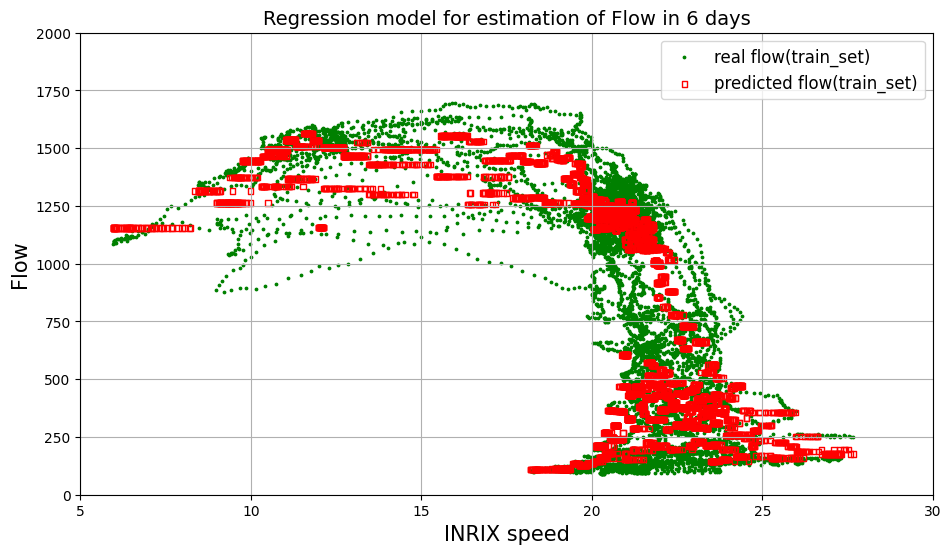

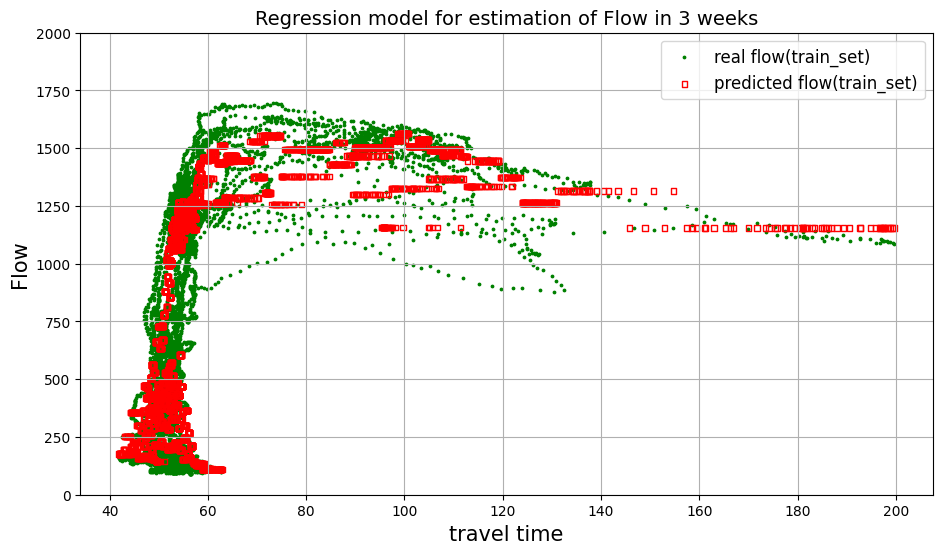

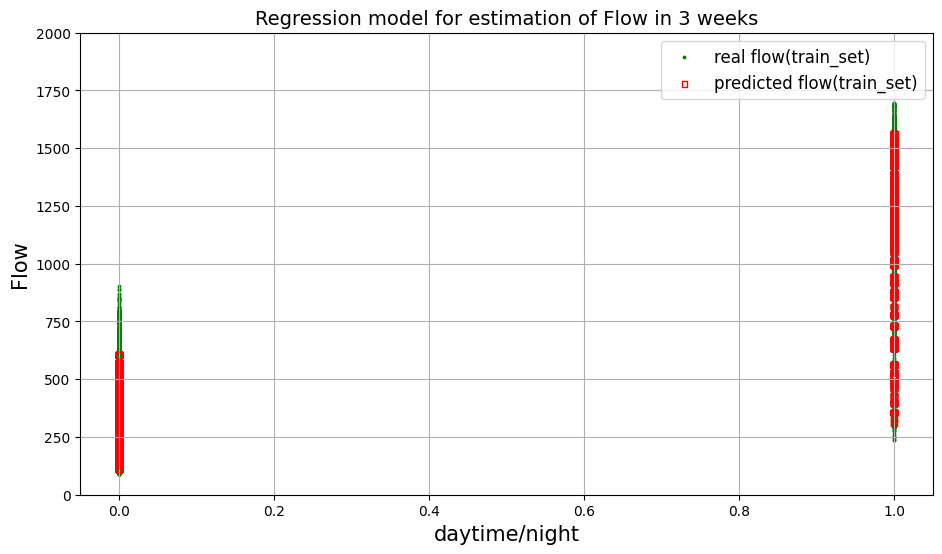

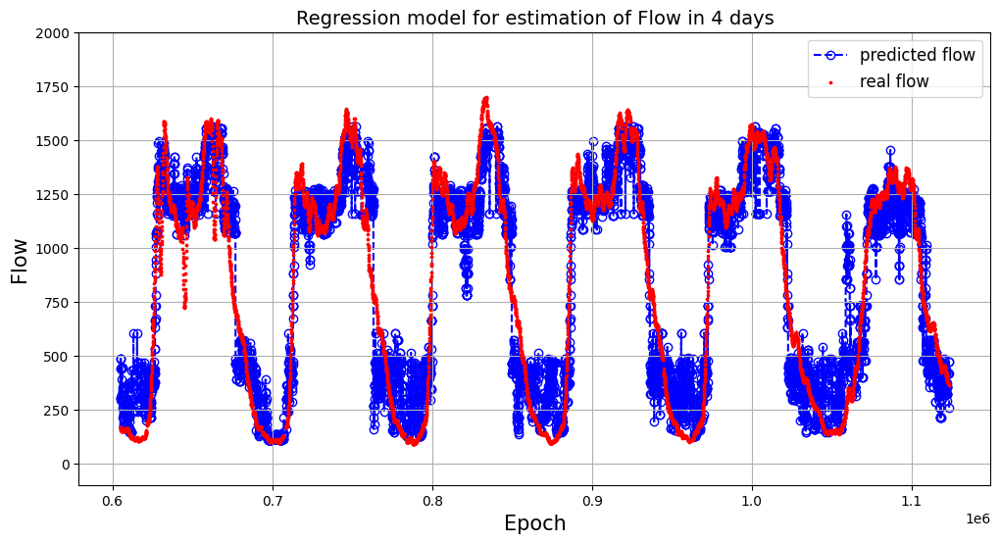

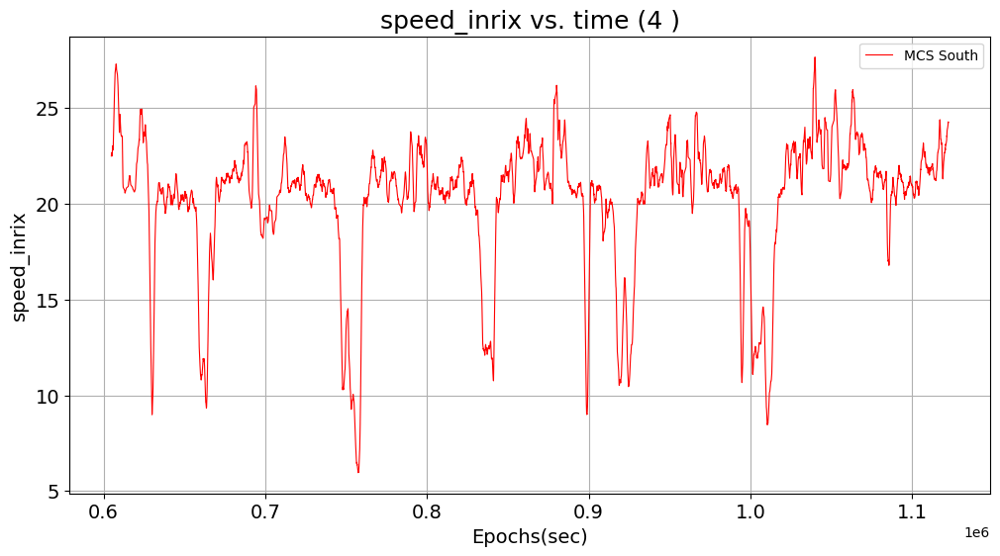

In [ ]:
STARTDATE = 8
ENDDATE = 14
DELTA_STEP = 0

# Plot real and predicted flow vs. X_features (speed_inrix current)
plt.figure(figsize=(11, 6))
plt.ylim(bottom = 0, top=2000)
plt.xlim(left = 5, right=30)
plotResult(X_features[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP, 0], 
           Y_label[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           Y_predict[idx(combinedSouth_2w, STARTDATE) : idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           None,  None, None, '6 days', 'INRIX speed', 'Flow')



# Plot real and predicted flow vs. X_features (travel_inrix)
plt.figure(figsize=(11, 6))
plt.ylim(bottom = 0, top=2000)
# plt.xlim(left = 5, right=30)
plotResult(X_features[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP, 1], 
           Y_label[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           Y_predict[idx(combinedSouth_2w, STARTDATE) : idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           None,  None, None, '3 weeks', 'travel time', 'Flow')


# Plot real and predicted flow vs. X_features (temporal factor)
plt.figure(figsize=(11, 6))
plt.ylim(bottom = 0, top=2000)
plotResult(X_features[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP, 2], 
           Y_label[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           Y_predict[idx(combinedSouth_2w, STARTDATE) : idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           None,  None, None, '3 weeks', 'daytime/night', 'Flow')


# Plot real and predicted flow vs. Epoch 
plt.figure(figsize=(12, 6))
plt.ylim(bottom = -100, top = 2000)
plotResult(X_epoch[idx(combinedSouth_2w, STARTDATE):idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           Y_label[idx(combinedSouth_2w, STARTDATE):idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           Y_predict[idx(combinedSouth_2w, STARTDATE):idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           None, None, None, '4 days', 'Epoch', 'Flow', 'p')

# Plot corresponding mcs speed 
plt.figure(figsize=(12, 6))
plotAttr(4, combinedSouth_2w.iloc[idx(combinedSouth_2w, STARTDATE):idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 'speed_inrix', 'MCS South')



#### Test the Decision Tree model on the future data (totally unseen) from the same link:

In [ ]:
# test model on future datasets (22th to 27th):
combinedFuture = combinedSouth_shifted.iloc[idx(combinedSouth_shifted, 22): idx(combinedSouth_shifted, 28)]
X_future = combinedFuture[['speed_inrix', 'travel_time_secs', 'daytime']].values
Y_future = combinedFuture[['flow']].values
print(X_future.shape)
Y_future_predict = DTRegressor.predict(X_future)
print("Root Mean Square Error: ", mean_squared_error(Y_future, Y_future_predict, squared=False))
print("R2 Score: ", r2_score(Y_future, Y_future_predict))

(8007, 3)
Root Mean Square Error:  190.48573449403986
R2 Score:  0.8584253915171645


#### Test the Decision Tree model on the adjacent(upstream) link:

In [ ]:
# test model on adjacent(upstream) test datasets:
X_features_upstream = combinedNorth_2w[['speed_inrix', 'travel_time_secs', 'daytime']].values
Y_upstream = combinedNorth_2w[['flow']].values
X_epoch = combinedNorth_2w['Epoch_mcs'].values


Y_predict_upstream = DTRegressor.predict(X_features_upstream)
print("Root Mean Square Error: ", mean_squared_error(Y_upstream, Y_predict_upstream, squared=False))
print("R2 Score: ", r2_score(Y_upstream, Y_predict_upstream))

Root Mean Square Error:  511.87282144629756
R2 Score:  -0.08657929842369749


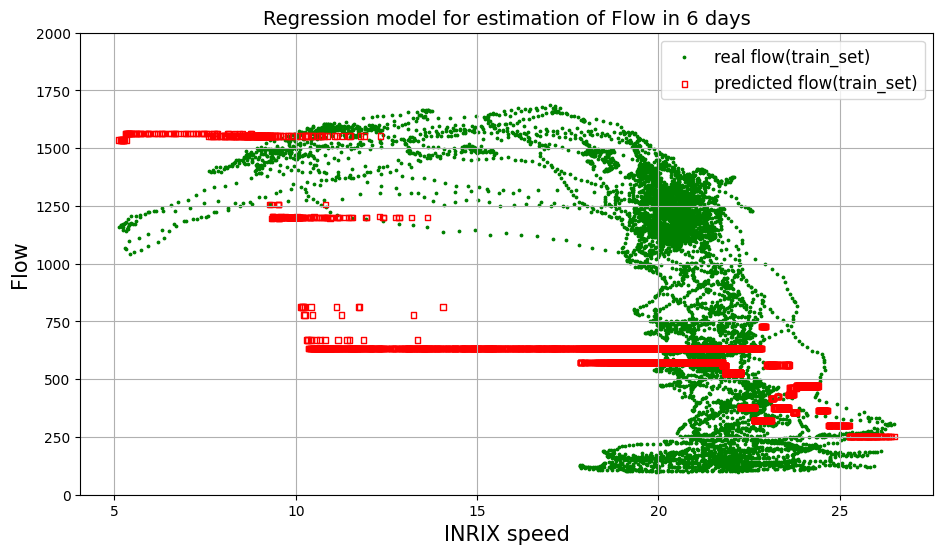

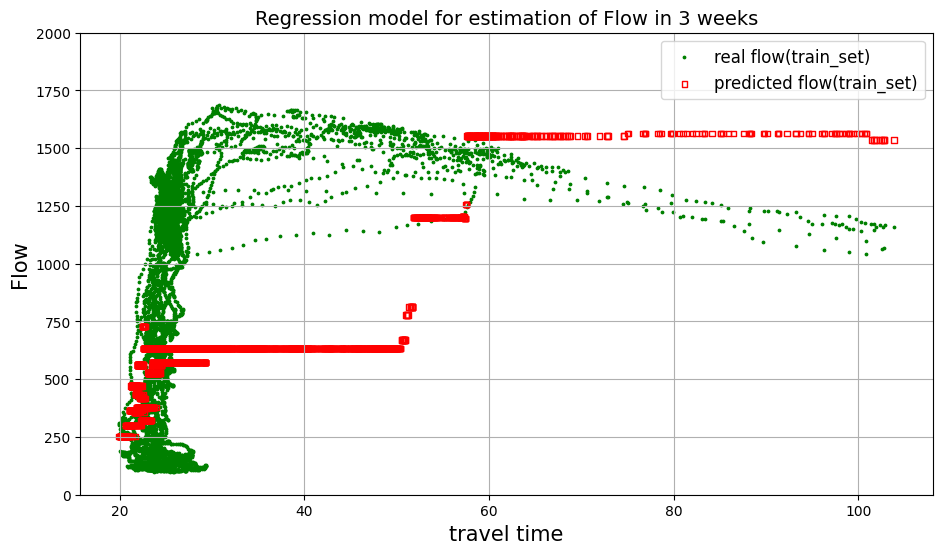

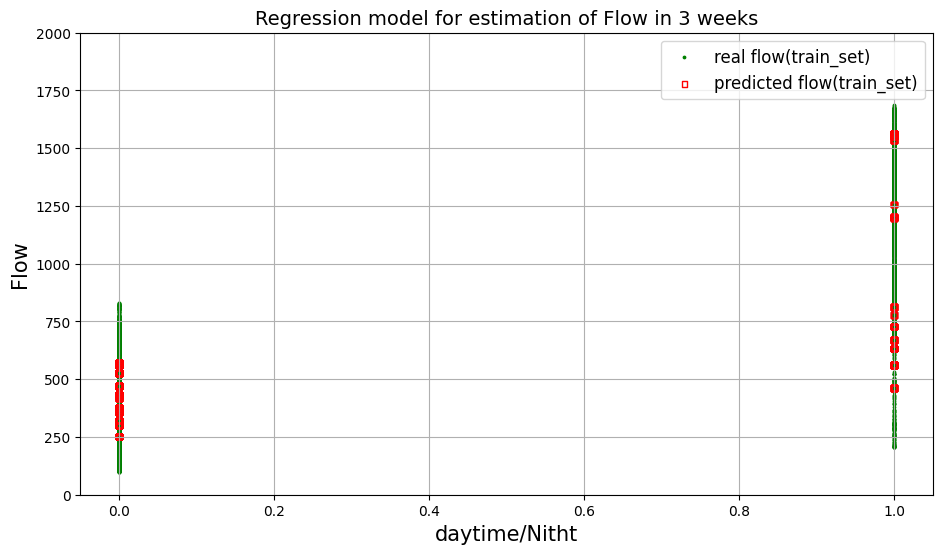

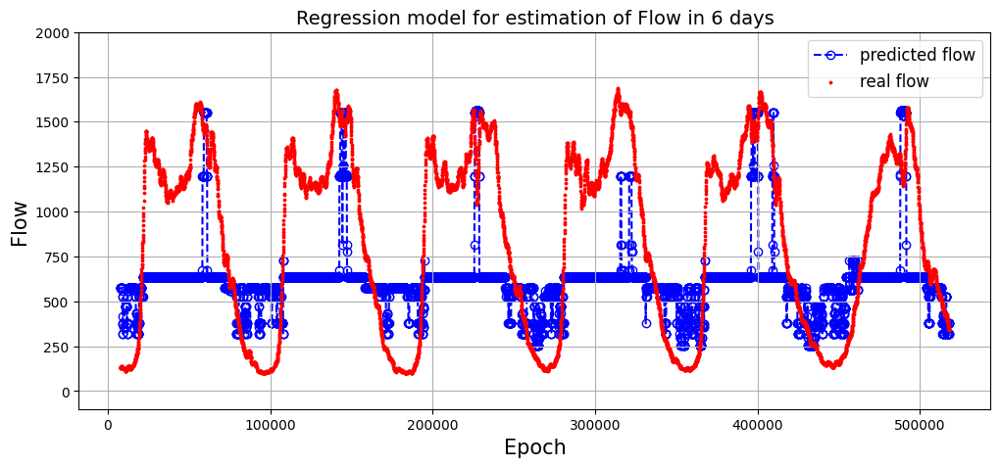

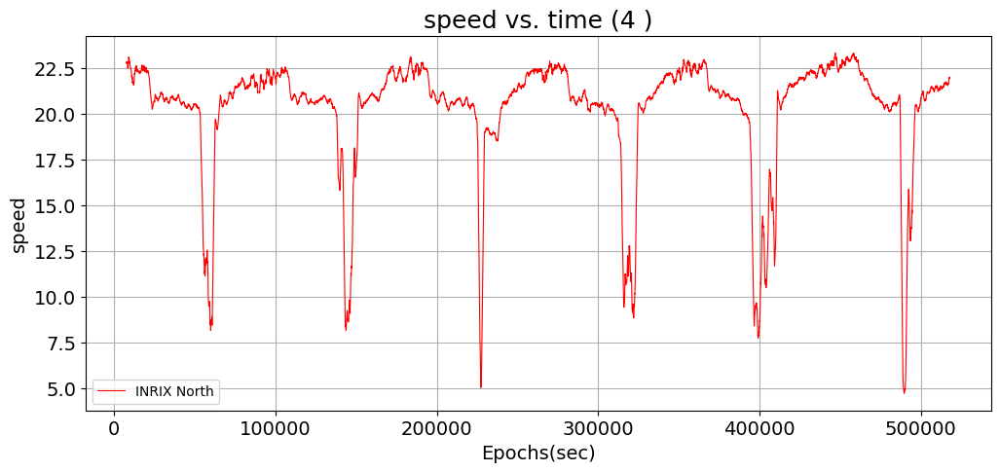

In [ ]:
STARTDATE = 1
ENDDATE = 7
DELTA_STEP = 0
dataFrame = combinedNorth_2w
# Plot real and predicted flow vs. X_features (speed_inrix)
plt.figure(figsize=(11, 6))
plt.ylim(bottom = 0, top=2000)
# plt.xlim(left = 5, right=30)
plotResult(X_features_upstream[idx(dataFrame, STARTDATE): idx(dataFrame, ENDDATE) + DELTA_STEP, 0], 
           Y_upstream[idx(dataFrame, STARTDATE): idx(dataFrame, ENDDATE) + DELTA_STEP], 
           Y_predict_upstream[idx(dataFrame, STARTDATE) : idx(dataFrame, ENDDATE) + DELTA_STEP], 
           None,  None, None, '6 days', 'INRIX speed', 'Flow')

# Plot real and predicted flow vs. X_features (travel_inrix)
plt.figure(figsize=(11, 6))
plt.ylim(bottom = 0, top=2000)
# plt.xlim(left = 5, right=30)
plotResult(X_features_upstream[idx(dataFrame, STARTDATE): idx(dataFrame, ENDDATE) + DELTA_STEP, 1], 
           Y_upstream[idx(dataFrame, STARTDATE): idx(dataFrame, ENDDATE) + DELTA_STEP], 
           Y_predict_upstream[idx(dataFrame, STARTDATE) : idx(dataFrame, ENDDATE) + DELTA_STEP], 
           None,  None, None, '3 weeks', 'travel time', 'Flow')


# Plot real and predicted flow vs. X_features (temporal factor)
plt.figure(figsize=(11, 6))
plt.ylim(bottom = 0, top=2000)
# plt.xlim(left = 5, right=30)
plotResult(X_features_upstream[idx(dataFrame, STARTDATE): idx(dataFrame, ENDDATE) + DELTA_STEP, 2], 
           Y_upstream[idx(dataFrame, STARTDATE): idx(dataFrame, ENDDATE) + DELTA_STEP], 
           Y_predict_upstream[idx(dataFrame, STARTDATE) : idx(dataFrame, ENDDATE) + DELTA_STEP], 
           None,  None, None, '3 weeks', 'daytime/Nitht', 'Flow')


# Plot real and predicted flow vs. Epoch 
plt.figure(figsize=(12, 5))
plt.ylim(bottom = -100, top = 2000)
plotResult(X_epoch[idx(dataFrame, STARTDATE):idx(dataFrame, ENDDATE) + DELTA_STEP], 
           Y_upstream[idx(dataFrame, STARTDATE):idx(dataFrame, ENDDATE) + DELTA_STEP], 
           Y_predict_upstream[idx(dataFrame, STARTDATE):idx(dataFrame, ENDDATE) + DELTA_STEP], 
           None, None, None, '6 days', 'Epoch', 'Flow', 'p')

# Plot corresponding mcs speed 
plt.figure(figsize=(12, 5))
plotAttr(4, dataFrame.iloc[idx(dataFrame, STARTDATE):idx(dataFrame, ENDDATE) + DELTA_STEP], 'speed', 'INRIX North')



# 7. Random Forest


*   Random Forest for mapping MCS speed -> MCS flow
*   Random Forest for mapping INRIX speed -> MCS flow
*   Cross Validation for tunig hyperparameters( depth & tree number) in random forest tree




## 7.1 Random Forest tree for mapping MCS speed to MCS flow

In [ ]:
# prepare the features [MCS speed] and label [flow]
# Notice: Y_flow was already defined in previous section 3.
# X_epoch was already defined
# X_mcs_speed was already assigned at 4.1 
X_features = X_mcs_speed_temp
Y_label = Y_flow

print(X_features.shape)

# split the train and test datasets
X_train, X_test, Y_train, Y_test = train_test_split(X_features, Y_label, test_size=0.2, random_state=1)


(28387, 2)


In [ ]:
## Hyperparameter tuning: random search
RFRegressor = RandomForestRegressor()
print(RFRegressor.get_params)

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_depth': max_depth,
               'min_samples_leaf': min_samples_leaf,
               }
print(random_grid)


# search across 100 different combinations, and use all available cores
# rf_random = RandomizedSearchCV(estimator = RFRegressor, param_distributions = random_grid, n_iter = 50, cv = 3, verbose=2, random_state=42, n_jobs = -1, scoring='r2')
# rf_random.fit(X_train, Y_train)

# rf_random.best_params_

<bound method BaseEstimator.get_params of RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)>


NameError: ignored

In [ ]:
## Hyperparameter tuning: random search
RFRegressor = RandomForestRegressor()
print(RFRegressor.get_params)

# Hyperparameter tuning: grid search
param_grid = {'n_estimators': [int(x) for x in np.arange(50, 250, 20)],
              'max_depth': [7],
              'min_samples_leaf': [23]} 
              
grid_search = GridSearchCV(estimator = RFRegressor, param_grid = param_grid, cv = 3, verbose=2, n_jobs = -1, scoring='r2')
grid_search.fit(X_train, Y_train)

grid_search.best_params_

<bound method BaseEstimator.get_params of RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)>
Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   34.9s finished


{'max_depth': 7, 'min_samples_leaf': 23, 'n_estimators': 210}

In [ ]:
cvres = grid_search.cv_results_
for mean_score, params in zip(cvres["mean_test_score"], cvres['params']):
  print(mean_score, params)

AttributeError: ignored

In [ ]:
# fit the random forest model with tuned hyperparameters
RF_MAXDEPTH = 7
RF_NTREE = 210
RF_MSL = 11

RFRegressor = RandomForestRegressor(n_estimators= RF_NTREE, max_depth= RF_MAXDEPTH, min_samples_leaf=RF_MSL, n_jobs=-1)

# Use 10 folds cross-validation to fit and validate the model by training set
scores = cross_val_score(RFRegressor, X_train, Y_train, scoring='neg_root_mean_squared_error', cv=10)
display_scores(scores)

# fit the model on whole training set
# evaluate Performance of model (fitting result) on training set
RFRegressor.fit(X_train, Y_train)
Y_predict_train = RFRegressor.predict(X_train)
print('\nfitting result on whole training set:')
print("Root Mean Square Error: ", mean_squared_error(Y_train, Y_predict_train, squared=False))
print("R2 Score for fitting result on training set: ", RFRegressor.score(X_train, Y_train))

# Evaluate Performance of the fitted model on testing set
Y_predict_test = RFRegressor.predict(X_test)
print('\nprediction result on testing set:')
print("Root Mean Square Error: ", mean_squared_error(Y_test, Y_predict_test, squared=False))
print("R2 Score on testing set: ", r2_score(Y_test, Y_predict_test))

Scores: [-124.77989091 -119.86532292 -126.94524868 -126.35173985 -130.02394698
 -127.47199375 -125.50758695 -126.61136834 -121.26094814 -125.23143639]
Mean: -125.40494829097949
Standard deviation: 2.8039924923023576

fitting result on whole training set:
Root Mean Square Error:  122.44731470310455
R2 Score for fitting result on training set:  0.9423134497466163

prediction result on testing set:
Root Mean Square Error:  126.3670191441201
R2 Score on testing set:  0.939725276688749


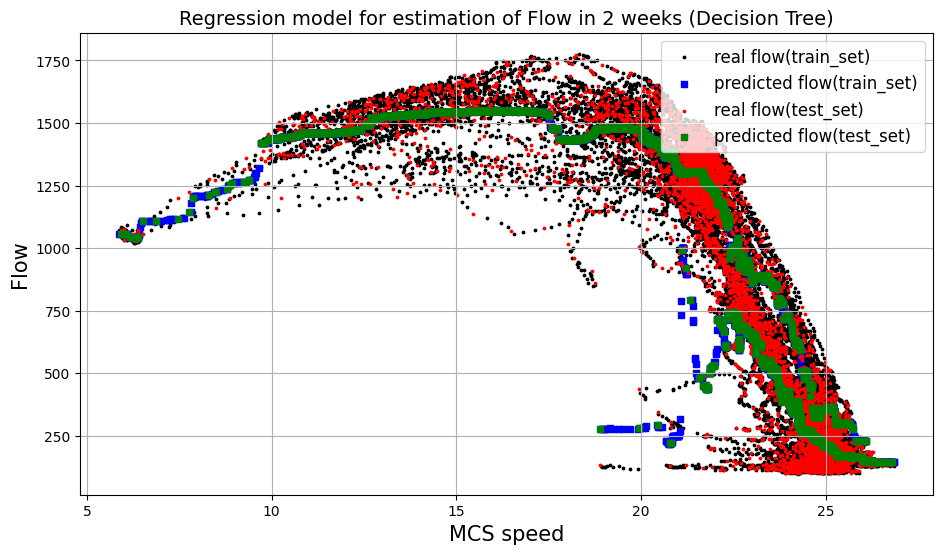

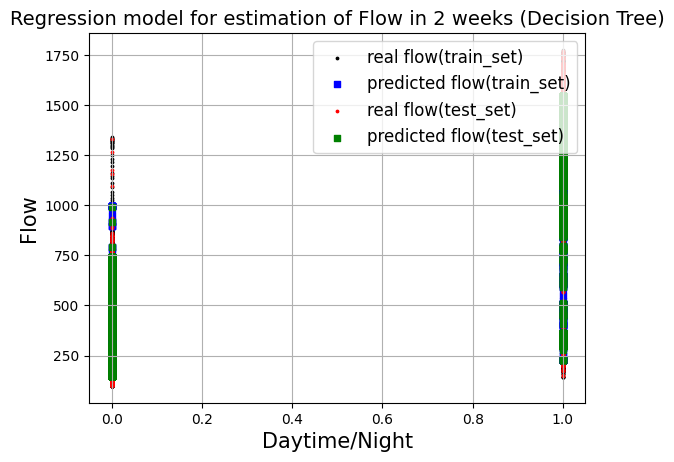

In [ ]:
# Plot real and predicted 'flow' vs 'mcs speed' 
plt.figure(figsize=(11, 6))
# plt.ylim(top = 2000)
plotResult(X_train[:, 0], Y_train, Y_predict_train, X_test[:, 0], Y_test, Y_predict_test, '2 weeks (Decision Tree)', 'MCS speed', 'Flow')
# plt.ylim(top = 2000)
plotResult(X_train[:, 1], Y_train, Y_predict_train, X_test[:, 1], Y_test, Y_predict_test, '2 weeks (Decision Tree)', 'Daytime/Night', 'Flow')

In [ ]:
# Use all data and the fitted model to predict the flow (used for drawing the plot)
Y_predict = RFRegressor.predict(X_features)

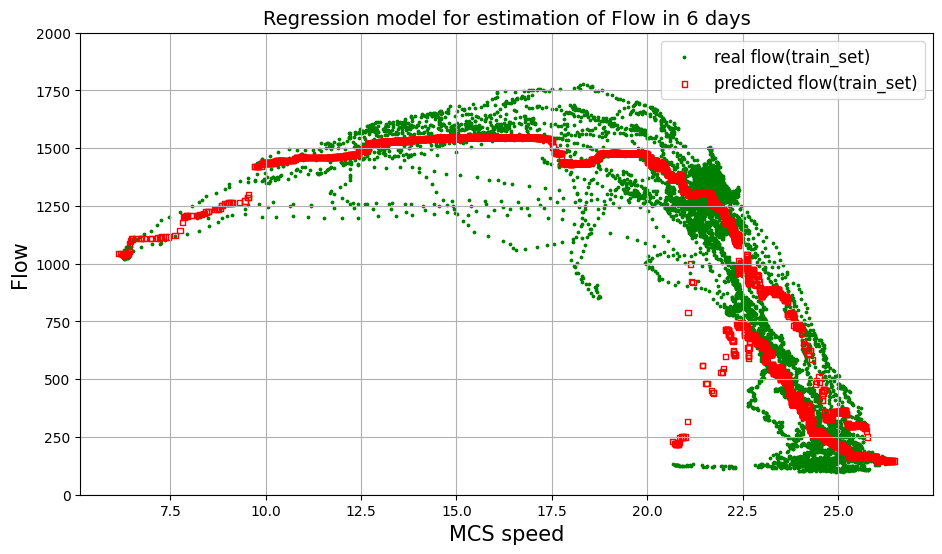

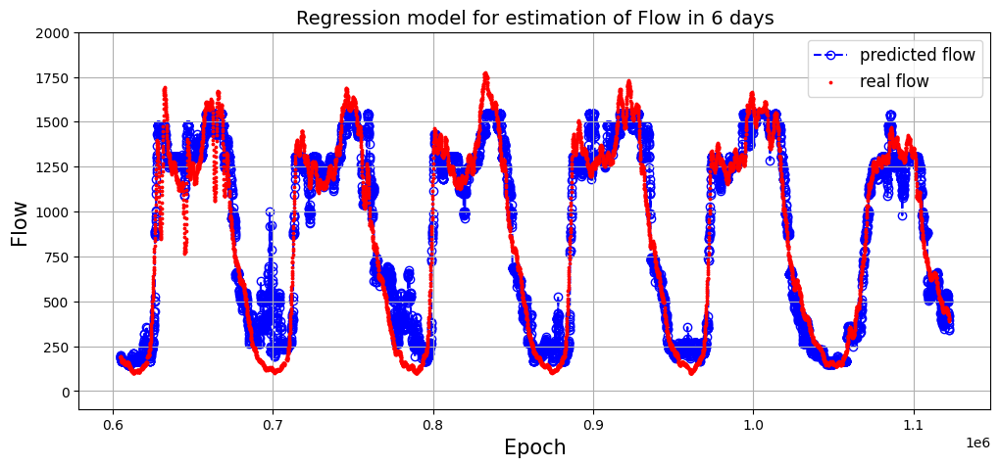

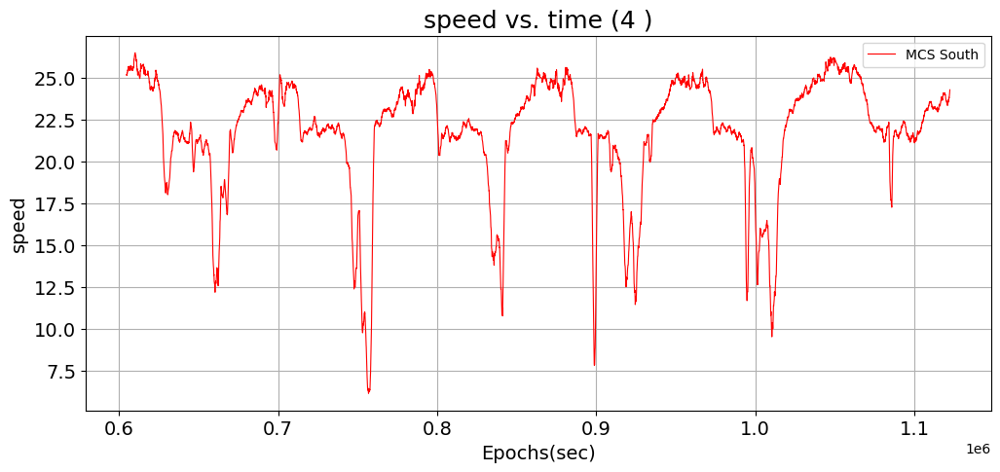

In [ ]:
STARTDATE = 8
ENDDATE = 14
DELTA_STEP = 0
# Plot real and predicted flow vs. X_features (speed_inrix)
plt.figure(figsize=(11, 6))
plt.ylim(bottom = 0, top=2000)
# plt.xlim(left = 5, right=30)
plotResult(X_features[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP, 0], 
           Y_label[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           Y_predict[idx(combinedSouth_2w, STARTDATE) : idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           None,  None, None, '6 days', 'MCS speed', 'Flow')

# plotResult(X_features_mcs_denormalized[:, 0], Y_label, Y_predict, 
#            None,  None, None, '3 weeks', 'MCS speed', 'Flow')


# Plot real and predicted flow vs. Epoch 
plt.figure(figsize=(12, 5))
plt.ylim(bottom = -100, top = 2000)
plotResult(X_epoch[idx(combinedSouth_2w, STARTDATE):idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           Y_label[idx(combinedSouth_2w, STARTDATE):idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           Y_predict[idx(combinedSouth_2w, STARTDATE):idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           None, None, None, '6 days', 'Epoch', 'Flow', 'p')

# Plot corresponding mcs speed 
plt.figure(figsize=(12, 5))
plotAttr(4, combinedSouth_2w.iloc[idx(combinedSouth_2w, STARTDATE):idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 'speed', 'MCS South')



In [ ]:
# test model on future datasets (22th to 27th):
combinedFuture = combinedSouth_shifted.iloc[idx(combinedSouth_shifted, 22): idx(combinedSouth_shifted, 27)]
X_future = combinedFuture[['speed', 'daytime']].values
Y_future = combinedFuture[['flow']].values
print(X_future.shape)
Y_future_predict = RFRegressor.predict(X_future)
print("Root Mean Square Error: ", mean_squared_error(Y_future, Y_future_predict, squared=False))
print("R2 Score: ", r2_score(Y_future, Y_future_predict))

(6637, 2)
Root Mean Square Error:  107.04747958800446
R2 Score:  0.9559142026179624


## 7.2 Random Forest tree for mapping INRIX speed to MCS flow

In [ ]:
# prepare the features [INRIX speed] and label [flow]
# Notice: Y_flow was already defined in previous section 3.
# X_epoch was already defined
# X_inrix_speed was already assigned at section 4
X_features = X_inrix_speed_travelTime_neighbor
Y_label = Y_flow

print(X_features.shape)

# split the train and test datasets
X_train, X_test, Y_train, Y_test = train_test_split(X_features, Y_label, test_size=0.2, random_state=1)


(28387, 5)


In [ ]:
# Hyperparameter tuning: # and depth of tree, minimum # of samples in a leaf
# by using training set
RFRegressor = RandomForestRegressor()
print(RFRegressor.get_params)
param_grid = {'n_estimators': [int(x) for x in np.arange(400, 600, step=20)],
              'max_depth': [11],
              'min_samples_leaf': [15]
              }
grid_search = GridSearchCV(estimator = RFRegressor, param_grid = param_grid, cv = 3, verbose=2, n_jobs = -1, scoring='r2')
grid_search.fit(X_train, Y_train)

grid_search.best_params_

<bound method BaseEstimator.get_params of RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)>
Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  6.1min finished


{'max_depth': 11, 'min_samples_leaf': 15, 'n_estimators': 500}

{'max_depth': 18, 'min_samples_leaf': 1, 'n_estimators': 350}<br>
param_grid = {'n_estimators': [int(x) for x in np.arange(250, 351, 50)],
              'max_depth': [int(x) for x in np.arange(14, 19, step=2)],
              'min_samples_leaf': [int(x) for x in np.arange(1, 5, step=2)]
              }


In [ ]:
# print the results of cross-validation for hyper-parameters
cvres = grid_search.cv_results_
for mean_score, params in zip(cvres["mean_test_score"], cvres['params']):
  print(mean_score, params)

0.8892995523994472 {'max_depth': 18, 'min_samples_leaf': 1, 'n_estimators': 350}
0.8890342187666421 {'max_depth': 18, 'min_samples_leaf': 1, 'n_estimators': 400}
0.8879663456288239 {'max_depth': 18, 'min_samples_leaf': 3, 'n_estimators': 350}
0.8879236198790847 {'max_depth': 18, 'min_samples_leaf': 3, 'n_estimators': 400}
0.8864019924329941 {'max_depth': 18, 'min_samples_leaf': 5, 'n_estimators': 350}
0.8863948490274641 {'max_depth': 18, 'min_samples_leaf': 5, 'n_estimators': 400}
0.8890374657363699 {'max_depth': 20, 'min_samples_leaf': 1, 'n_estimators': 350}
0.8891123741046538 {'max_depth': 20, 'min_samples_leaf': 1, 'n_estimators': 400}
0.8879802801968695 {'max_depth': 20, 'min_samples_leaf': 3, 'n_estimators': 350}
0.8881114649691445 {'max_depth': 20, 'min_samples_leaf': 3, 'n_estimators': 400}
0.886549261942125 {'max_depth': 20, 'min_samples_leaf': 5, 'n_estimators': 350}
0.8866524030729215 {'max_depth': 20, 'min_samples_leaf': 5, 'n_estimators': 400}
0.8891424433352016 {'max_dept

Hyperparameter-tuning: <br>
RF_NTREE = 350
RF_MAXDEPTH = 18
RF_MSL = 1

In [ ]:
# fit the random forest model on whole training set with the tuned hyperparameters
RF_NTREE = 500
RF_MAXDEPTH = 11
RF_MSL = 15

RFRegressor = RandomForestRegressor(n_estimators= RF_NTREE, max_depth=RF_MAXDEPTH, min_samples_leaf=RF_MSL, n_jobs=-1)

# Use 10 folds cross-validation to fit and validate the model by training set
scores = cross_val_score(RFRegressor, X_train, Y_train, scoring='r2', cv=10)
display_scores(scores)

# fit the model on whole training set
# evaluate Performance of model (fitting result) on training set
RFRegressor.fit(X_train, Y_train)
Y_predict_train = RFRegressor.predict(X_train)
print('\nfitting result on whole training set:')
print("Root Mean Square Error: ", mean_squared_error(Y_train, Y_predict_train, squared=False))
print("R2 Score for fitting result on training set: ", RFRegressor.score(X_train, Y_train))

# Evaluate Performance of the fitted model on testing set
Y_predict_test = RFRegressor.predict(X_test)
print('\nprediction result on testing set:')
print("Root Mean Square Error: ", mean_squared_error(Y_test, Y_predict_test, squared=False))
print("R2 Score on testing set: ", r2_score(Y_test, Y_predict_test))

Scores: [0.9009346  0.88002021 0.8817155  0.87880768 0.88222407 0.8795595
 0.88378763 0.88112823 0.87878814 0.88422792]
Mean: 0.8831193471532618
Standard deviation: 0.0062082401478654875

fitting result on whole training set:
Root Mean Square Error:  162.09179132618118
R2 Score for fitting result on training set:  0.8989123545337676

prediction result on testing set:
Root Mean Square Error:  171.94224516352133
R2 Score on testing set:  0.8884080337604502


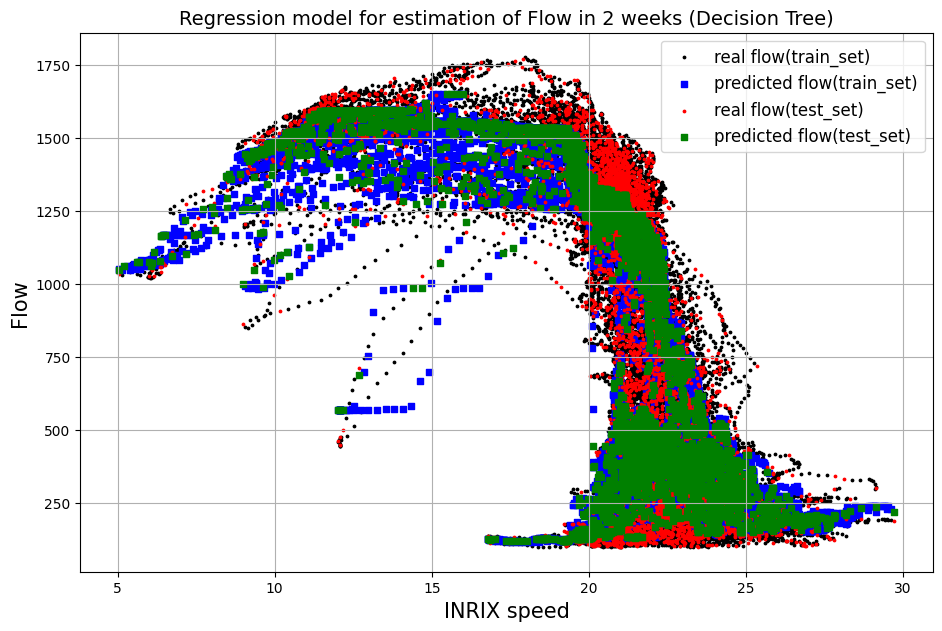

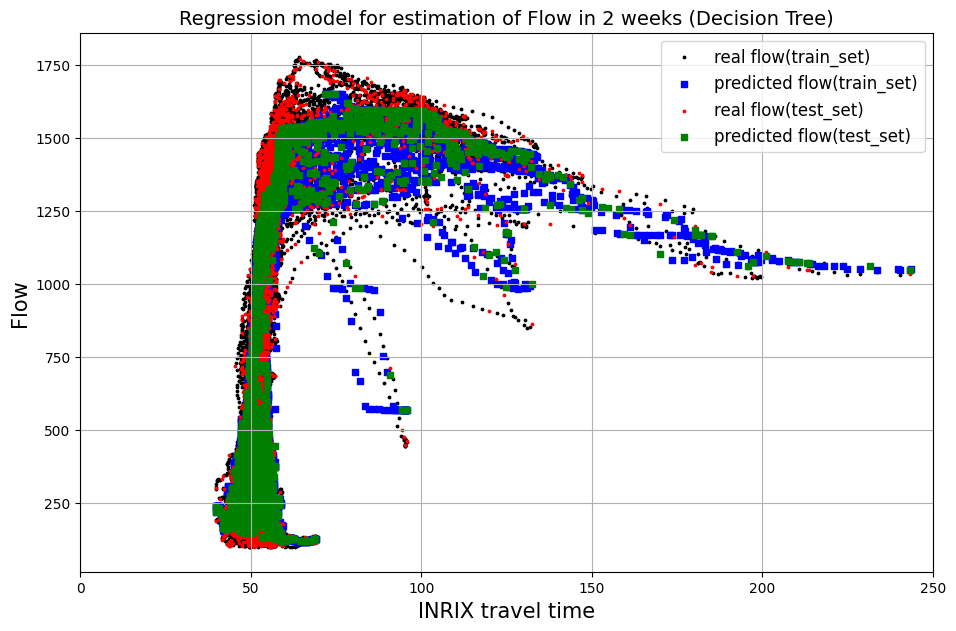

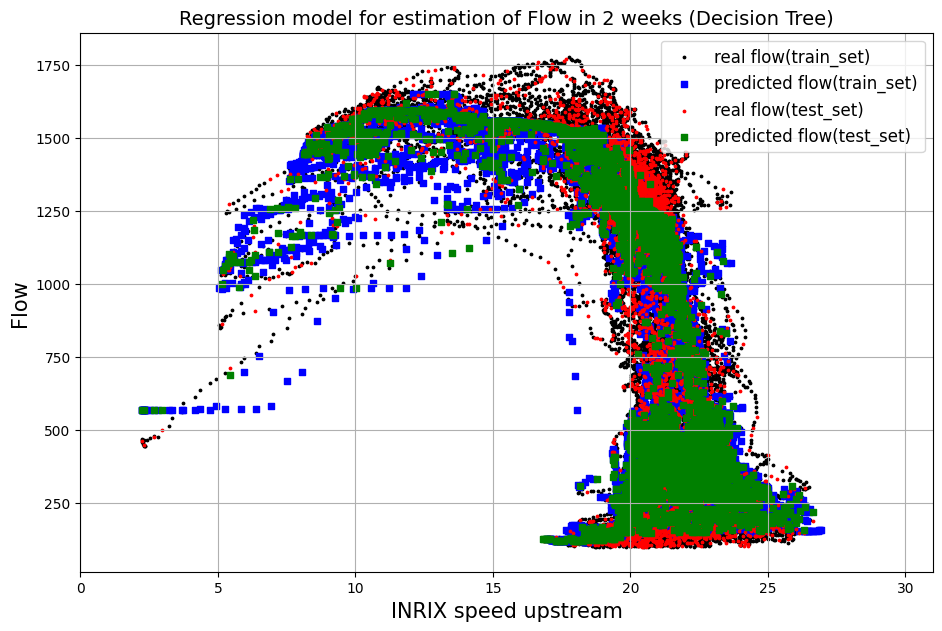

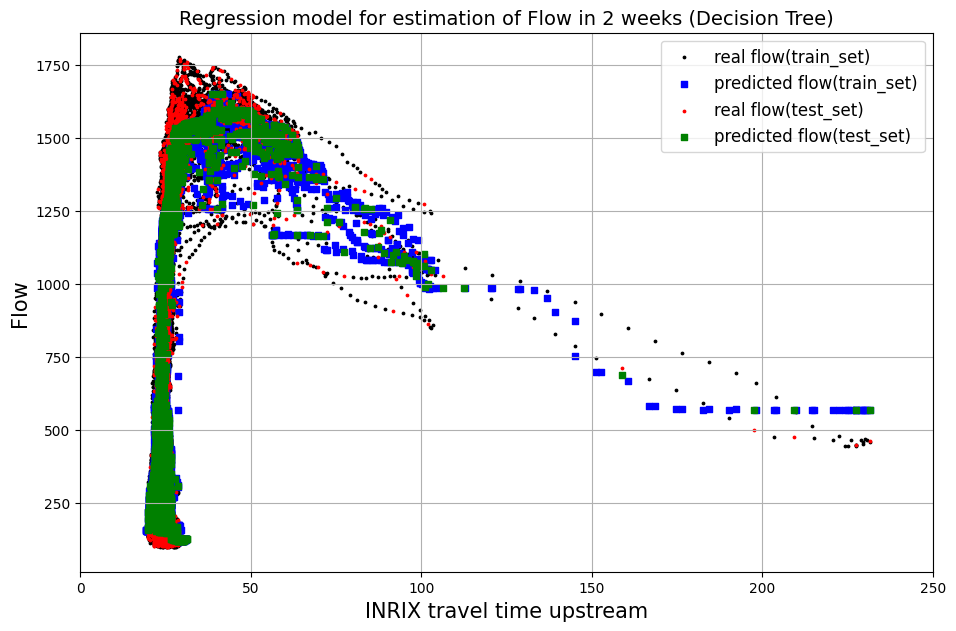

In [ ]:
# Plot real and predicted 'flow' vs 'speed current' 
plt.figure(figsize=(11, 7))
# plt.ylim(top = 2000)
plotResult(X_train[:, 0], Y_train, Y_predict_train, X_test[:, 0], Y_test, Y_predict_test, '2 weeks (Decision Tree)', 'INRIX speed', 'Flow')

# Plot real and predicted 'flow' vs 'speed current' 
plt.figure(figsize=(11, 7))
plt.xlim(right = 250)
plotResult(X_train[:, 1], Y_train, Y_predict_train, X_test[:, 1], Y_test, Y_predict_test, '2 weeks (Decision Tree)', 'INRIX travel time', 'Flow')

# Plot real and predicted 'flow' vs 'speed upstream' 
plt.figure(figsize=(11, 7))
# plt.ylim(top = 2000)
plt.xlim(right = 31)
plotResult(X_train[:, 2], Y_train, Y_predict_train, X_test[:, 2], Y_test, Y_predict_test, '2 weeks (Decision Tree)', 'INRIX speed upstream', 'Flow')

# Plot real and predicted 'flow' vs 'speed upstream' 
plt.figure(figsize=(11, 7))
plt.xlim(right = 250)
plotResult(X_train[:, 3], Y_train, Y_predict_train, X_test[:, 3], Y_test, Y_predict_test, '2 weeks (Decision Tree)', 'INRIX travel time upstream', 'Flow')

In [ ]:
# Use all data and the fitted model to predict the flow (used for drawing the plot)
Y_predict = RFRegressor.predict(X_features)

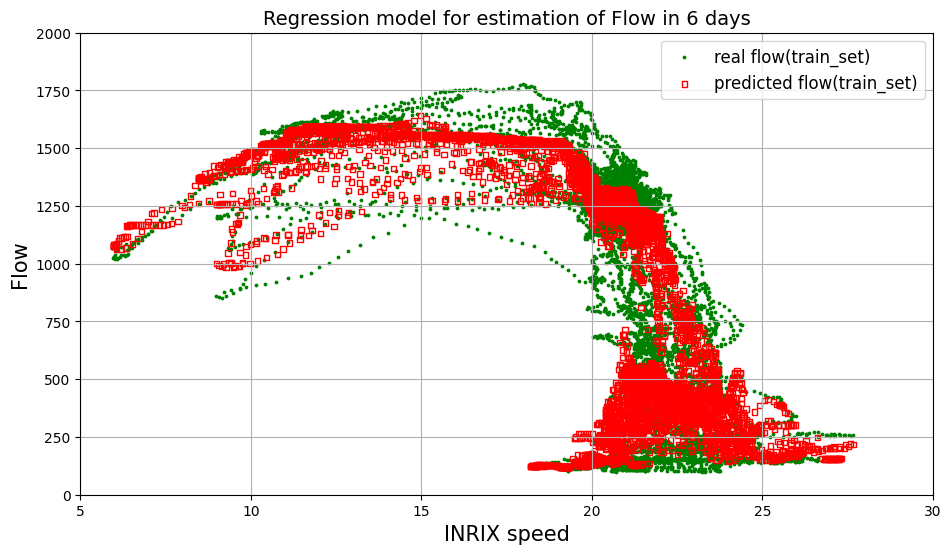

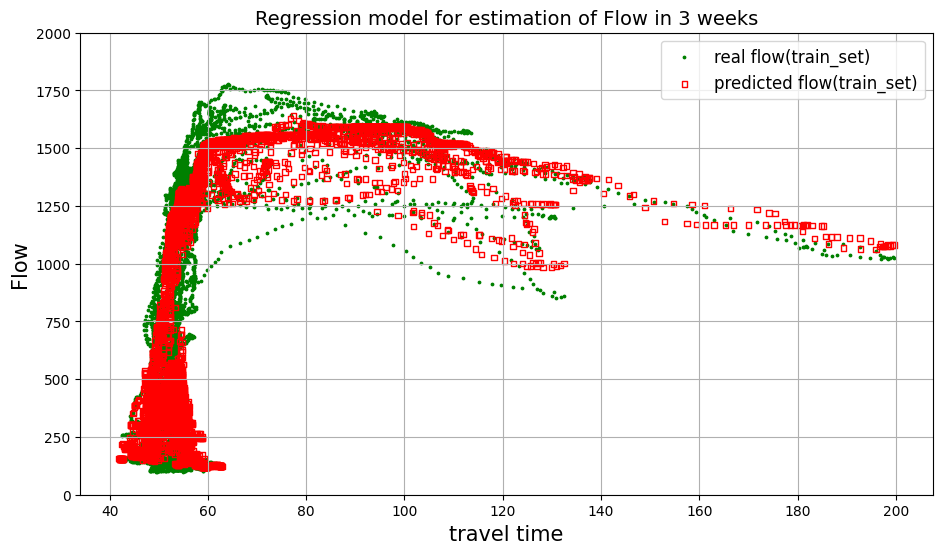

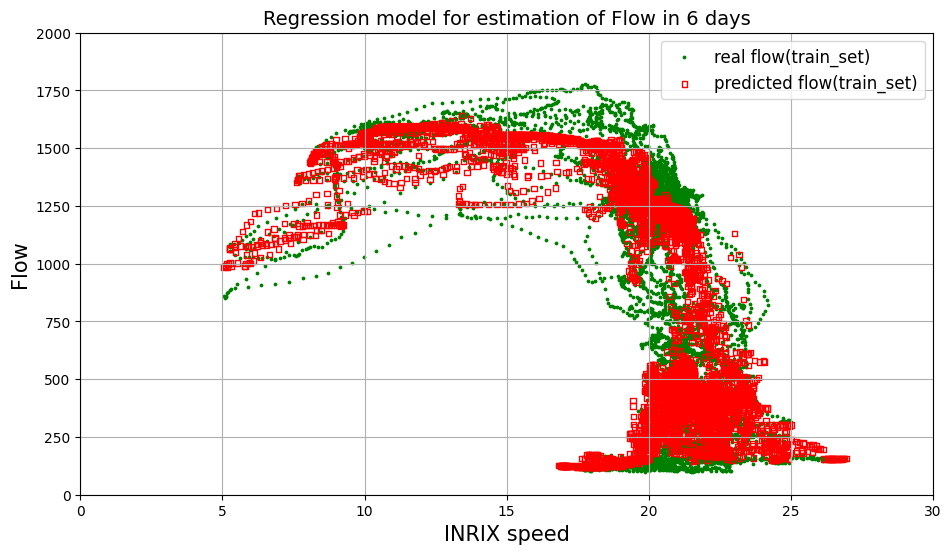

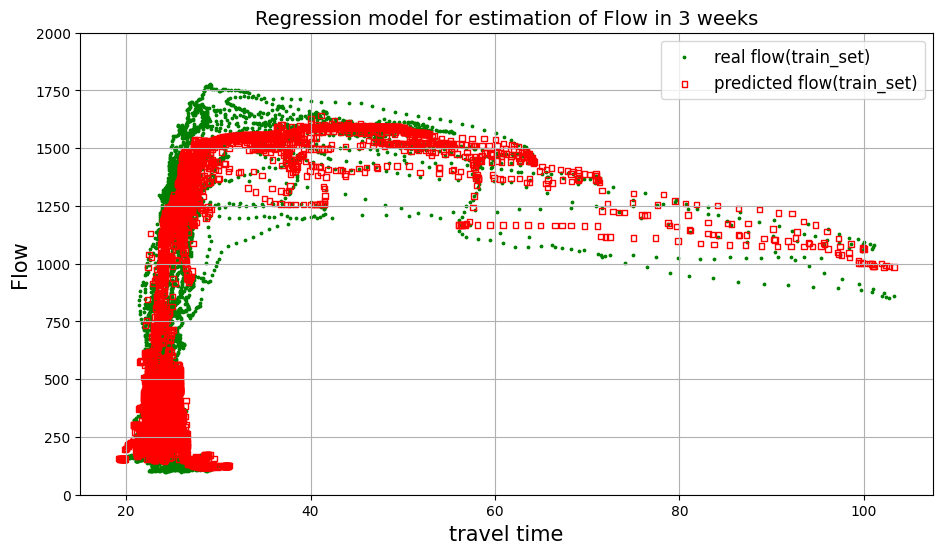

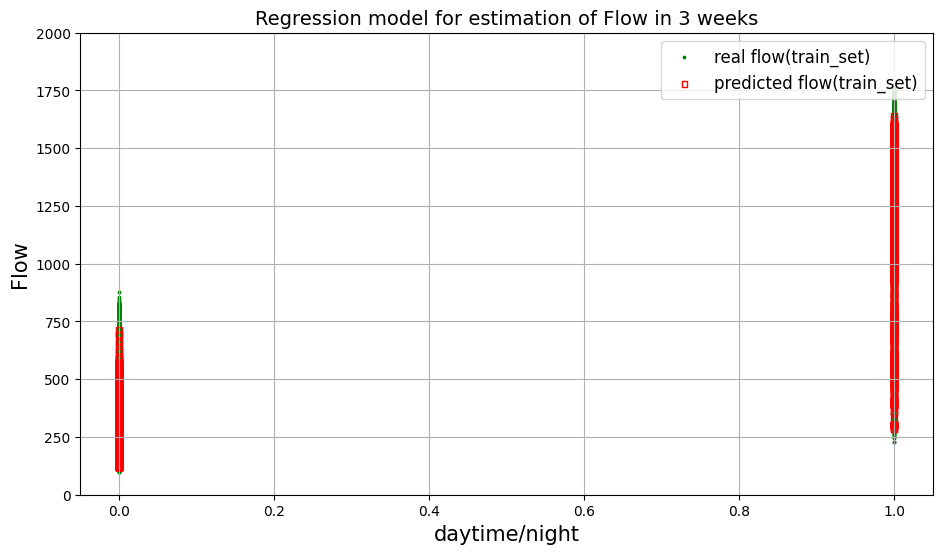

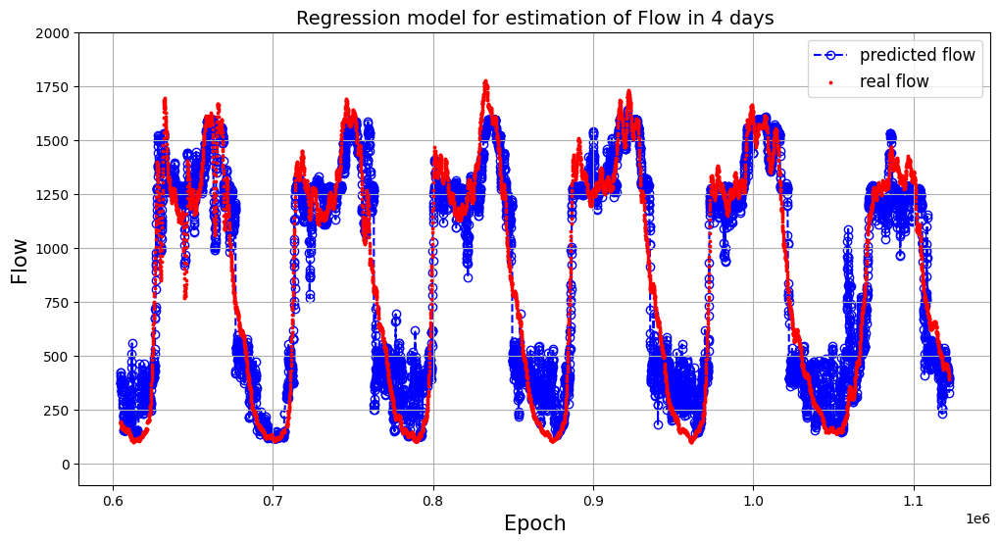

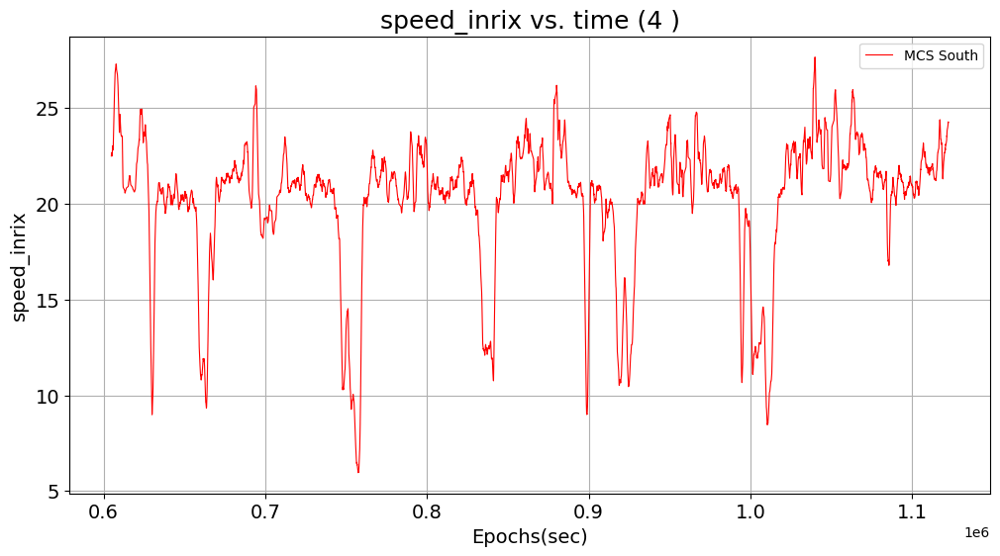

In [ ]:
STARTDATE = 8
ENDDATE = 14
DELTA_STEP = 0

# Plot real and predicted flow vs. X_features (speed_inrix current)
plt.figure(figsize=(11, 6))
plt.ylim(bottom = 0, top=2000)
plt.xlim(left = 5, right=30)
plotResult(X_features[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP, 0], 
           Y_label[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           Y_predict[idx(combinedSouth_2w, STARTDATE) : idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           None,  None, None, '6 days', 'INRIX speed', 'Flow')



# Plot real and predicted flow vs. X_features (travel_inrix upstream)
plt.figure(figsize=(11, 6))
plt.ylim(bottom = 0, top=2000)
# plt.xlim(left = 5, right=30)
plotResult(X_features[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP, 1], 
           Y_label[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           Y_predict[idx(combinedSouth_2w, STARTDATE) : idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           None,  None, None, '3 weeks', 'travel time', 'Flow')

# Plot real and predicted flow vs. X_features (speed_inrix upstream)
plt.figure(figsize=(11, 6))
plt.ylim(bottom = 0, top=2000)
plt.xlim(left = 0, right=30)
plotResult(X_features[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP, 2], 
           Y_label[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           Y_predict[idx(combinedSouth_2w, STARTDATE) : idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           None,  None, None, '6 days', 'INRIX speed', 'Flow')



# Plot real and predicted flow vs. X_features (travel_inrix)
plt.figure(figsize=(11, 6))
plt.ylim(bottom = 0, top=2000)
# plt.xlim(left = 5, right=30)
plotResult(X_features[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP, 3], 
           Y_label[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           Y_predict[idx(combinedSouth_2w, STARTDATE) : idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           None,  None, None, '3 weeks', 'travel time', 'Flow')

# Plot real and predicted flow vs. X_features (temporal factor)
plt.figure(figsize=(11, 6))
plt.ylim(bottom = 0, top=2000)
plotResult(X_features[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP, 4], 
           Y_label[idx(combinedSouth_2w, STARTDATE): idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           Y_predict[idx(combinedSouth_2w, STARTDATE) : idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           None,  None, None, '3 weeks', 'daytime/night', 'Flow')


# Plot real and predicted flow vs. Epoch 
plt.figure(figsize=(12, 6))
plt.ylim(bottom = -100, top = 2000)
plotResult(X_epoch[idx(combinedSouth_2w, STARTDATE):idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           Y_label[idx(combinedSouth_2w, STARTDATE):idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           Y_predict[idx(combinedSouth_2w, STARTDATE):idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 
           None, None, None, '4 days', 'Epoch', 'Flow', 'p')

# Plot corresponding inrix speed 
plt.figure(figsize=(12, 6))
plotAttr(4, combinedSouth_2w.iloc[idx(combinedSouth_2w, STARTDATE):idx(combinedSouth_2w, ENDDATE) + DELTA_STEP], 'speed_inrix', 'MCS South')



In [ ]:
# test model on future datasets (22th to 27th):
combinedFuture = combinedSouth_shifted.iloc[idx(combinedSouth_shifted, 22): idx(combinedSouth_shifted, 27)]
X_future = combinedFuture[['speed_inrix', 'travel_time_secs','speed_inrix_up', 'travel_time_secs_up', 'daytime']].values
Y_future = combinedFuture[['flow']].values
print(X_future.shape)
Y_future_predict = RFRegressor.predict(X_future)
print("Root Mean Square Error: ", mean_squared_error(Y_future, Y_future_predict, squared=False))
print("R2 Score: ", r2_score(Y_future, Y_future_predict))

(6637, 5)
Root Mean Square Error:  162.39742561667407
R2 Score:  0.8985378435895001


# <em>Part II. Deep Learning for Traffic Flow Estimation</em>

## Deep Learning Models
Part II of this notebook aims to implement deep learning models (neural networks) to estimate the traffic flow based on Mcs data and INRIX data: 
1. Feedforward neural network
2. Vanilla Recurrent neural network
3. LSTM or MGU



# 1. Feedforward neural network

## 1.0 import the processed dataset (MCS + INRIX combined dataframe)

* with all data preprocesses

In [74]:
# load the processed dataset
# (start from this cell if data frame has been processed and saved in repo before)
combinedSouth_shifted = pd.read_pickle('OutData/inrixMcsSouth_temp.pkl')

In [75]:
# load the combined/processed dataframe of adjacent link
# start from this cell if data frame has been processed before
combinedNorth_shifted = pd.read_pickle('OutData/inrixMcsSouth_temp_exchanged.pkl')

## 1.1 helper functions

In [95]:
# funtion for normalizing the feature columns
# Input: X: Numpy array with shape(sample #, features)
# Output X_scaled: normalized Numpy array with shape(sample #, features)
# Output scaler: scaler, which fitted on input array, for normalization
def normalize_nobias(X, Scaler=None):

  # scale the remaining feature columns
  scaler = None
  X_normalized = None

  if(Scaler==None):
    scaler = StandardScaler()
    X_normalized = scaler.fit_transform(X)
  else:
    scaler = Scaler
    X_normalized = scaler.transform(X)

  
  return X_normalized, scaler

In [96]:
# helper function for building the DNN model for MCS:
# Input args: shape of input feature (wo batch size)
# return value: a model
def Model_MCS(n_input):
  n_hidden1 = 64
  n_hidden2 = 64
  n_output = 1
  
  input1 = Input(shape=n_input)
  dense1 = Dense(units=n_hidden1, activation='relu')(input1)
  dense2 = Dense(units=n_hidden2, activation='relu')(dense1)
  output1 = Dense(units=n_output, activation='linear')(dense2)

  model = Model(inputs=input1, outputs=output1, name='DNN_MCS')
  model.compile(loss='mse', optimizer='adam', metrics=[tf.keras.metrics.RootMeanSquaredError()])

  return model

In [97]:
# helper function for building the DNN model for MCS:
# Input args: shape of input feature (wo batch size)
# return value: a model
def Model_INRIX(n_input):
  n_hidden1 = 128
  n_hidden2 = 128
  # n_hidden3 = 64
  n_output = 1
  
  input1 = Input(shape=n_input)
  dense1 = Dense(units=n_hidden1, activation='relu')(input1)
  dense2 = Dense(units=n_hidden2, activation='relu')(dense1)
  # dense3 = Dense(units=n_hidden3, activation='relu')(dense2)
  output1 = Dense(units=n_output, activation='linear')(dense2)

  model = Model(inputs=input1, outputs=output1, name='DNN_INRIX')
  model.compile(loss='mse', optimizer='adam', metrics=[tf.keras.metrics.RootMeanSquaredError()])

  return model

## 1.2 DNN for MCS data -> MCS Flow (speed + temporal factor)

a. main features: speed, temporal(day/night)<br>

In [79]:
# select 2~3 weeks data to build model
combinedSouth_2w = combinedSouth_shifted.iloc[:idx(combinedSouth_shifted, 22)]

# prepare the feature "MCS speed" + "temporal factor"
X_epoch = combinedSouth_2w['Epoch_mcs'].values
X_mcs_speed = combinedSouth_2w['speed'].values.reshape(-1, 1)
X_temporal = combinedSouth_2w['daytime'].values
Y_flow = combinedSouth_2w['flow'].values

# normalize the speed vector
X_mcs_speed, scaler_mcs_speed = normalize_nobias(X_mcs_speed)

# append temporal factor to the polynomialized/scaled X_mcs_speed
X_mcs_speed_temp = np.append(X_mcs_speed, X_temporal.reshape(-1,1), axis=1)

# code for monitoring feature matrix
# could be commented out while don't want to print out
dfFeatures = pd.DataFrame(X_mcs_speed_temp)
dfFeatures.describe()

,0,1
count,2.838700e+04,28387.000000
mean,-1.407265e-16,0.619509
std,1.000018e+00,0.485516
min,-4.967381e+00,0.000000
25%,-1.960567e-01,0.000000
50%,7.093544e-02,1.000000
75%,7.201136e-01,1.000000
max,1.522198e+00,1.000000


In [80]:
# assign normalized polynomial features matrix into feature matrix,
# assign predict target to label array
X_features = X_mcs_speed_temp
Y = Y_flow

# split training and test data
X_train, X_test, Y_train, Y_test = train_test_split(X_features, Y, test_size=0.2, random_state=1)

In [81]:
# build the NN model:
n_input = X_train.shape[1:]
model = Model_MCS(n_input)

# display the model
model.summary()


TypeError: ignored

In [ ]:
# Sequential method to build the NN model
# # build the feedforward NN model:
# n_input = X_train.shape[1:]
# n_hidden1 = 64
# n_hidden2 = 64
# n_output = 1

# # create the model
# model = keras.models.Sequential()
# model.add(keras.layers.Input(shape=n_input))
# model.add(keras.layers.Dense(units=n_hidden1, activation='relu'))
# model.add(keras.layers.Dense(units=n_hidden2, activation='relu'))
# model.add(keras.layers.Dense(units=n_output, activation='linear'))
# model.compile(loss='mse', optimizer='adam')

# # display the model
# model.summary()


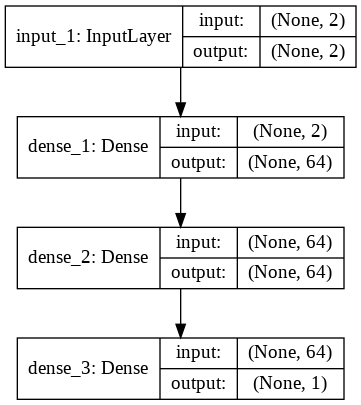

In [ ]:
plot_model(model, 'OutData/DNN_MCS.png', show_shapes = True)

In [ ]:
# model training
history = model.fit(X_train, Y_train, epochs=60, verbose=1, validation_split=0.1)

Train on 20438 samples, validate on 2271 samples
Epoch 1/60
20438/20438 [==============================] - 3s 162us/step - loss: 435776.0290 - val_loss: 54491.6467
Epoch 2/60
20438/20438 [==============================] - 2s 79us/step - loss: 50235.2072 - val_loss: 50100.9235
Epoch 3/60
20438/20438 [==============================] - 2s 80us/step - loss: 45549.6025 - val_loss: 44872.6505
Epoch 4/60
20438/20438 [==============================] - 2s 78us/step - loss: 38821.1235 - val_loss: 35700.1316
Epoch 5/60
20438/20438 [==============================] - 2s 78us/step - loss: 29343.5809 - val_loss: 26080.5597
Epoch 6/60
20438/20438 [==============================] - 2s 78us/step - loss: 22506.1516 - val_loss: 21098.3843
Epoch 7/60
20438/20438 [==============================] - 2s 78us/step - loss: 19427.5519 - val_loss: 18883.2780
Epoch 8/60
20438/20438 [==============================] - 2s 77us/step - loss: 18320.4073 - val_loss: 18233.4065
Epoch 9/60
20438/20438 [=====================

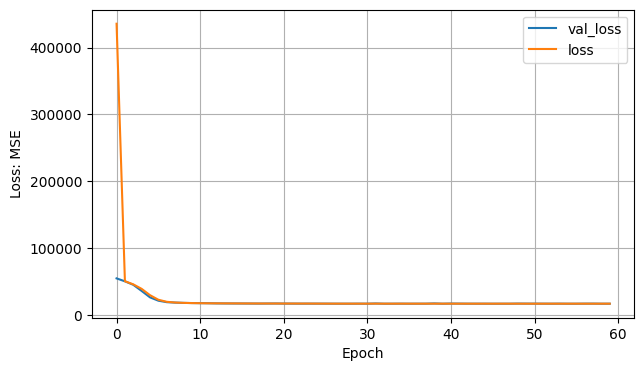

In [ ]:
# plot loss and accuracy history
plt.style.use('default')
pd.DataFrame(history.history).plot(figsize=(7,4))
plt.xlabel("Epoch", size=10)
plt.ylabel("Loss: MSE", size=10)
plt.grid()
plt.show()

In [ ]:
# Evaluate Performance (fitting result) of training set
Y_predict_train = model.predict(X_train)
print("Root Mean Square Error for training set: ", mean_squared_error(Y_train, Y_predict_train, squared=False))
print("R2 Score for training set: ", r2_score(Y_train, Y_predict_train))
print()

# Evaluate Performance of testing set
Y_predict_test = model.predict(X_test)
print("Root Mean Square Error: ", mean_squared_error(Y_test, Y_predict_test, squared=False))
print("R2 Score: ", r2_score(Y_test, Y_predict_test))

Root Mean Square Error for training set:  128.63693724392454
R2 Score for training set:  0.9363340212422913

Root Mean Square Error:  128.43863574797115
R2 Score:  0.9377328323922561


In [ ]:
# Use all data to train and predict the flow
Y_predict = model.predict(X_features)

In [ ]:
combinedSouth_2w.iloc[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP1].date

Timestamp('2018-10-01 02:09:00')

In [ ]:
combinedSouth_2w.iloc[idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2].date

IndexError: ignored

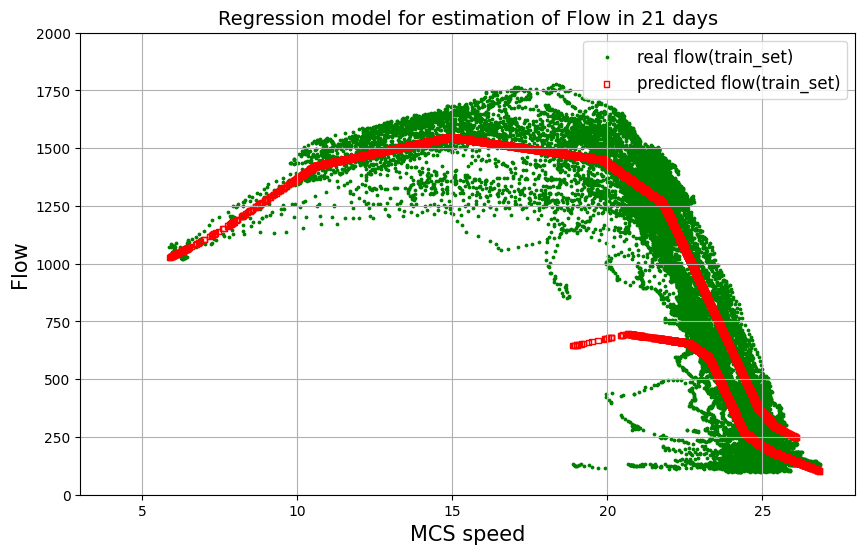

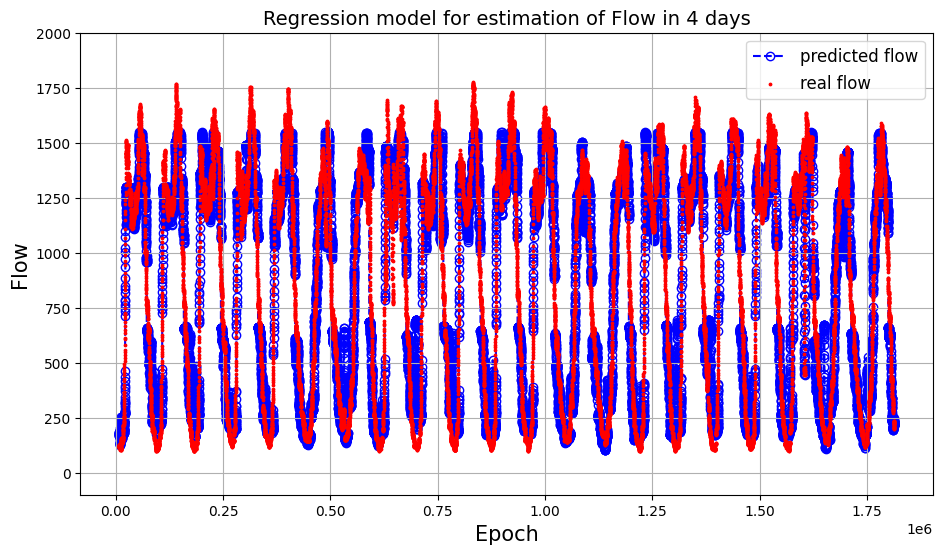

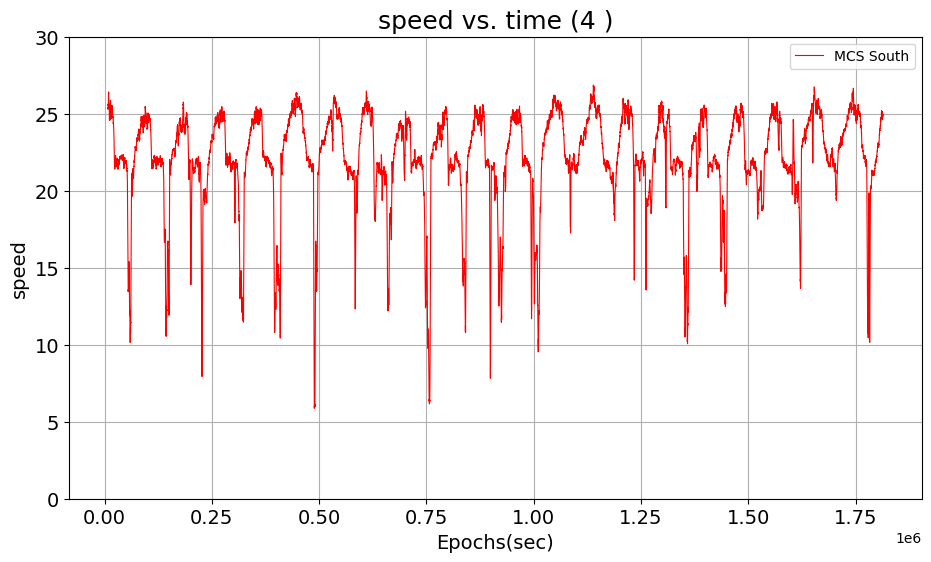

In [ ]:
STARTDATE = 1
ENDDATE = 99
DELTA_STEP1 = 0
DELTA_STEP2 = 0
# Plot real and predicted flow vs. X_features (speed_mcs)
X_features_denormalized = scaler_mcs_speed.inverse_transform(X_features[:,0:-1])
plt.figure(figsize=(10, 6))
plt.ylim(bottom = 0, top=2000)
plt.xlim(left = 3, right=28)
plotResult(X_features_denormalized[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP1: idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2, 0], 
           Y_flow[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP1: idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           Y_predict[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP1 : idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           None,  None, None, '21 days', 'MCS speed', 'Flow')

# plotResult(X_features_mcs_denormalized[:, 0], Y_label, Y_predict, 
#            None,  None, None, '3 weeks', 'MCS speed', 'Flow')


# Plot real and predicted flow vs. Epoch 
plt.figure(figsize=(11, 6))
plt.ylim(bottom = -100, top = 2000)
plotResult(X_epoch[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP1:idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           Y_flow[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP1:idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           Y_predict[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP1:idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           None, None, None, '4 days', 'Epoch', 'Flow', 'p')

# Plot corresponding mcs speed 
plt.figure(figsize=(11, 6))
plt.ylim(bottom = 0, top=30)
plotAttr(4, combinedSouth_2w.iloc[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP1:idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 'speed', 'MCS South')


#### Test the NN model on the future data (totally unseen) from the same link:
*   test the model on the future dataset 22nd - 27th Oct.

In [ ]:
# Evaluate the model by using future testing data (temporal test set)
df_future = dataFrame[idx(dataFrame, 22):idx(dataFrame, 28)]
X_future_speed = df_future['speed'].values.reshape(-1, 1)
X_future_temporal = df_future['daytime'].values.reshape(-1, 1)
y_future = df_future['flow'].values

# normalize the speed vector
X_future_speed, scaler_mcs_speed = normalize_nobias(X_future_speed)

# append temporal factor to the polynomialized/scaled X_mcs_speed
X_future = np.append(X_future_speed, X_future_temporal, axis=1)

dfFeatures = pd.DataFrame(X_future)
dfFeatures.describe()


,0,1
count,8.007000e+03,8007.000000
mean,1.302429e-15,0.626452
std,1.000062e+00,0.483776
min,-4.443945e+00,0.000000
25%,-1.787944e-01,0.000000
50%,8.378168e-02,1.000000
75%,7.438873e-01,1.000000
max,1.625135e+00,1.000000


In [ ]:
y_future_predict = model.predict(X_future)
print("Root Mean Square Error: ", mean_squared_error(y_future, y_future_predict, squared=False))
print("R2 Score: ", r2_score(y_future, y_future_predict))

Root Mean Square Error:  110.60436698580287
R2 Score:  0.9522685085705855


#### Test the NN model on adjacent(upstream) link

In [ ]:
# test the model on adjacent(upstream) link:
# select 2~3 weeks data to build model
combinedNorth_2w = combinedNorth_shifted.iloc[:idx(combinedNorth_shifted, 22)]

# prepare the feature "MCS speed" + "temporal factor"
X_epoch = combinedNorth_2w['Epoch_mcs'].values
X_mcs_speed = combinedNorth_2w['speed'].values.reshape(-1, 1)
X_temporal = combinedNorth_2w['daytime'].values.reshape(-1, 1)
Y_flow = combinedNorth_2w['flow'].values

# turn single feature into polynomial features matrix: 1, s, s^2, s^3, ...
X_mcs_speed, scaler_mcs_speed = normalize_nobias(X_mcs_speed)

# append temporal factor to the polynomialized/scaled X_mcs_speed
X_mcs_speed_temp = np.append(X_mcs_speed, X_temporal, axis=1)

# code for monitoring feature matrix
# could be commented out while don't want to print out
dfRawFeatures = pd.DataFrame(X_mcs_speed_temp)
print(dfRawFeatures.describe())

#assign normalized polynomial features matrix into feature matrix,
# assign predict target to label array
X_features_upstream = X_mcs_speed_temp
Y_upstream = Y_flow

                  0             1
count  2.838700e+04  28387.000000
mean   5.559367e-16      0.619474
std    1.000018e+00      0.485525
min   -6.109512e+00      0.000000
25%   -3.209515e-02      0.000000
50%    1.908451e-01      1.000000
75%    5.681120e-01      1.000000
max    1.077152e+00      1.000000


In [ ]:
# Use the model to estimate the flow on adjacent link dataset
Y_predict_upstream = model.predict(X_features_upstream)

# Evaluate estimation accuracy on testing set
print("Root Mean Square Error: ", mean_squared_error(Y_upstream, Y_predict_upstream, squared=False))
print("R2 Score for adjacent testing set: ", r2_score(Y_upstream, Y_predict_upstream))

Root Mean Square Error:  164.1713741835142
R2 Score for adjacent testing set:  0.8882282239358749


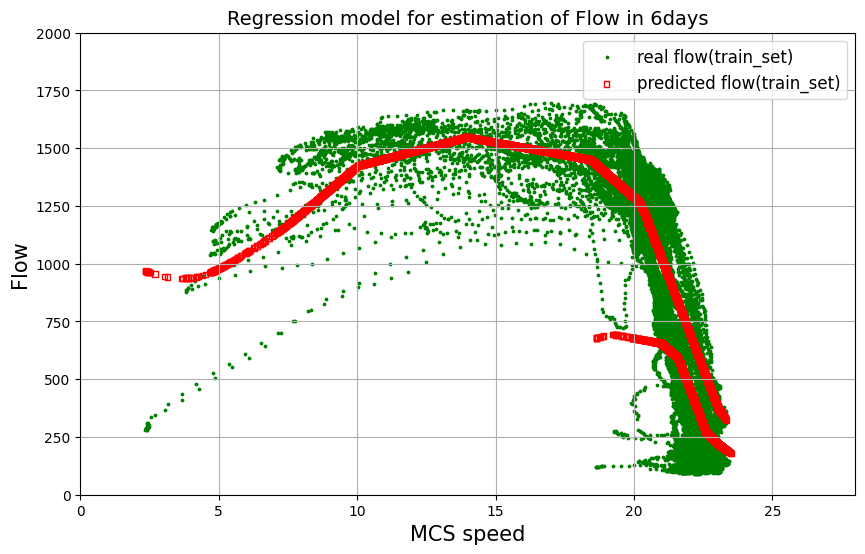

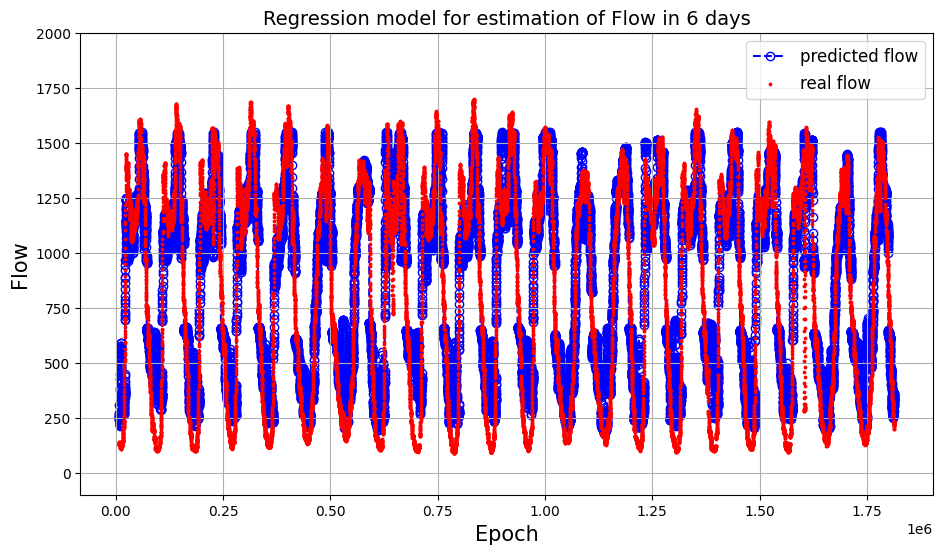

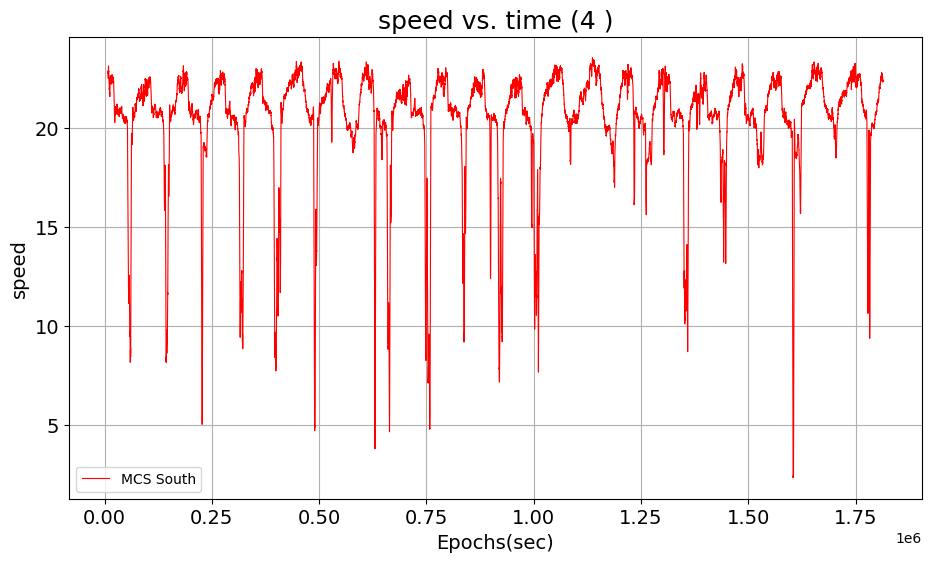

In [ ]:
STARTDATE = 1
ENDDATE = 99
DELTA_STEP = 0
dataFrame = combinedNorth_2w
# Plot real and predicted flow vs. X_features (speed_mcs)
X_features_mcs_denormalized = scaler_mcs_speed.inverse_transform(X_features_upstream[:,0])
plt.figure(figsize=(10, 6))
plt.ylim(bottom = 0, top=2000)
plt.xlim(left = 0, right=28)
plotResult(X_features_mcs_denormalized[idx(dataFrame, STARTDATE): idx(dataFrame, ENDDATE) + DELTA_STEP], 
           Y_upstream[idx(dataFrame, STARTDATE): idx(dataFrame, ENDDATE) + DELTA_STEP], 
           Y_predict_upstream[idx(dataFrame, STARTDATE) : idx(dataFrame, ENDDATE) + DELTA_STEP], 
           None,  None, None, '6days', 'MCS speed', 'Flow')

# plotResult(X_features_mcs_denormalized[:, 0], Y_label, Y_predict, 
#            None,  None, None, '3 weeks', 'MCS speed', 'Flow')


# Plot real and predicted flow vs. Epoch 
plt.figure(figsize=(11, 6))
plt.ylim(bottom = -100, top = 2000)
plotResult(X_epoch[idx(dataFrame, STARTDATE):idx(dataFrame, ENDDATE) + DELTA_STEP], 
           Y_upstream[idx(dataFrame, STARTDATE):idx(dataFrame, ENDDATE) + DELTA_STEP], 
           Y_predict_upstream[idx(dataFrame, STARTDATE):idx(dataFrame, ENDDATE) + DELTA_STEP], 
           None, None, None, '6 days', 'Epoch', 'Flow', 'p')

# Plot corresponding mcs speed 
plt.figure(figsize=(11, 6))
plotAttr(4, dataFrame.iloc[idx(dataFrame, STARTDATE):idx(dataFrame, ENDDATE) + DELTA_STEP], 'speed', 'MCS South')


## 1.3 DNN for INRIX data -> MCS Flow (speed + travel time + daytime * single link)

In [ ]:
# prepare the feature "INRIX speed" + "temporal factor"
X_epoch = combinedSouth_2w['Epoch_mcs'].values
X_inrix = combinedSouth_2w[['speed_inrix', 'travel_time_secs']].values
X_temporal = combinedSouth_2w['daytime'].values.reshape(-1,1)
Y_flow = combinedSouth_2w['flow'].values

# normalize the speed vector
X_inrix, scaler_inrix = normalize_nobias(X_inrix)

# append temporal factor to the polynomialized/scaled X_mcs_speed
X_inrix_temp = np.append(X_inrix, X_temporal, axis=1)

# code for monitoring feature matrix
# could be commented out while don't want to print out
dfFeatures = pd.DataFrame(X_inrix_temp)
dfFeatures.describe()

,0,1,2
count,2.838700e+04,2.838700e+04,28387.000000
mean,7.291483e-16,-5.299871e-16,0.619509
std,1.000018e+00,1.000018e+00,0.485516
min,-4.825326e+00,-1.123672e+00,0.000000
25%,-1.274934e-01,-4.056488e-01,0.000000
50%,1.522075e-01,-2.474240e-01,1.000000
75%,5.032606e-01,-1.032244e-01,1.000000
max,2.780825e+00,1.125867e+01,1.000000


In [ ]:
# assign normalized polynomial features matrix into feature matrix,
# assign predict target to label array
X_features = X_inrix_temp
Y = Y_flow

# split training and test data
X_train, X_test, Y_train, Y_test = train_test_split(X_features, Y, test_size=0.2, random_state=1)

In [ ]:
# build the NN model:
n_input = X_train.shape[1:]
model = Model_INRIX(n_input)

# display the model
model.summary()

Model: "DNN_MCS"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         (None, 3)                 0         
_________________________________________________________________
dense_13 (Dense)             (None, 64)                256       
_________________________________________________________________
dense_14 (Dense)             (None, 64)                4160      
_________________________________________________________________
dense_15 (Dense)             (None, 1)                 65        
Total params: 4,481
Trainable params: 4,481
Non-trainable params: 0
_________________________________________________________________


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: UserWarning: Update your `Model` call to the Keras 2 API: `Model(name="DNN_MCS", inputs=Tensor("in..., outputs=Tensor("de...)`
  app.launch_new_instance()


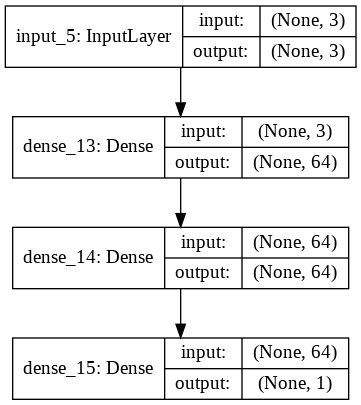

In [ ]:
plot_model(model, 'OutData/DNN_MCS.png', show_shapes = True)

In [ ]:
# model training
history = model.fit(X_train, Y_train, epochs=60, verbose=1, validation_split=0.1)

Train on 20438 samples, validate on 2271 samples
Epoch 1/60
20438/20438 [==============================] - 2s 85us/step - loss: 451057.9368 - val_loss: 71129.8393
Epoch 2/60
20438/20438 [==============================] - 2s 79us/step - loss: 59998.8075 - val_loss: 59473.6760
Epoch 3/60
20438/20438 [==============================] - 2s 78us/step - loss: 55624.7977 - val_loss: 57382.0241
Epoch 4/60
20438/20438 [==============================] - 2s 78us/step - loss: 53943.3215 - val_loss: 55237.6481
Epoch 5/60
20438/20438 [==============================] - 2s 79us/step - loss: 52098.2711 - val_loss: 53008.3809
Epoch 6/60
20438/20438 [==============================] - 2s 79us/step - loss: 50344.1508 - val_loss: 50632.1075
Epoch 7/60
20438/20438 [==============================] - 2s 81us/step - loss: 48700.3483 - val_loss: 49038.8299
Epoch 8/60
20438/20438 [==============================] - 2s 82us/step - loss: 47240.1794 - val_loss: 47489.8196
Epoch 9/60
20438/20438 [======================

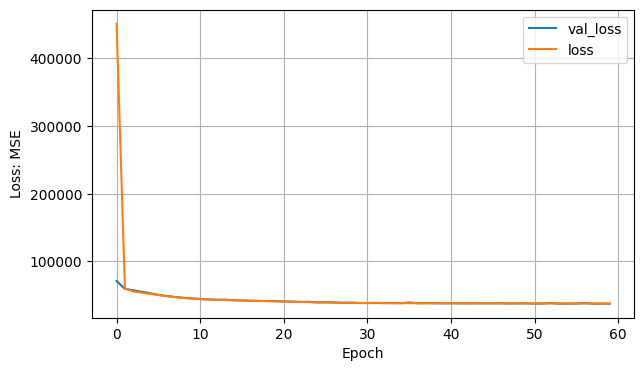

In [ ]:
# plot loss and accuracy history
plt.style.use('default')
pd.DataFrame(history.history).plot(figsize=(7,4))
plt.xlabel("Epoch", size=10)
plt.ylabel("Loss: MSE", size=10)
plt.grid()
plt.show()

In [ ]:
# Evaluate Performance (fitting result) of training set
Y_predict_train = model.predict(X_train)
print("Root Mean Square Error for training set: ", mean_squared_error(Y_train, Y_predict_train, squared=False))
print("R2 Score for training set: ", r2_score(Y_train, Y_predict_train))
print()

# Evaluate Performance of testing set
Y_predict_test = model.predict(X_test)
print("Root Mean Square Error: ", mean_squared_error(Y_test, Y_predict_test, squared=False))
print("R2 Score: ", r2_score(Y_test, Y_predict_test))

Root Mean Square Error for training set:  194.27039530113083
R2 Score for training set:  0.854792420803415

Root Mean Square Error:  191.32280552753846
R2 Score:  0.8618339872901006


#### Test the NN model on the future data (totally unseen) from the same link:
*   test the model on the future dataset 22nd - 27th Oct.

In [ ]:
# Evaluate the model by using future testing data (temporal test set)
df_future = combinedSouth_shifted.iloc[idx(combinedSouth_shifted, 22):idx(combinedSouth_shifted, 28)]
df_future.reset_index(drop=True, inplace=True)

X_future= df_future[['speed_inrix','travel_time_secs']].values
X_future_temporal = df_future['daytime'].values.reshape(-1, 1)
y_future = df_future['flow'].values
x_epoch_future = df_future['Epoch_mcs']

# normalize the speed vector
X_future, scaler_inrix_future = normalize_nobias(X_future)

# append temporal factor to the polynomialized/scaled X_mcs_speed
X_future = np.append(X_future, X_future_temporal, axis=1)

dfFeatures = pd.DataFrame(X_future)
dfFeatures.describe()


,0,1,2
count,8.007000e+03,8.007000e+03,8007.000000
mean,-4.075671e-16,-2.760929e-16,0.626452
std,1.000062e+00,1.000062e+00,0.483776
min,-4.120197e+00,-9.504641e-01,0.000000
25%,-7.005109e-02,-4.481072e-01,0.000000
50%,2.206426e-01,-3.015170e-01,1.000000
75%,5.197217e-01,-1.460388e-01,1.000000
max,1.903312e+00,6.997378e+00,1.000000


In [ ]:
y_future_predict = model.predict(X_future)
print("Root Mean Square Error: ", mean_squared_error(y_future, y_future_predict, squared=False))
print("R2 Score: ", r2_score(y_future, y_future_predict))

Root Mean Square Error:  187.73020771932647
R2 Score:  0.8624917430634167


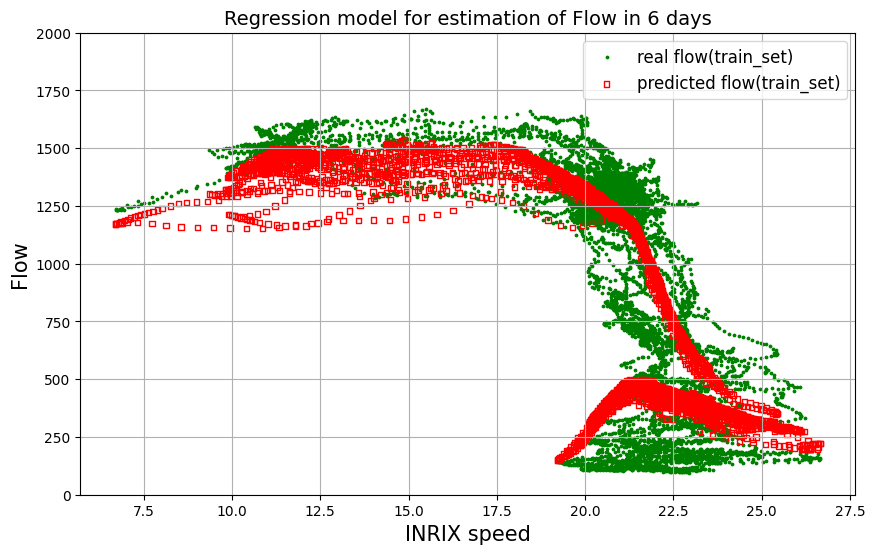

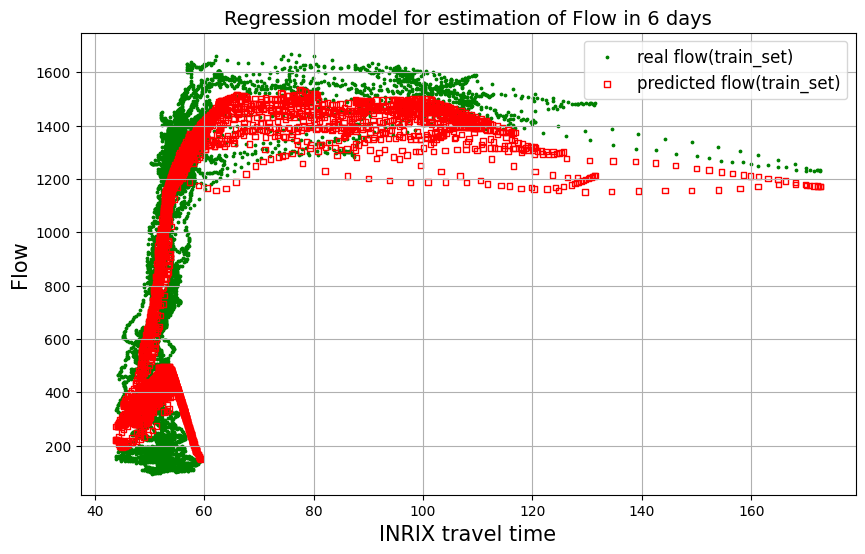

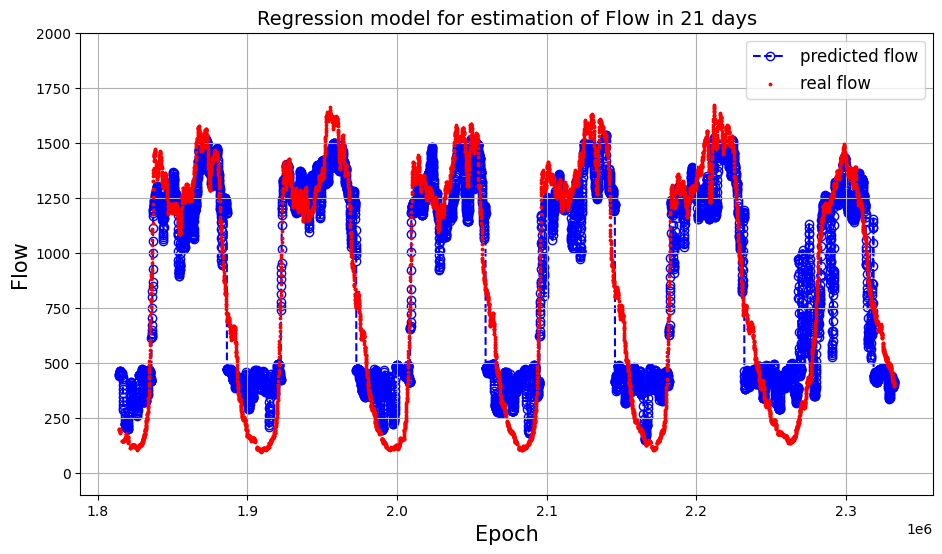

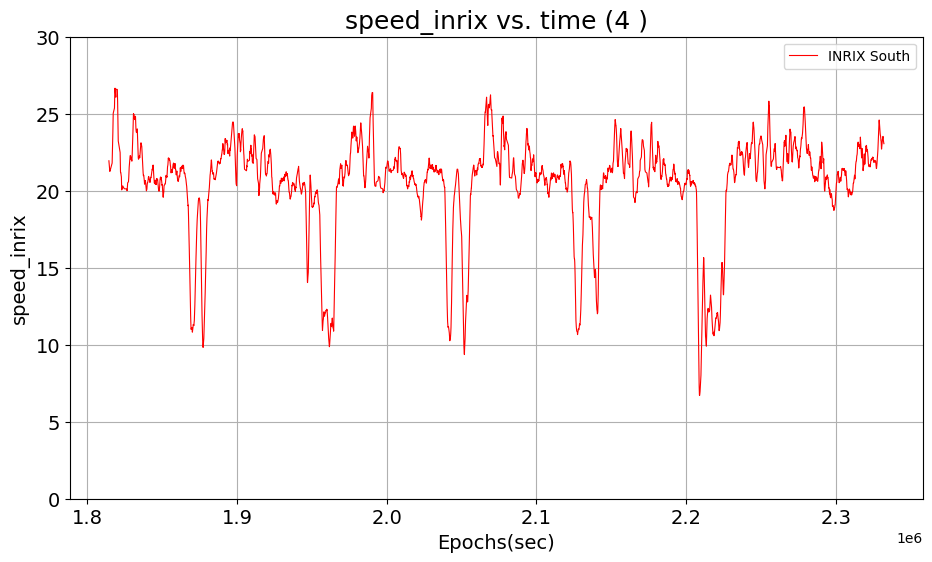

In [ ]:
STARTDATE = 1
ENDDATE = 99
DELTA_STEP1 = 0
DELTA_STEP2 = 0
dataFrame = df_future
# Plot real and predicted flow vs. X_features (speed_inrix, current link)
X_features_denormalized = scaler_inrix_future.inverse_transform(X_future[:,0:-1])
plt.figure(figsize=(10, 6))
plt.ylim(bottom = 0, top=2000)
# plt.xlim(left = 0, right=30)
plotResult(X_features_denormalized[idx(dataFrame, STARTDATE)+DELTA_STEP1: idx(dataFrame, ENDDATE) + DELTA_STEP2, 0], 
           y_future[idx(dataFrame, STARTDATE)+DELTA_STEP1: idx(dataFrame, ENDDATE) + DELTA_STEP2], 
           y_future_predict[idx(dataFrame, STARTDATE)+DELTA_STEP1 : idx(dataFrame, ENDDATE) + DELTA_STEP2], 
           None,  None, None, '6 days', 'INRIX speed', 'Flow')

# Plot real and predicted flow vs. X_features (travel time, current link)
plt.figure(figsize=(10, 6))
# plt.ylim(bottom = 0, top=2000)
# plt.xlim(left = 0, right=28)
plotResult(X_features_denormalized[idx(dataFrame, STARTDATE)+DELTA_STEP1: idx(dataFrame, ENDDATE) + DELTA_STEP2, 1], 
           y_future[idx(dataFrame, STARTDATE)+DELTA_STEP1: idx(dataFrame, ENDDATE) + DELTA_STEP2], 
           y_future_predict[idx(dataFrame, STARTDATE)+DELTA_STEP1 : idx(dataFrame, ENDDATE) + DELTA_STEP2], 
           None,  None, None, '6 days', 'INRIX travel time', 'Flow')


# Plot real and predicted flow vs. Epoch 
plt.figure(figsize=(11, 6))
plt.ylim(bottom = -100, top = 2000)
plotResult(x_epoch_future[idx(dataFrame, STARTDATE)+DELTA_STEP1:idx(dataFrame, ENDDATE) + DELTA_STEP2], 
           y_future[idx(dataFrame, STARTDATE)+DELTA_STEP1:idx(dataFrame, ENDDATE) + DELTA_STEP2], 
           y_future_predict[idx(dataFrame, STARTDATE)+DELTA_STEP1:idx(dataFrame, ENDDATE) + DELTA_STEP2], 
           None, None, None, '21 days', 'Epoch', 'Flow', 'p')


# Plot corresponding mcs speed 
plt.figure(figsize=(11, 6))
plt.ylim(bottom = 0, top=30)
plotAttr(4, dataFrame.iloc[idx(dataFrame, STARTDATE)+DELTA_STEP1:idx(dataFrame, ENDDATE) + DELTA_STEP2], 'speed_inrix', 'INRIX South')


#### Test the NN model on adjacent(upstream) link

In [ ]:
# Evaluate the model by using future testing data (temporal test set)
df_adjacent = combinedNorth_shifted.iloc[:idx(combinedNorth_shifted, 22)]

X_adjacent = df_adjacent[['speed_inrix','travel_time_secs']].values
X_adjacent_temporal = df_adjacent['daytime'].values.reshape(-1, 1)
y_adjacent = df_adjacent['flow'].values
X_epoch_adjacent = df_adjacent['Epoch_mcs']

# normalize the speed vector
X_adjacent, scaler_inrix_adjacent = normalize_nobias(X_adjacent)

# append temporal factor to the polynomialized/scaled X_mcs_speed
X_adjacent = np.append(X_adjacent, X_adjacent_temporal, axis=1)

dfFeatures = pd.DataFrame(X_adjacent)
dfFeatures.describe()


,0,1,2
count,2.838700e+04,2.838700e+04,28387.000000
mean,5.536566e-16,3.394849e-16,0.619474
std,1.000018e+00,1.000018e+00,0.485525
min,-5.777580e+00,-7.628550e-01,0.000000
25%,-1.564353e-01,-3.231539e-01,0.000000
50%,1.680348e-01,-2.092339e-01,1.000000
75%,5.225485e-01,-9.099022e-02,1.000000
max,2.238034e+00,1.919176e+01,1.000000


In [ ]:
y_adjacent_predict = model.predict(X_adjacent)
print("Root Mean Square Error: ", mean_squared_error(y_adjacent, y_adjacent_predict, squared=False))
print("R2 Score: ", r2_score(y_adjacent, y_adjacent_predict))

Root Mean Square Error:  224.09272910420106
R2 Score:  0.7917462567009235


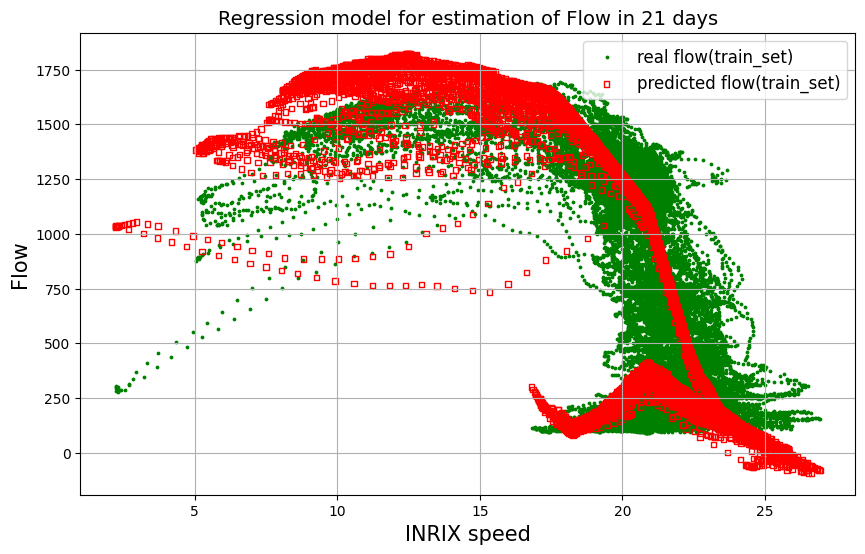

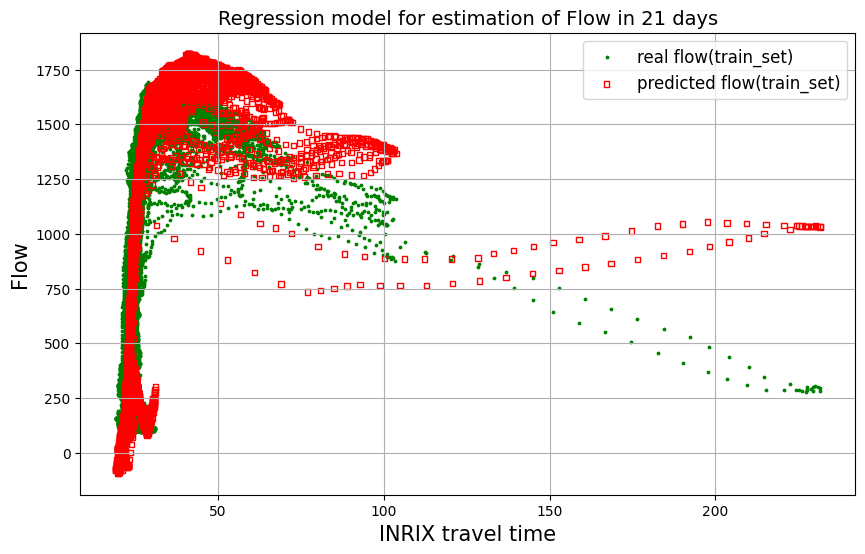

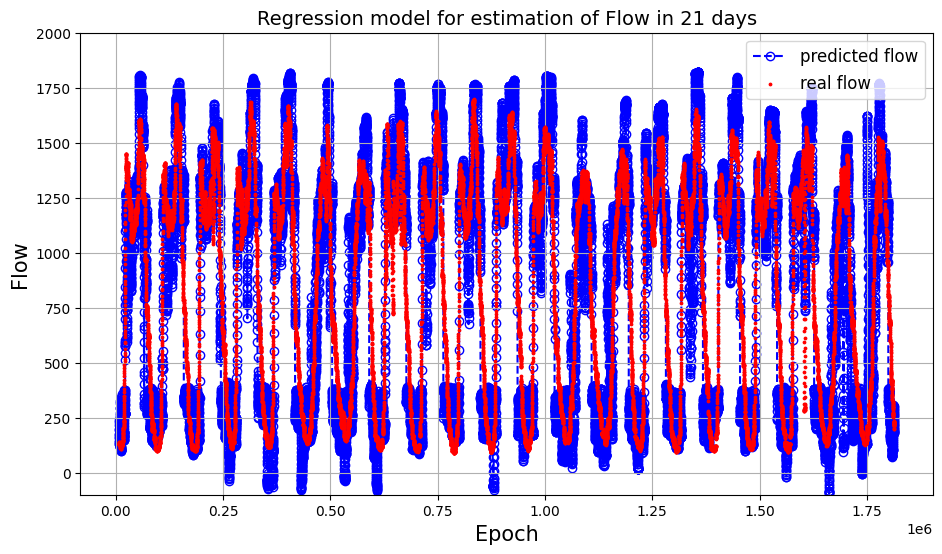

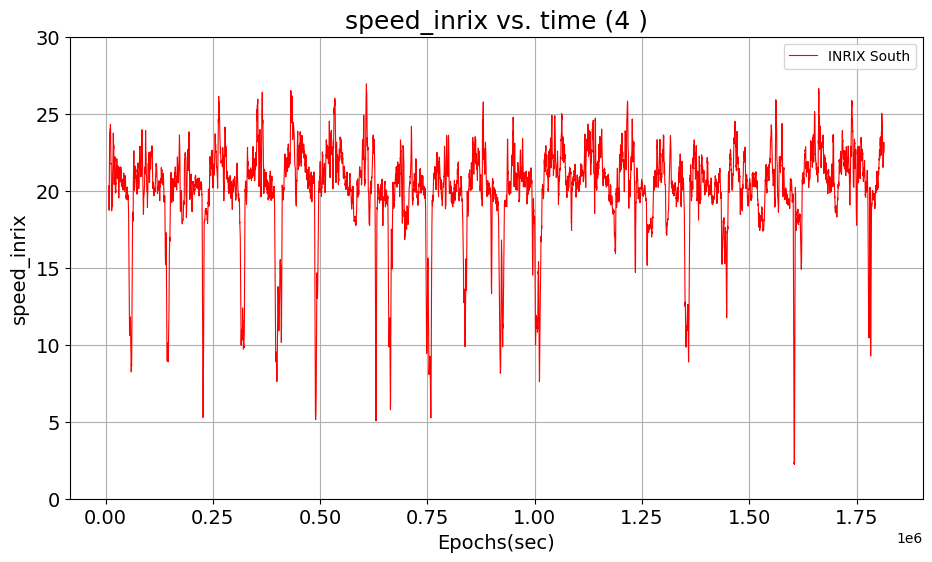

In [ ]:
STARTDATE = 1
ENDDATE = 99
DELTA_STEP1 = 0
DELTA_STEP2 = 0
dataFrame = df_adjacent
# Plot real and predicted flow vs. X_features (speed_inrix, current link)
X_features_denormalized = scaler_inrix_adjacent.inverse_transform(X_adjacent[:,0:-1])
plt.figure(figsize=(10, 6))
# plt.ylim(bottom = 0, top=2000)
# plt.xlim(left = 0, right=30)
plotResult(X_features_denormalized[idx(dataFrame, STARTDATE)+DELTA_STEP1: idx(dataFrame, ENDDATE) + DELTA_STEP2, 0], 
           y_adjacent[idx(dataFrame, STARTDATE)+DELTA_STEP1: idx(dataFrame, ENDDATE) + DELTA_STEP2], 
           y_adjacent_predict[idx(dataFrame, STARTDATE)+DELTA_STEP1 : idx(dataFrame, ENDDATE) + DELTA_STEP2], 
           None,  None, None, '21 days', 'INRIX speed', 'Flow')

# Plot real and predicted flow vs. X_features (travel time, current link)
plt.figure(figsize=(10, 6))
# plt.ylim(bottom = 0, top=2000)
# plt.xlim(left = 0, right=28)
plotResult(X_features_denormalized[idx(dataFrame, STARTDATE)+DELTA_STEP1: idx(dataFrame, ENDDATE) + DELTA_STEP2, 1], 
           y_adjacent[idx(dataFrame, STARTDATE)+DELTA_STEP1: idx(dataFrame, ENDDATE) + DELTA_STEP2], 
           y_adjacent_predict[idx(dataFrame, STARTDATE)+DELTA_STEP1 : idx(dataFrame, ENDDATE) + DELTA_STEP2], 
           None,  None, None, '21 days', 'INRIX travel time', 'Flow')


# Plot real and predicted flow vs. Epoch 
plt.figure(figsize=(11, 6))
plt.ylim(bottom = -100, top = 2000)
plotResult(X_epoch_adjacent[idx(dataFrame, STARTDATE)+DELTA_STEP1:idx(dataFrame, ENDDATE) + DELTA_STEP2], 
           y_adjacent[idx(dataFrame, STARTDATE)+DELTA_STEP1:idx(dataFrame, ENDDATE) + DELTA_STEP2], 
           y_adjacent_predict[idx(dataFrame, STARTDATE)+DELTA_STEP1:idx(dataFrame, ENDDATE) + DELTA_STEP2], 
           None, None, None, '21 days', 'Epoch', 'Flow', 'p')


# Plot corresponding mcs speed 
plt.figure(figsize=(11, 6))
plt.ylim(bottom = 0, top=30)
plotAttr(4, dataFrame.iloc[idx(dataFrame, STARTDATE)+DELTA_STEP1:idx(dataFrame, ENDDATE) + DELTA_STEP2], 'speed_inrix', 'INRIX South')


## 1.4 DNN for INRIX data -> MCS Flow (speed + daytime * 2 links)

a. main features: speed, temporal(day/night), spatial(current/upstream)<br>
b. exclude features: travel time<br>

In [ ]:
# prepare the feature "INRIX speed" + "temporal factor"
X_epoch = combinedSouth_2w['Epoch_mcs'].values
X_inrix_speed = combinedSouth_2w[['speed_inrix', 'speed_inrix_up']].values
X_temporal = combinedSouth_2w['daytime'].values.reshape(-1,1)
Y_flow = combinedSouth_2w['flow'].values

# normalize the speed vector
X_inrix_speed, scaler_inrix_speed = normalize_nobias(X_inrix_speed)

# append temporal factor to the polynomialized/scaled X_mcs_speed
X_inrix_speed_temp = np.append(X_inrix_speed, X_temporal, axis=1)

# code for monitoring feature matrix
# could be commented out while don't want to print out
dfFeatures = pd.DataFrame(X_inrix_speed_temp)
dfFeatures.describe()

,0,1,2
count,2.838700e+04,2.838700e+04,28387.000000
mean,7.291483e-16,7.829523e-16,0.619509
std,1.000018e+00,1.000018e+00,0.485516
min,-4.825326e+00,-5.778012e+00,0.000000
25%,-1.274934e-01,-1.564138e-01,0.000000
50%,1.522075e-01,1.680825e-01,1.000000
75%,5.032606e-01,5.226247e-01,1.000000
max,2.780825e+00,2.238249e+00,1.000000


In [ ]:
# assign normalized polynomial features matrix into feature matrix,
# assign predict target to label array
X_features = X_inrix_speed_temp
Y = Y_flow

# split training and test data
X_train, X_test, Y_train, Y_test = train_test_split(X_features, Y, test_size=0.2, random_state=1)

In [ ]:
# build the NN model:
n_input = X_train.shape[1:]
model = Model_INRIX(n_input)

# display the model
model.summary()

Model: "DNN_MCS"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 3)                 0         
_________________________________________________________________
dense_10 (Dense)             (None, 64)                256       
_________________________________________________________________
dense_11 (Dense)             (None, 64)                4160      
_________________________________________________________________
dense_12 (Dense)             (None, 1)                 65        
Total params: 4,481
Trainable params: 4,481
Non-trainable params: 0
_________________________________________________________________


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: UserWarning: Update your `Model` call to the Keras 2 API: `Model(name="DNN_MCS", inputs=Tensor("in..., outputs=Tensor("de...)`
  


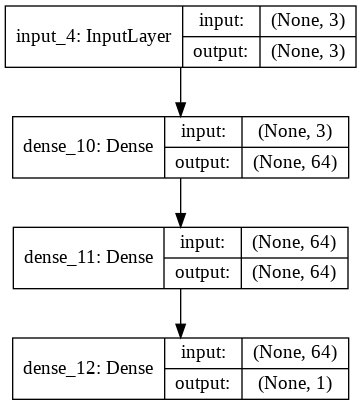

In [ ]:
plot_model(model, 'OutData/DNN_MCS.png', show_shapes = True)

In [ ]:
# model training
history = model.fit(X_train, Y_train, epochs=60, verbose=1, validation_split=0.1)

Train on 20438 samples, validate on 2271 samples
Epoch 1/60
20438/20438 [==============================] - 2s 78us/step - loss: 451856.4636 - val_loss: 73423.7495
Epoch 2/60
20438/20438 [==============================] - 1s 72us/step - loss: 64900.1290 - val_loss: 63775.9628
Epoch 3/60
20438/20438 [==============================] - 2s 74us/step - loss: 58401.2632 - val_loss: 59025.9044
Epoch 4/60
20438/20438 [==============================] - 1s 73us/step - loss: 54633.9321 - val_loss: 55508.4846
Epoch 5/60
20438/20438 [==============================] - 2s 83us/step - loss: 51321.3066 - val_loss: 51451.5143
Epoch 6/60
20438/20438 [==============================] - 2s 78us/step - loss: 48729.3831 - val_loss: 49234.9425
Epoch 7/60
20438/20438 [==============================] - 2s 77us/step - loss: 46820.7065 - val_loss: 47062.4443
Epoch 8/60
20438/20438 [==============================] - 2s 74us/step - loss: 45134.6495 - val_loss: 45052.8670
Epoch 9/60
20438/20438 [======================

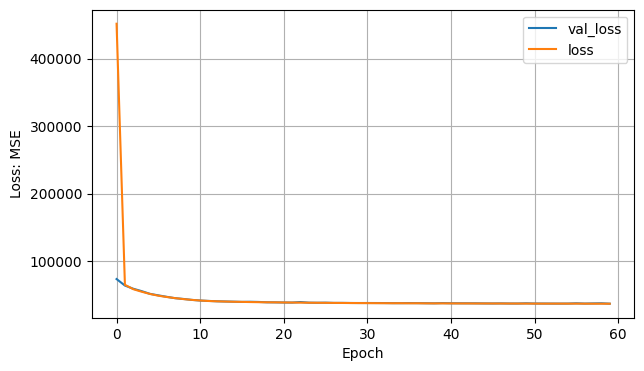

In [ ]:
# plot loss and accuracy history
plt.style.use('default')
pd.DataFrame(history.history).plot(figsize=(7,4))
plt.xlabel("Epoch", size=10)
plt.ylabel("Loss: MSE", size=10)
plt.grid()
plt.show()

In [ ]:
# Evaluate Performance (fitting result) of training set
Y_predict_train = model.predict(X_train)
print("Root Mean Square Error for training set: ", mean_squared_error(Y_train, Y_predict_train, squared=False))
print("R2 Score for training set: ", r2_score(Y_train, Y_predict_train))
print()

# Evaluate Performance of testing set
Y_predict_test = model.predict(X_test)
print("Root Mean Square Error: ", mean_squared_error(Y_test, Y_predict_test, squared=False))
print("R2 Score: ", r2_score(Y_test, Y_predict_test))

Root Mean Square Error for training set:  191.55460352809482
R2 Score for training set:  0.8588238855772895

Root Mean Square Error:  188.91148527693488
R2 Score:  0.865294766691


In [ ]:
# Evaluate the model by using future testing data (temporal test set)
df_future = dataFrame[idx(dataFrame, 22):idx(dataFrame, 27)]
X_future_speed = df_future[['speed_inrix','speed_inrix_up']].values
X_future_temporal = df_future['daytime'].values.reshape(-1, 1)
y_future = df_future['flow'].values

# normalize the speed vector
X_future_speed, scaler_inrix_speed = normalize(X_future_speed, scaler_inrix_speed)

# append temporal factor to the polynomialized/scaled X_mcs_speed
X_future = np.append(X_future_speed, X_future_temporal, axis=1)

dfFeatures = pd.DataFrame(X_future)
dfFeatures.describe()


,0,1,2
count,8007.000000,8007.000000,8007.000000
mean,-0.107338,-0.087949,0.626452
std,1.021157,1.011179,0.483776
min,-4.314444,-4.624247,0.000000
25%,-0.178867,-0.213501,0.000000
50%,0.117958,0.114000,1.000000
75%,0.423346,0.441501,1.000000
max,1.836121,2.199189,1.000000


In [ ]:
y_future_predict = model.predict(X_future)
print("Root Mean Square Error: ", mean_squared_error(y_future, y_future_predict, squared=False))
print("R2 Score: ", r2_score(y_future, y_future_predict))

Root Mean Square Error:  178.74268601572913
R2 Score:  0.8753429011252933


In [ ]:
# Use all data to train and predict the flow
Y_predict = model.predict(X_features)

In [ ]:
combinedSouth_2w.iloc[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP1].date

Timestamp('2018-10-08 22:41:00')

In [ ]:
combinedSouth_2w.iloc[idx(combinedSouth_2w, ENDDATE)+DELTA_STEP2].date

Timestamp('2018-10-09 01:10:00')

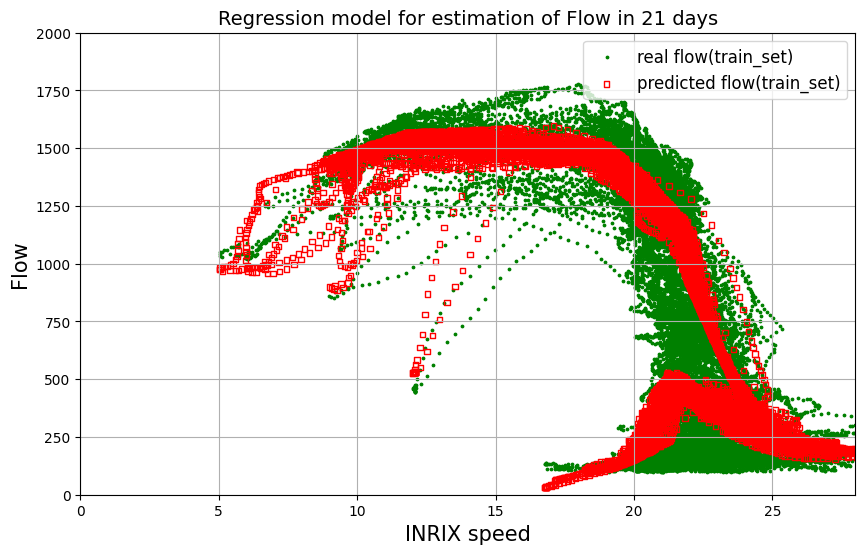

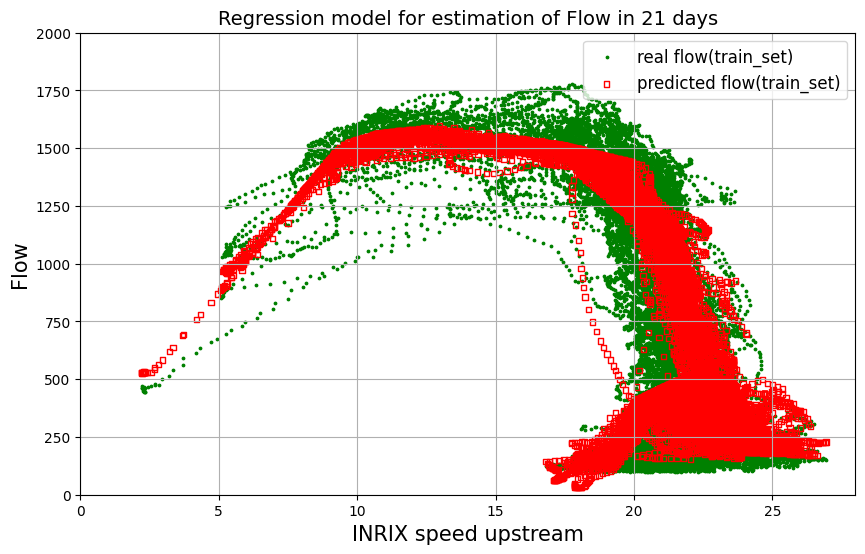

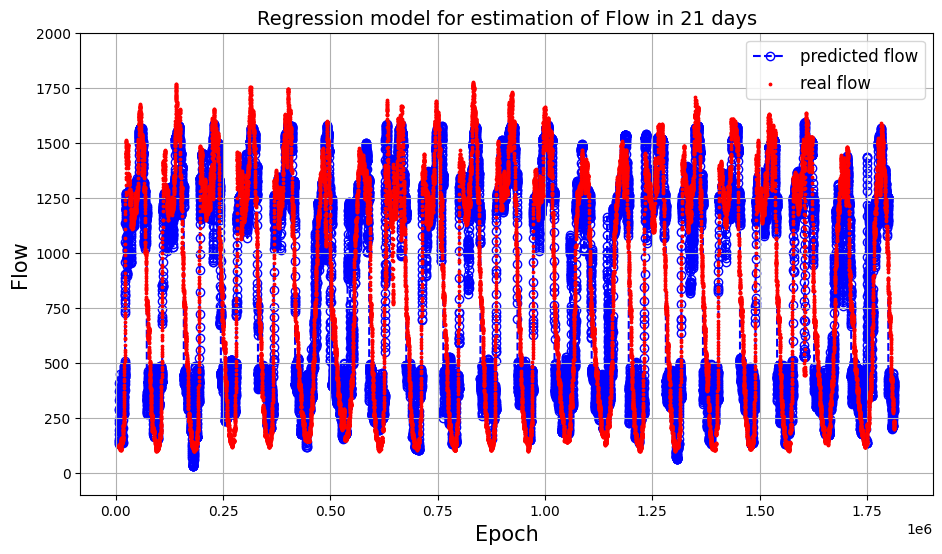

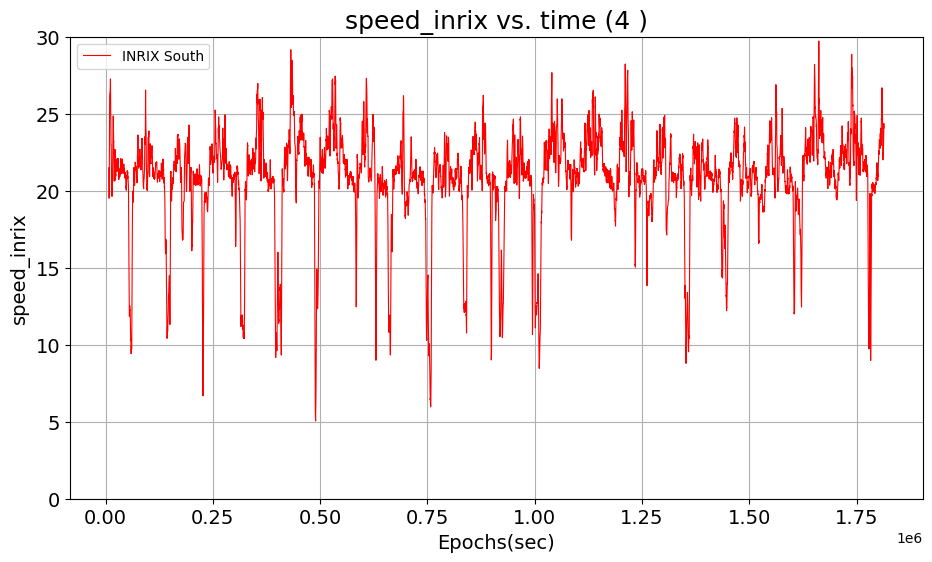

In [ ]:
STARTDATE = 1
ENDDATE = 99
DELTA_STEP1 = 0
DELTA_STEP2 = 0
# Plot real and predicted flow vs. X_features (speed_inrix, current link)
X_features_denormalized = scaler_inrix_speed.inverse_transform(X_features[:,0:-1])
plt.figure(figsize=(10, 6))
plt.ylim(bottom = 0, top=2000)
plt.xlim(left = 0, right=28)
plotResult(X_features_denormalized[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP1: idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2, 0], 
           Y_flow[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP1: idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           Y_predict[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP1 : idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           None,  None, None, '21 days', 'INRIX speed', 'Flow')

# Plot real and predicted flow vs. X_features (speed_inrix, upstream link)
X_features_denormalized = scaler_inrix_speed.inverse_transform(X_features[:,0:-1])
plt.figure(figsize=(10, 6))
plt.ylim(bottom = 0, top=2000)
plt.xlim(left = 0, right=28)
plotResult(X_features_denormalized[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP1: idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2, 1], 
           Y_flow[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP1: idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           Y_predict[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP1 : idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           None,  None, None, '21 days', 'INRIX speed upstream', 'Flow')


# Plot real and predicted flow vs. Epoch 
plt.figure(figsize=(11, 6))
plt.ylim(bottom = -100, top = 2000)
plotResult(X_epoch[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP1:idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           Y_flow[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP1:idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           Y_predict[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP1:idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           None, None, None, '21 days', 'Epoch', 'Flow', 'p')


# Plot corresponding mcs speed 
plt.figure(figsize=(11, 6))
plt.ylim(bottom = 0, top=30)
plotAttr(4, combinedSouth_2w.iloc[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP1:idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 'speed_inrix', 'INRIX South')


In [ ]:
# test the model on the upstream dataset (INRIX North as current segment)

## 1.5 DNN for INRIX data -> MCS Flow (speed + travel time + daytime * 2 links)

main features: speed, travel time, temporal(day/night), spatial(current/upstream)<br>

In [98]:
# prepare the feature "MCS speed" + "temporal factor"
X_epoch = combinedSouth_2w['Epoch_mcs'].values
X_inrix = combinedSouth_2w[['speed_inrix', 'travel_time_secs', 'speed_inrix_up','travel_time_secs_up']].values
X_temporal = combinedSouth_2w['daytime'].values.reshape(-1,1)
Y_flow = combinedSouth_2w['flow'].values

# normalize the speed vector
X_inrix, scaler_inrix_speed = normalize_nobias(X_inrix)

# append temporal factor to the polynomialized/scaled X_mcs_speed
X_inrix = np.append(X_inrix, X_temporal, axis=1)

# code for monitoring feature matrix
# could be commented out while don't want to print out
dfFeatures = pd.DataFrame(X_inrix)
dfFeatures.describe()

,0,1,2,3,4
count,2.838700e+04,2.838700e+04,2.838700e+04,2.838700e+04,28387.000000
mean,7.291483e-16,-5.299871e-16,7.829523e-16,1.129739e-16,0.619509
std,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,0.485516
min,-4.825326e+00,-1.123672e+00,-5.778012e+00,-7.628551e-01,0.000000
25%,-1.274934e-01,-4.056488e-01,-1.564138e-01,-3.231497e-01,0.000000
50%,1.522075e-01,-2.474240e-01,1.680825e-01,-2.092285e-01,1.000000
75%,5.032606e-01,-1.032244e-01,5.226247e-01,-9.098368e-02,1.000000
max,2.780825e+00,1.125867e+01,2.238249e+00,1.919195e+01,1.000000


In [99]:
# assign normalized polynomial features matrix into feature matrix,
# assign predict target to label array
X_features = X_inrix
Y = Y_flow

# split training and test data
X_train, X_test, Y_train, Y_test = train_test_split(X_features, Y, test_size=0.2, random_state=1)

In [100]:
# build the NN model:
n_input = X_train.shape[1:]
model = Model_INRIX(n_input)

# display the model
model.summary()

Model: "DNN_INRIX"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 5)]               0         
_________________________________________________________________
dense_12 (Dense)             (None, 128)               768       
_________________________________________________________________
dense_13 (Dense)             (None, 128)               16512     
_________________________________________________________________
dense_14 (Dense)             (None, 1)                 129       
Total params: 17,409
Trainable params: 17,409
Non-trainable params: 0
_________________________________________________________________


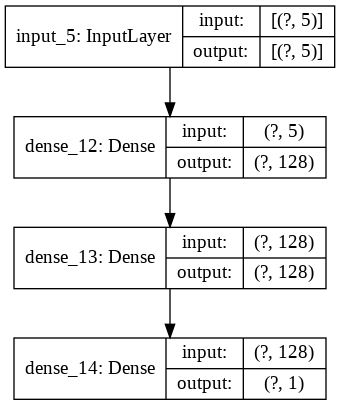

In [101]:
plot_model(model, 'OutData/DNN_MCS.png', show_shapes = True)

In [102]:
# model training
history = model.fit(X_train, Y_train, epochs=100, verbose=1, validation_split=0.1)

Epoch 1/100
639/639 [==============================] - 2s 4ms/step - loss: 306286.9062 - root_mean_squared_error: 553.4319 - val_loss: 56998.4023 - val_root_mean_squared_error: 238.7434
Epoch 2/100
639/639 [==============================] - 2s 3ms/step - loss: 53220.2734 - root_mean_squared_error: 230.6952 - val_loss: 53811.5508 - val_root_mean_squared_error: 231.9732
Epoch 3/100
639/639 [==============================] - 2s 3ms/step - loss: 50706.9141 - root_mean_squared_error: 225.1820 - val_loss: 50454.7031 - val_root_mean_squared_error: 224.6212
Epoch 4/100
639/639 [==============================] - 2s 3ms/step - loss: 48435.6641 - root_mean_squared_error: 220.0810 - val_loss: 47864.8398 - val_root_mean_squared_error: 218.7803
Epoch 5/100
639/639 [==============================] - 2s 3ms/step - loss: 46291.5234 - root_mean_squared_error: 215.1546 - val_loss: 45415.7891 - val_root_mean_squared_error: 213.1098
Epoch 6/100
639/639 [==============================] - 2s 3ms/step - loss:

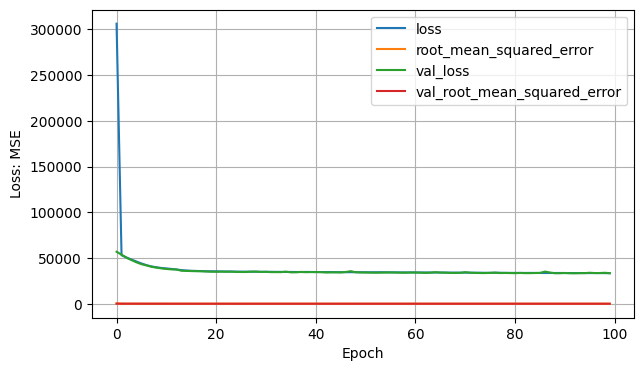

In [103]:
# plot loss and accuracy history
plt.style.use('default')
pd.DataFrame(history.history).plot(figsize=(7,4))
plt.xlabel("Epoch", size=10)
plt.ylabel("Loss: MSE", size=10)
# plt.xlim(left=30, right = 60)
# plt.ylim(top = 40000, bottom=30000)
plt.grid()
plt.show()

In [104]:
# Evaluate Performance (fitting result) of training set
Y_predict_train = model.predict(X_train)
print("Root Mean Square Error for training set: ", mean_squared_error(Y_train, Y_predict_train, squared=False))
print("R2 Score for training set: ", r2_score(Y_train, Y_predict_train))
print()

# Evaluate Performance of testing set
Y_predict_test = model.predict(X_test)
print("Root Mean Square Error: ", mean_squared_error(Y_test, Y_predict_test, squared=False))
print("R2 Score: ", r2_score(Y_test, Y_predict_test))

Root Mean Square Error for training set:  182.8517197172392
R2 Score for training set:  0.8713605614528146

Root Mean Square Error:  180.80693755914643
R2 Score:  0.876604897259633


In [105]:
# Evaluate the model by using future testing data (temporal test set)
df_future = dataFrame[idx(dataFrame, 22):idx(dataFrame, 27)]
X_future_speed = df_future[['speed_inrix', 'travel_time_secs', 'speed_inrix_up','travel_time_secs_up']].values
X_future_temporal = df_future['daytime'].values.reshape(-1, 1)
y_future = df_future['flow'].values

# normalize the speed vector
X_future_speed, scaler_inrix_speed = normalize(X_future_speed, scaler_inrix_speed)

# append temporal factor to the polynomialized/scaled X_mcs_speed
X_future = np.append(X_future_speed, X_future_temporal, axis=1)

dfFeatures = pd.DataFrame(X_future)
dfFeatures.describe()


IndexError: ignored

In [ ]:
y_future_predict = model.predict(X_future)
print("Root Mean Square Error: ", mean_squared_error(y_future, y_future_predict, squared=False))
print("R2 Score: ", r2_score(y_future, y_future_predict))

In [106]:
# Use all data to train and predict the flow
Y_predict = model.predict(X_features)

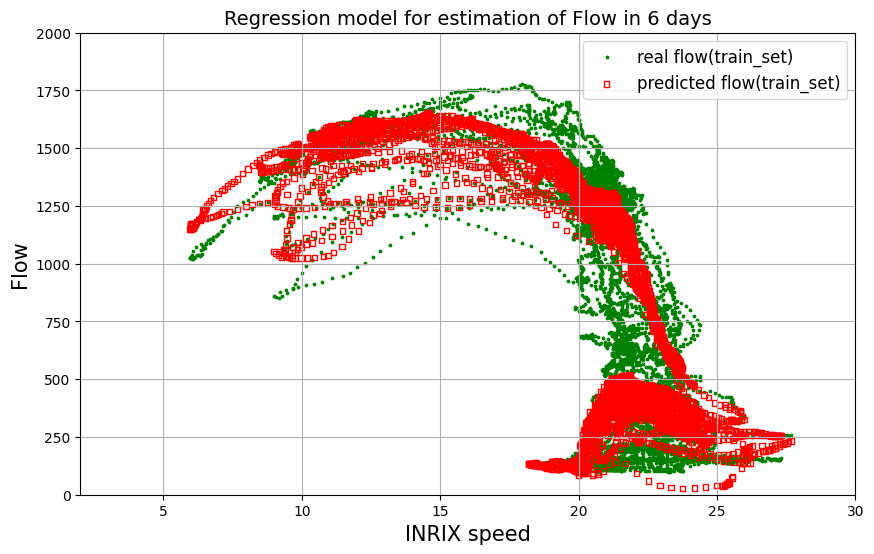

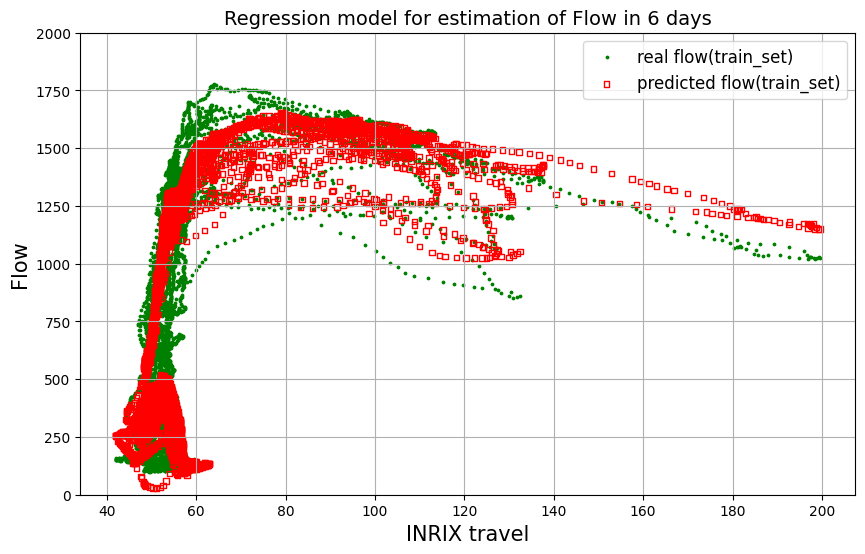

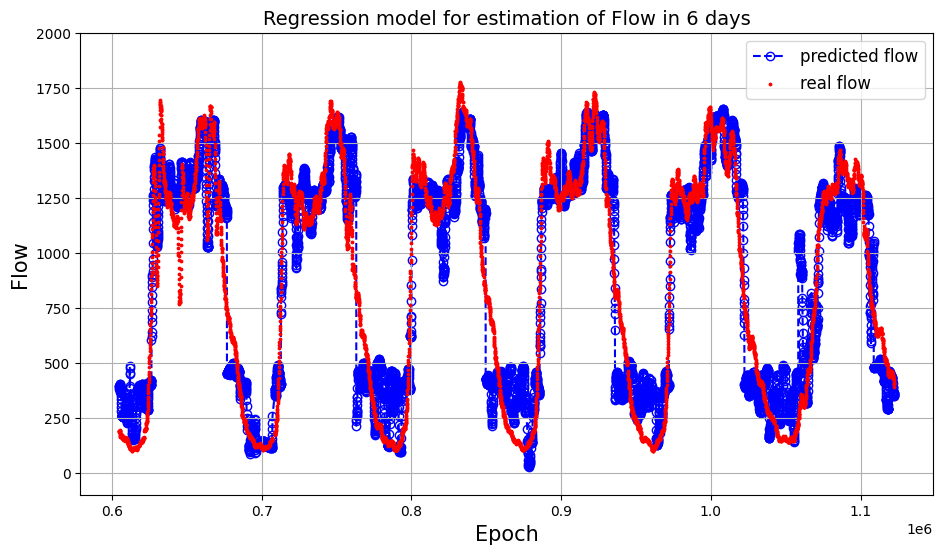

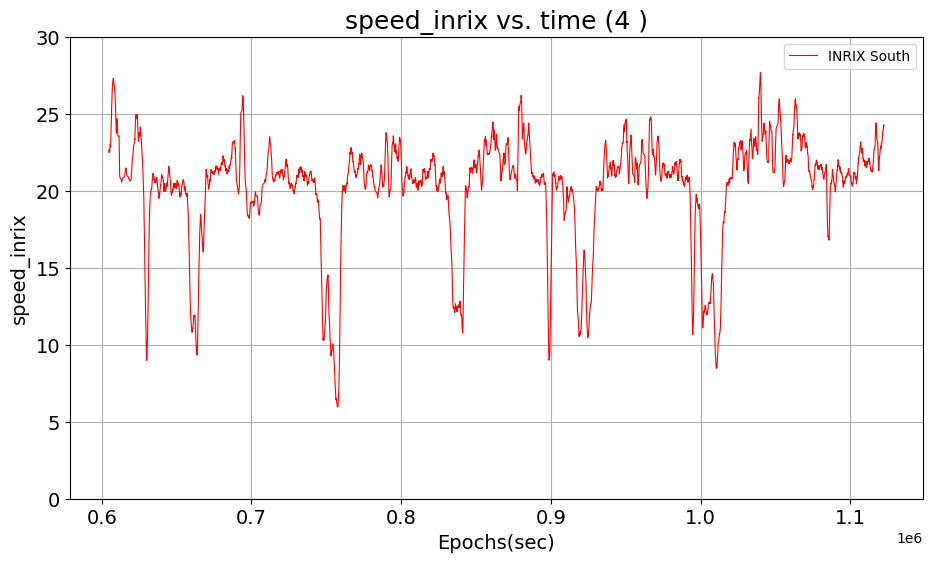

In [107]:
STARTDATE = 8
ENDDATE = 14
DELTA_STEP1 = 0
DELTA_STEP2 = 0
# Plot real and predicted flow vs. X_features (speed_inrix, current link)
X_features_denormalized = scaler_inrix_speed.inverse_transform(X_features[:,0:-1])
plt.figure(figsize=(10, 6))
plt.ylim(bottom = 0, top=2000)
plt.xlim(left = 2, right=30)
plotResult(X_features_denormalized[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP1: idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2, 0], 
           Y_flow[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP1: idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           Y_predict[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP1 : idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           None,  None, None, '6 days', 'INRIX speed', 'Flow')

# Plot real and predicted flow vs. X_features (travel time_inrix, current link)
plt.figure(figsize=(10, 6))
plt.ylim(bottom = 0, top=2000)
# plt.xlim(left = 0, right=28)
plotResult(X_features_denormalized[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP1: idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2, 1], 
           Y_flow[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP1: idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           Y_predict[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP1 : idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           None,  None, None, '6 days', 'INRIX travel', 'Flow')


# Plot real and predicted flow vs. Epoch 
plt.figure(figsize=(11, 6))
plt.ylim(bottom = -100, top = 2000)
plotResult(X_epoch[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP1:idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           Y_flow[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP1:idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           Y_predict[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP1:idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 
           None, None, None, '6 days', 'Epoch', 'Flow', 'p')


# Plot corresponding mcs speed 
plt.figure(figsize=(11, 6))
plt.ylim(bottom = 0, top=30)
plotAttr(4, combinedSouth_2w.iloc[idx(combinedSouth_2w, STARTDATE)+DELTA_STEP1:idx(combinedSouth_2w, ENDDATE) + DELTA_STEP2], 'speed_inrix', 'INRIX South')


In [ ]:
# test the model on the upstream dataset (INRIX North as current segment)

## End
